## 整理数据并入对应的HFDataView

In [1]:
from jaqs_fxdayu.data.hf_dataview import HFDataView

dv1 = HFDataView()
dv5 = HFDataView()
dv15 = HFDataView()
dv30 = HFDataView()
dv60 = HFDataView()
dv240 = HFDataView()
dv480 = HFDataView()

In [2]:
import pandas as pd
import numpy as np
import warnings

warnings.filterwarnings("ignore")
data_excel1 = pd.concat([pd.read_excel('E:/Factor_Scripts/factor-scripts/Alpha101/btc_indicator_test/okex_bch.usdt_2018-01-{}_1min.xlsx'.format(str(n).zfill(2))) for n in range(1,31)])
data_excel2 = pd.concat([pd.read_excel('E:/Factor_Scripts/factor-scripts/Alpha101/btc_indicator_test/okex_bch.usdt_2018-02-{}_1min.xlsx'.format(str(n).zfill(2))) for n in range(1,28)])
data_excel3 = pd.concat([pd.read_excel('E:/Factor_Scripts/factor-scripts/Alpha101/btc_indicator_test/okex_bch.usdt_2018-03-{}_1min.xlsx'.format(str(n).zfill(2))) for n in range(1,31)])
data_excel4 = pd.concat([pd.read_excel('E:/Factor_Scripts/factor-scripts/Alpha101/btc_indicator_test/okex_bch.usdt_2018-04-{}_1min.xlsx'.format(str(n).zfill(2))) for n in range(1,30)])
data_excel5 = pd.concat([pd.read_excel('E:/Factor_Scripts/factor-scripts/Alpha101/btc_indicator_test/okex_bch.usdt_2018-05-{}_1min.xlsx'.format(str(n).zfill(2))) for n in range(1,29)])
data_excel = pd.concat([data_excel1,data_excel2,data_excel3,data_excel4,data_excel5])

In [3]:
data_excel["trade_date"] = data_excel["time"].apply(lambda x:int(x.strftime(format="%Y-%m-%d %H:%M:%S").replace("-","").replace(":","").replace(" ","")))
data_excel["symbol"] = "btc_usdt"
data_excel['usdt'] = 6.4
data_excel = data_excel.set_index(["trade_date","symbol"])
dv1.create_init_dv(data_excel) # 用来初始化dv

Initialize dataview success.


In [4]:
data_time = data_excel.set_index('time').dropna()

In [5]:
TimePeriodDict = {t:data_time.resample(t).agg({'high':'max','open':'first','close':'last','low':'min','volume':'sum','amount':'sum'}).dropna() for t in ['5Min', '15Min', "30Min", '1H', '4H', '8H']}

In [6]:
def Time_Dict(t_list=['5Min', '15Min', "30Min", '1H', '4H', '8H']):
    for t in t_list:
        TimePeriodDict[t]['time'] = TimePeriodDict[t].index
        TimePeriodDict[t]["trade_date"] = TimePeriodDict[t]['time'].apply(lambda x:int(x.strftime(format="%Y-%m-%d %H:%M:%S").replace("-","").replace(":","").replace(" ","")))
        TimePeriodDict[t]["symbol"] = "btc_usdt"
        TimePeriodDict[t]['usdt'] = 6.4
        TimePeriodDict[t] = TimePeriodDict[t].set_index(["trade_date","symbol"])
    return TimePeriodDict

In [7]:
Time_dict = Time_Dict()

In [8]:
dv5.create_init_dv(Time_dict['5Min'])
dv15.create_init_dv(Time_dict['15Min'])
dv30.create_init_dv(Time_dict['30Min'])
dv60.create_init_dv(Time_dict['1H'])
dv240.create_init_dv(Time_dict['4H'])
dv480.create_init_dv(Time_dict['8H'])

Initialize dataview success.
Initialize dataview success.
Initialize dataview success.
Initialize dataview success.
Initialize dataview success.
Initialize dataview success.


In [9]:
for dv in [dv1, dv5, dv15, dv30, dv60, dv240, dv480]:
    dv.add_formula('vwap_c','amount/(volume*usdt)', add_data=True)

## 编写不同的画图方法

In [19]:
import talib as ta
import matplotlib.pyplot as plt

def Plot_MA(dv, alpha, chart_name='dv_alpha_ma', ShortPeriod=20, LongPeriod=60, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(alpha.iloc[n:], alpha=0.1)
    ax1.plot(pd.Series(ta.MA(alpha.values, ShortPeriod), index=alpha.index).iloc[n:])
    ax1.plot(pd.Series(ta.MA(alpha.values, LongPeriod), index=alpha.index).iloc[n:])
    
    plt.savefig(chart_name)
    plt.show()

In [11]:
def Plot_EMA(dv, alpha, chart_name='dv_alpha_ma', ShortPeriod=20, LongPeriod=60, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(alpha.iloc[n:], alpha=0.1)
    ax1.plot(pd.Series(ta.EMA(alpha.values, ShortPeriod), index=alpha.index).iloc[n:])
    ax1.plot(pd.Series(ta.EMA(alpha.values, LongPeriod), index=alpha.index).iloc[n:])
    plt.savefig(chart_name)
    plt.show()

In [12]:
def Plot_DEMA(dv, alpha, chart_name='dv_alpha_ma', ShortPeriod=20, LongPeriod=60, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(alpha.iloc[n:], alpha=0.1)
    ax1.plot(pd.Series(ta.DEMA(alpha.values, ShortPeriod), index=alpha.index).iloc[n:])
    ax1.plot(pd.Series(ta.DEMA(alpha.values, LongPeriod), index=alpha.index).iloc[n:])
    plt.savefig(chart_name)
    plt.show()

In [13]:
def Plot_WMA(dv, alpha, chart_name='dv_alpha_ma', ShortPeriod=20, LongPeriod=60, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(alpha.iloc[n:], alpha=0.1)
    ax1.plot(pd.Series(ta.EMA(alpha.values, ShortPeriod), index=alpha.index).iloc[n:])
    ax1.plot(pd.Series(ta.EMA(alpha.values, LongPeriod), index=alpha.index).iloc[n:])
    
    plt.savefig(chart_name)
    plt.show()

In [14]:
def Plot_Slope(dv, alpha, chart_name='dv_alpha_slope', ShortPeriod=20, LongPeriod=60, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(pd.Series(0,index=alpha.index).iloc[n:], alpha=0.1)
    ax1.plot(pd.Series(ta.LINEARREG_SLOPE(alpha.values, ShortPeriod), index=alpha.index).iloc[n:])
    ax1.plot(pd.Series(ta.LINEARREG_SLOPE(alpha.values, LongPeriod), index=alpha.index).iloc[n:])
    
    plt.savefig(chart_name)
    plt.show()

In [35]:
def Plot_Slope_Sum(dv, alpha, chart_name='dv_alpha_slope', ShortPeriod=20, LongPeriod=60, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(pd.Series(0,index=alpha.index).iloc[n:], alpha=0.1)
    ax1.plot(pd.Series(ta.LINEARREG_SLOPE(alpha.values, ShortPeriod), index=alpha.index).rolling(ShortPeriod).sum().iloc[n:])
    ax1.plot(pd.Series(ta.LINEARREG_SLOPE(alpha.values, LongPeriod), index=alpha.index).rolling(ShortPeriod).sum().iloc[n:])
    
    plt.savefig(chart_name)
    plt.show()

In [15]:
def Plot_Mean(dv, alpha, chart_name='dv_alpha_mean', ShortPeriod=20, LongPeriod=60, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(alpha.iloc[n:], alpha=0.1)
    ax1.plot(alpha.rolling(ShortPeriod).mean().iloc[n:])
    ax1.plot(alpha.rolling(LongPeriod).mean().iloc[n:])
    
    plt.savefig(chart_name)
    plt.show()

In [114]:
def Plot_Mean_Mean(dv, alpha, chart_name='dv_alpha_mean', Mean1Period=20, Mean2Period=60, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(alpha.iloc[n:], alpha=0.1)
    ax1.plot(alpha.rolling(Mean1Period).mean().iloc[n:])
    ax1.plot(alpha.rolling(Mean1Period).mean().rolling(Mean2Period).mean().iloc[n:])
    
    plt.savefig(chart_name)
    plt.show()

In [29]:
def Plot_CumsumMean(dv, alpha, chart_name='dv_alpha_CumsumMean', ShortPeriod=5, LongPeriod=10, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(alpha.iloc[n:], alpha=0.1)
    ax1.plot(alpha.rolling(ShortPeriod).sum().iloc[n:])
    ax1.plot((alpha.rolling(LongPeriod).sum()/(LongPeriod/ShortPeriod)).iloc[n:])
    
    plt.savefig(chart_name)
    plt.show()

In [67]:
def Plot_Cumsum_Mean(dv, alpha, chart_name='dv_alpha_CumsumMean', SumPeriod=5, MeanPeriod=10, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(alpha.iloc[n:], alpha=0.1)
    ax1.plot(alpha.rolling(SumPeriod).sum().iloc[n:])
    ax1.plot((alpha.rolling(SumPeriod).sum().rolling(MeanPeriod).mean()).iloc[n:])
    
    plt.savefig(chart_name)
    plt.show()

In [90]:
def Plot_Cumsum_SMA_LMA(dv, alpha, chart_name='dv_alpha_CumsumMean', SumPeriod=5, ShortPeriod=10,LongPeriod=20, n=0):
    fig,(ax,ax1) = plt.subplots(2,1,sharex=True, figsize=(15,15))
    ax.plot(dv.get_ts('close', date_type='datetime').iloc[n:])
    ax.set_title(chart_name,fontsize=24,color='b') 
    ax1.plot(alpha.iloc[n:], alpha=0.1)
    ax1.plot(alpha.rolling(SumPeriod).sum().iloc[n:],alpha=0.2)
    ax1.plot((alpha.rolling(SumPeriod).sum().rolling(ShortPeriod).mean()).iloc[n:])
    ax1.plot((alpha.rolling(SumPeriod).sum().rolling(LongPeriod).mean()).iloc[n:])
    plt.savefig(chart_name)
    plt.show()

## Observation_Alpha1(Del Rank)

In [16]:
 for dv in [dv1, dv5, dv15, dv30, dv60, dv240, dv480]:
        dv.add_formula('alpha1_C','Ts_Argmax(SignedPower(If(Return(close,1)<0, StdDev(Return(close,1),20),close),2),5)',add_data=True)

In [17]:
dv_dict = {'alpha1_dv1':dv1, 'alpha1_dv5': dv5, 'alpha1_dv15':dv15, 'alpha1_dv30':dv30, 'alpha1_dv60':dv60, 'alpha1_dv240':dv240, 'alpha1_dv480':dv480}
alpha1_dict = {n: dv.get_ts('alpha1_C', date_type='datetime').btc_usdt for n, dv in dv_dict.items()}

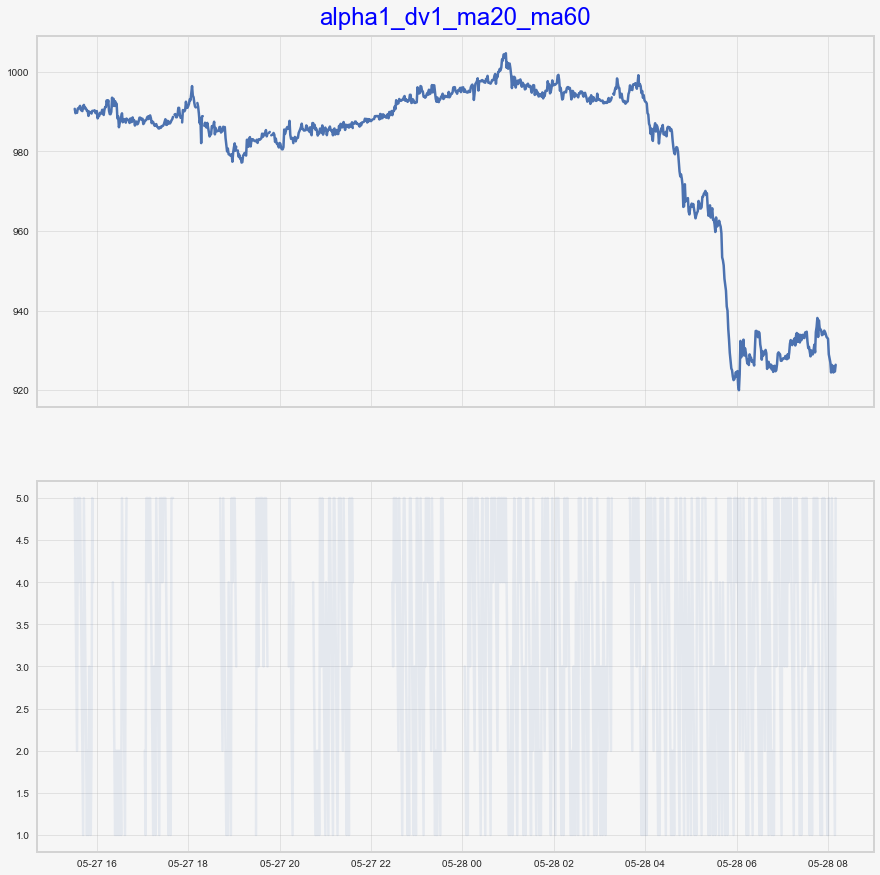

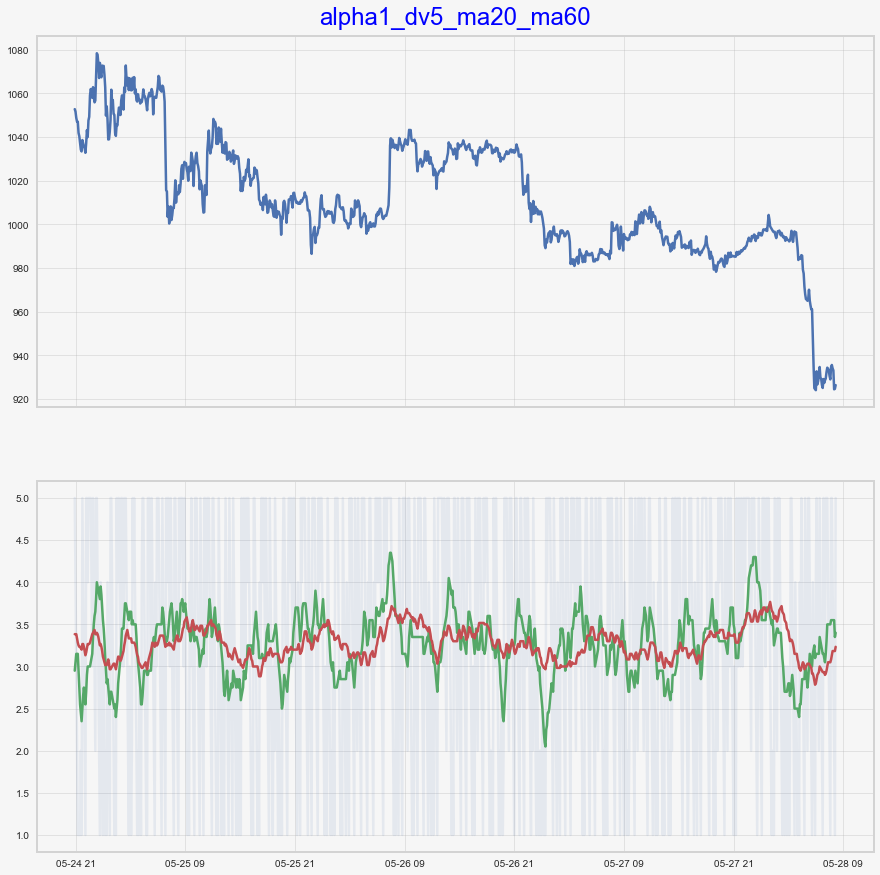

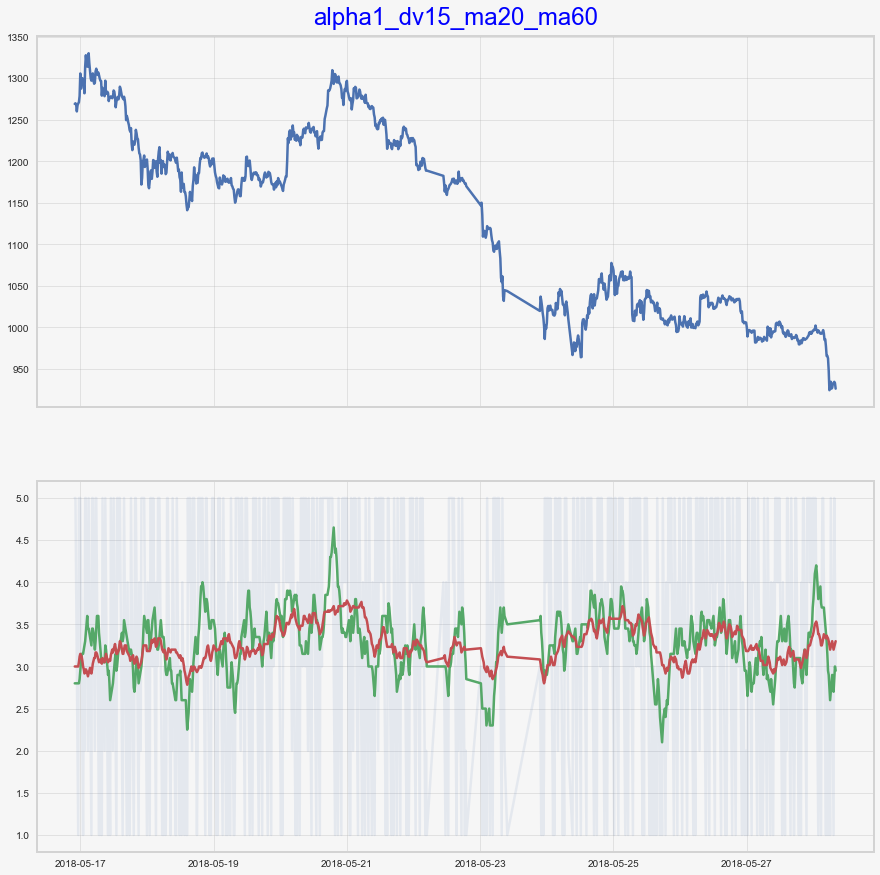

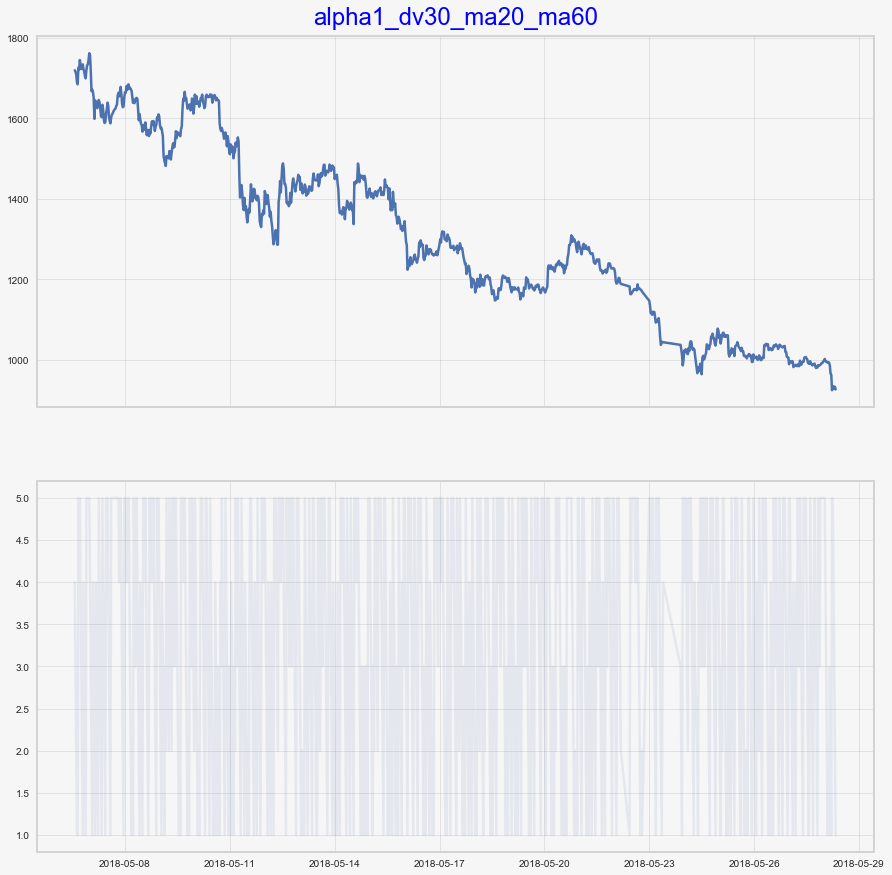

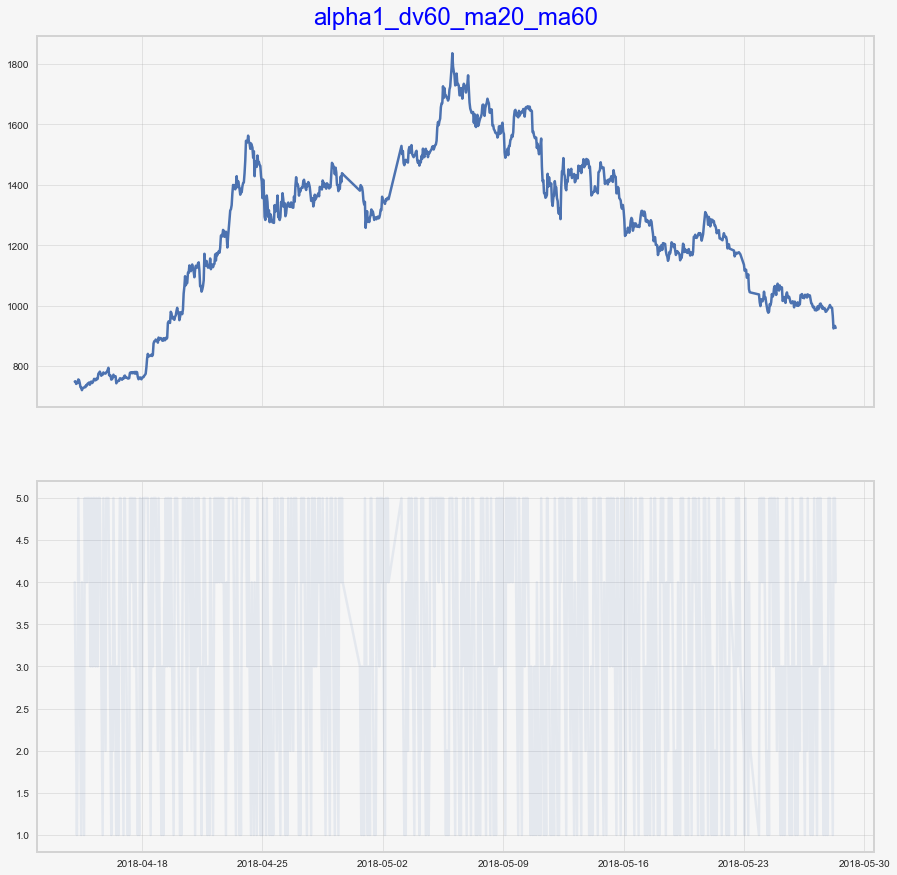

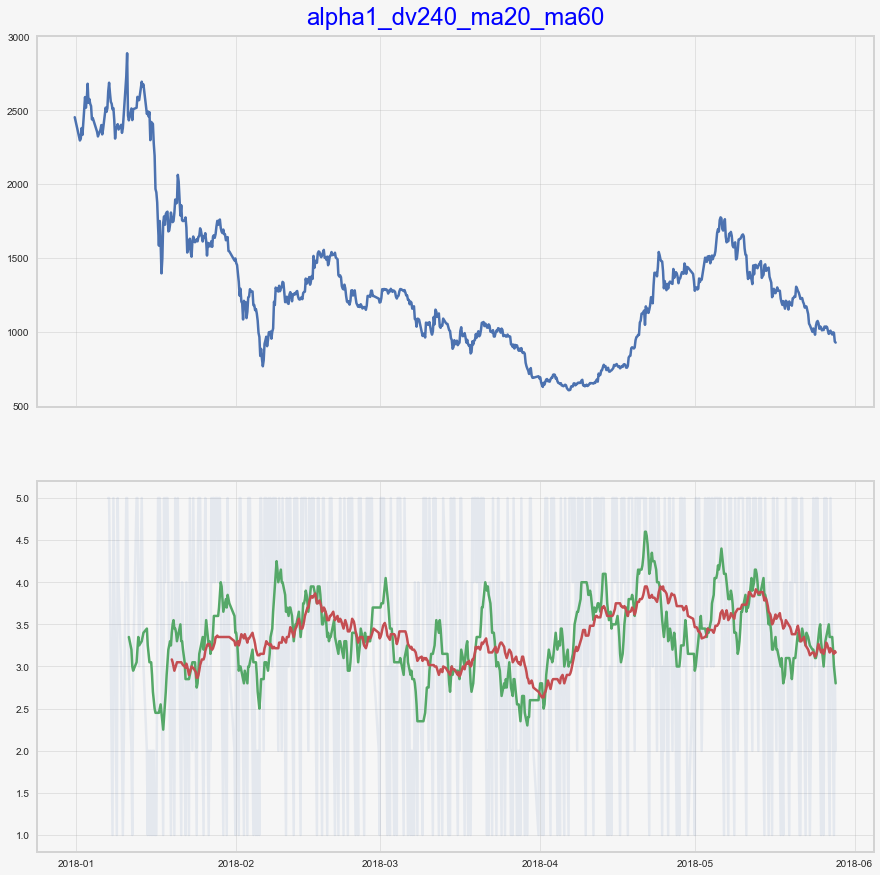

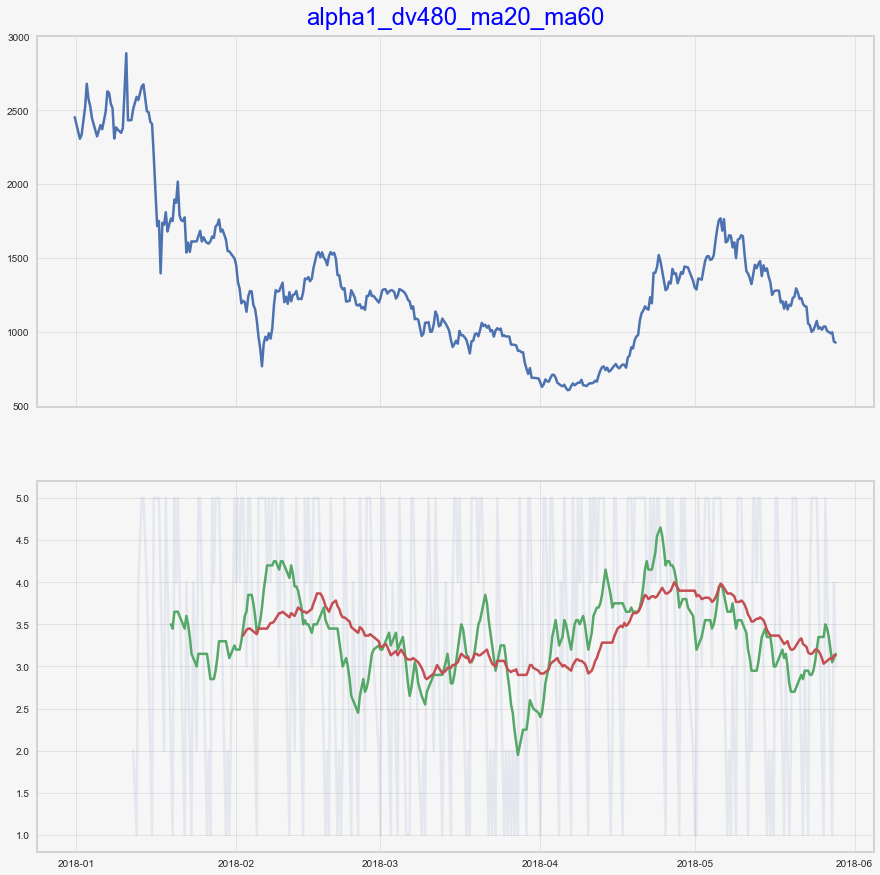

In [24]:
for name, alpha in alpha1_dict.items():
    Plot_MA(globals()[name.split('_')[1]], alpha, chart_name=name+'_ma20_ma60',ShortPeriod=20, LongPeriod=60, n=-1000)

## 假设 Alpha1在4H和8H下的MA金叉死叉收益为0

In [21]:
# 进场信号 3日均线cross5日均线
long = dv480.add_formula("long","If((Ts_Mean(alpha1_C,20)>Ts_Mean(alpha1_C,60)) && (Delay(Ts_Mean(alpha1_C,20),1)<Delay(Ts_Mean(alpha1_C,60),1)),2,0)", add_data=True)
short = dv480.add_formula("short","If((Ts_Mean(alpha1_C,20)<Ts_Mean(alpha1_C,60)) && (Delay(Ts_Mean(alpha1_C,20),1)>Delay(Ts_Mean(alpha1_C,60),1)),-2,0)", add_data=True)

# 出场信号 3日均线cross5日均线
close_long = dv480.add_formula("close_long","If(short==-2,1,0)", add_data=True)
close_short = dv480.add_formula("close_short","If(long==2,-1,0)", add_data=True)

# 汇总
enter = dv480.add_formula("enter","long+short", add_data=True)
exit = dv480.add_formula("exit","close_long+close_short", add_data=True) 

In [22]:
from jaqs_fxdayu.research import TimingDigger

# step 1：实例化TimingDigger 通过output_folder和output_format指定测试报告的输出路径和输出格式，通过signal_name指定绩效文件名称
td1 = TimingDigger(output_folder=".", output_format='pdf')

# 多空分别计算一遍 输出汇总结果
td1.process_signal(
    enter_signal=dv480.get_ts("enter"),
    exit_signal=dv480.get_ts("exit"),
    sig_type="long",  # 信号类型 long/short
    price=dv480.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.3,  # 止损百分比 负数 可为空
#     stopprofit=0.6,  # 止盈百分比 正数 可为空
)

#多空分别计算一遍 输出汇总结果
td1.process_signal(
    enter_signal=dv480.get_ts("short"),
    exit_signal=dv480.get_ts("close_short"),
    sig_type="short",  # 信号类型 long/short
    price=dv480.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.01,  # 止损百分比 负数 可为空
#     stopprofit=0.03,  # 止盈百分比 正数 可为空
)

Nan Data Count (should be zero) : 0;  Percentage of effective data: 1%
Nan Data Count (should be zero) : 0;  Percentage of effective data: 1%


In [23]:
td1.create_event_report(sig_type="long_short",
                       by_symbol=True)

*****-Summary-*****
Event Analysis
                      win   loss     all
t-stat              1.966 -3.127   1.091
p-value             0.121  0.035   0.304
mean                0.332 -0.097   0.118
std                 0.338  0.062   0.324
info_ratio          0.983 -1.563   0.364
skewness            1.182 -0.557   1.712
kurtosis           -0.110 -1.097   2.160
pct5                0.032 -0.185  -0.169
pct25               0.151 -0.132  -0.068
pct50               0.241 -0.073  -0.012
pct75               0.288 -0.054   0.218
pct95               0.840 -0.031   0.668
occurance           5.000  5.000  10.000
win_ratio             NaN    NaN   0.500
win_mean/loss_mean    NaN    NaN   3.438


## Observation_Alpha2(Del Rank)

In [111]:
 for dv in [dv1, dv5, dv15, dv30, dv60, dv240, dv480]:
        dv.add_formula('alpha2_C','Correlation(Delta(Log(volume),2),((close-open)/open),6)',add_data=True)

Field [alpha2_C] is overwritten.
Field [alpha2_C] is overwritten.
Field [alpha2_C] is overwritten.
Field [alpha2_C] is overwritten.
Field [alpha2_C] is overwritten.
Field [alpha2_C] is overwritten.


In [112]:
dv_dict = {'alpha2_dv1':dv1, 'alpha2_dv5': dv5, 'alpha2_dv15':dv15, 'alpha2_dv30':dv30, 'alpha2_dv60':dv60, 'alpha2_dv240':dv240, 'alpha2_dv480':dv480}
alpha2_dict = {n: dv.get_ts('alpha2_C', date_type='datetime').btc_usdt for n, dv in dv_dict.items()}

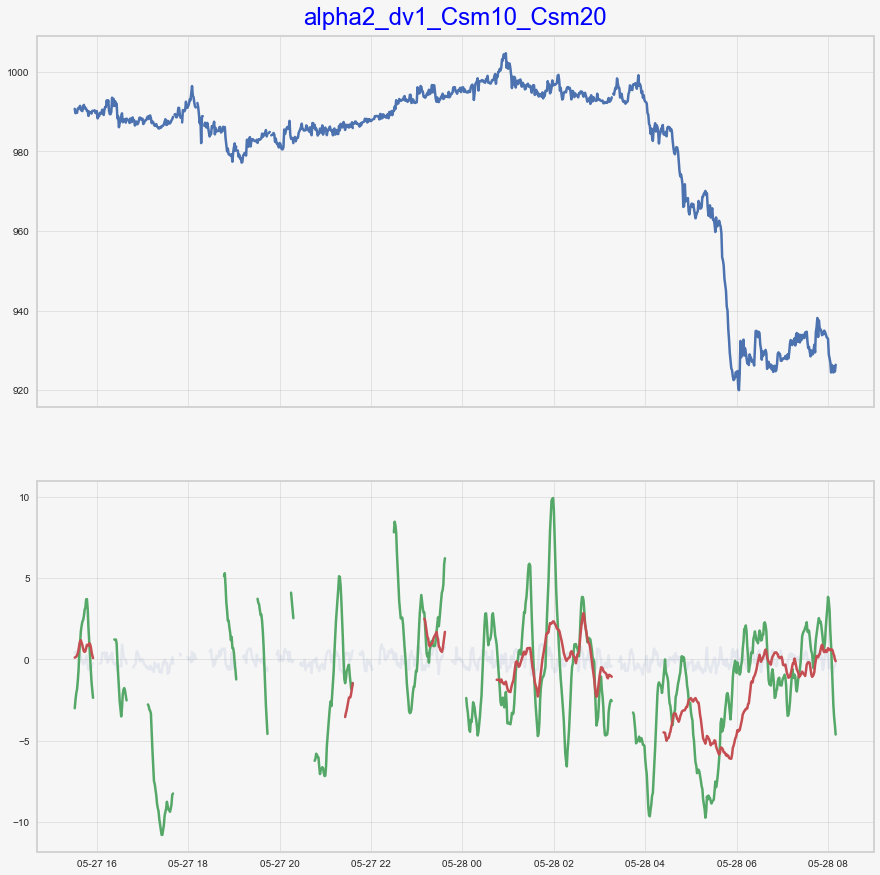

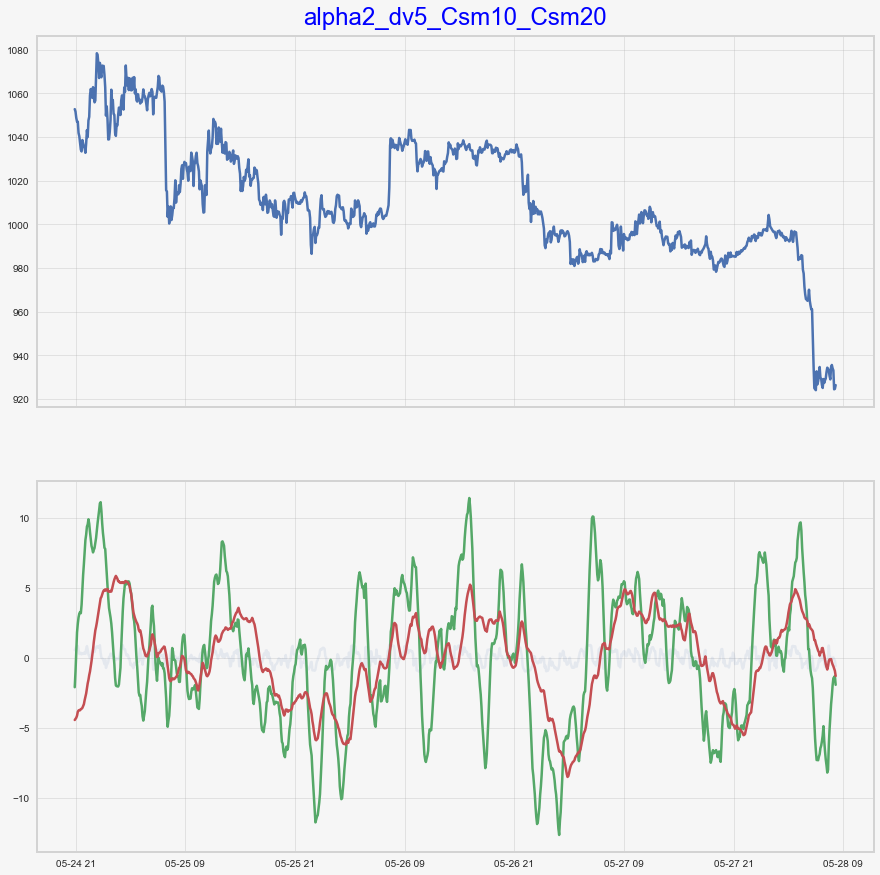

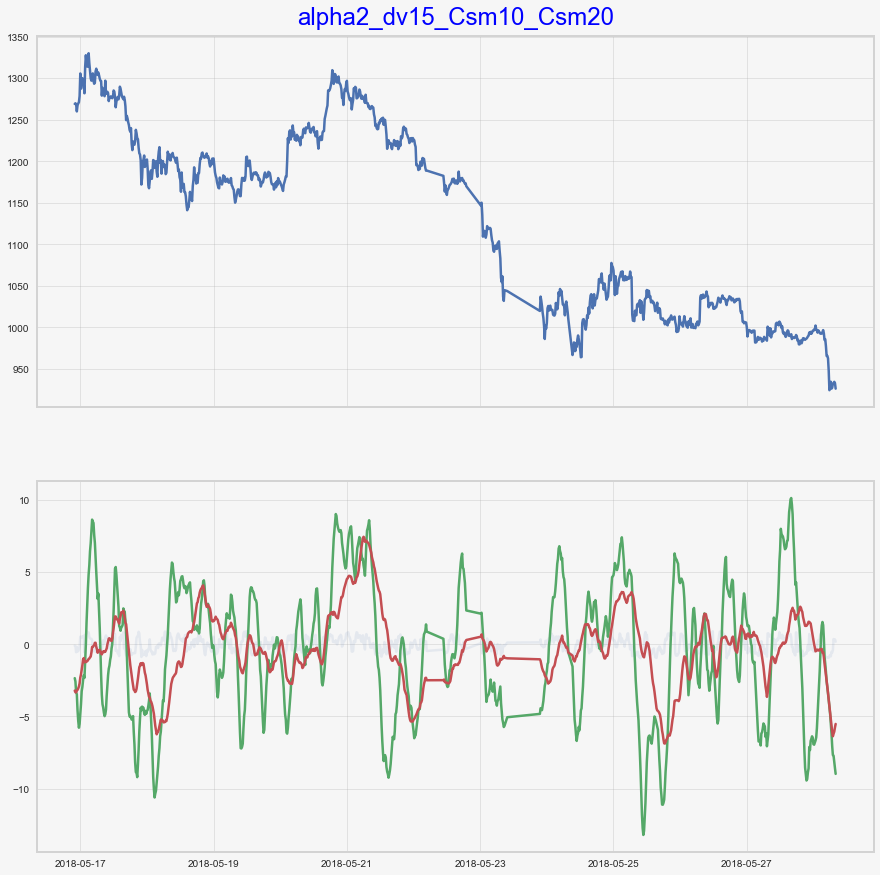

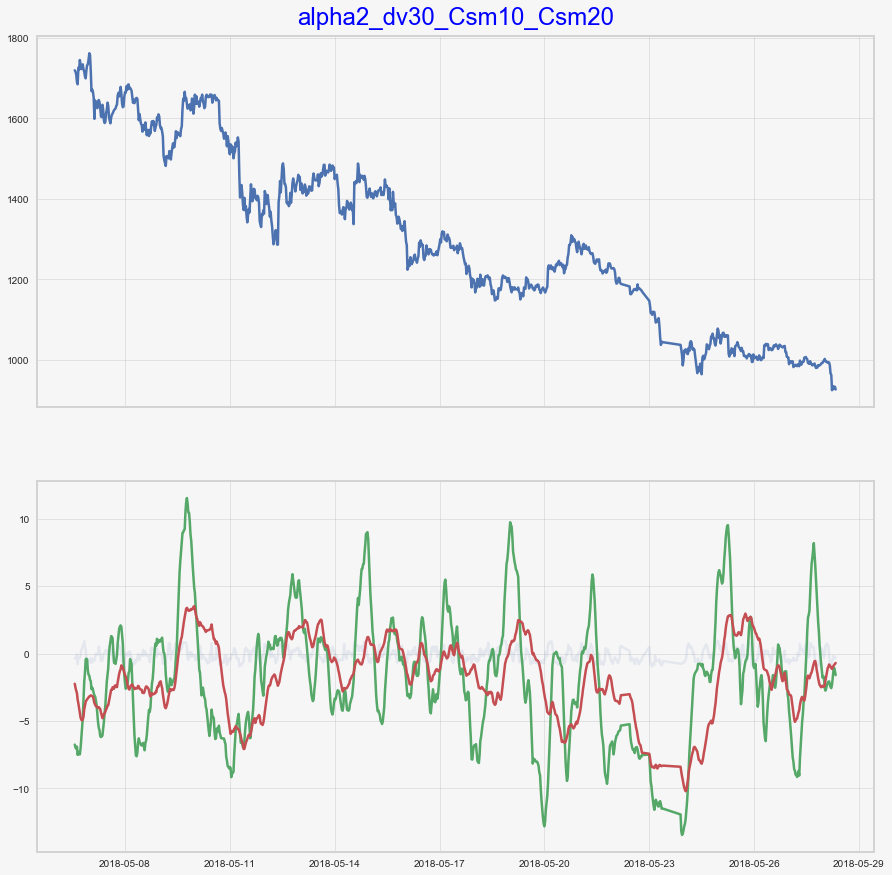

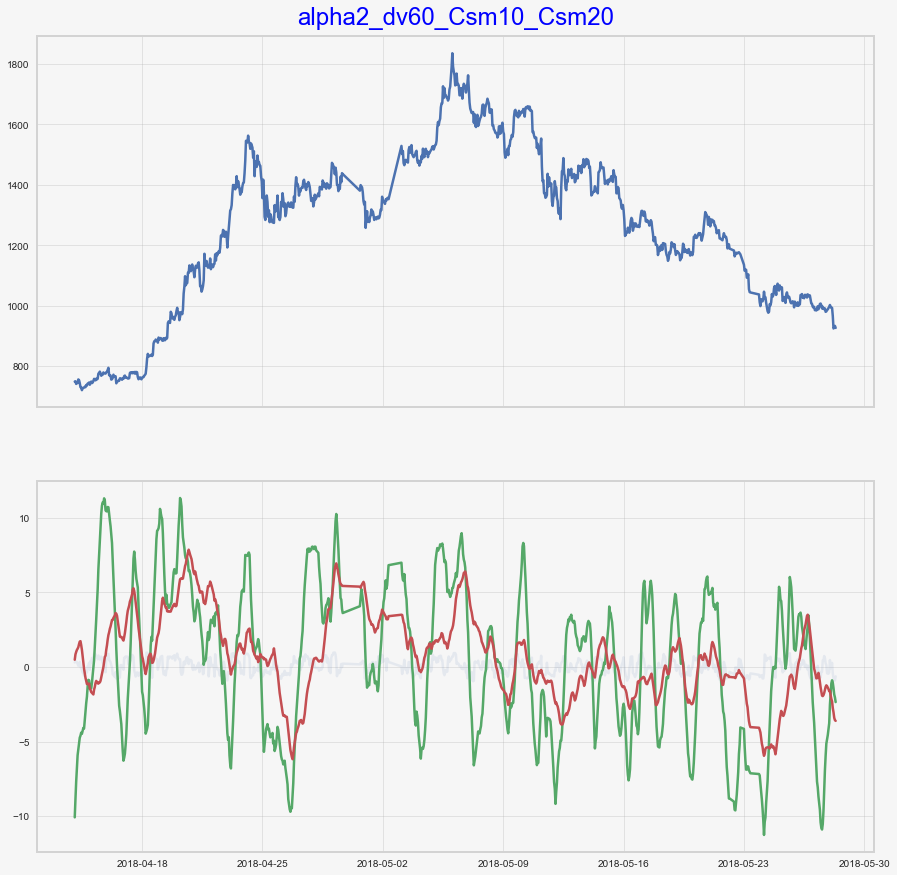

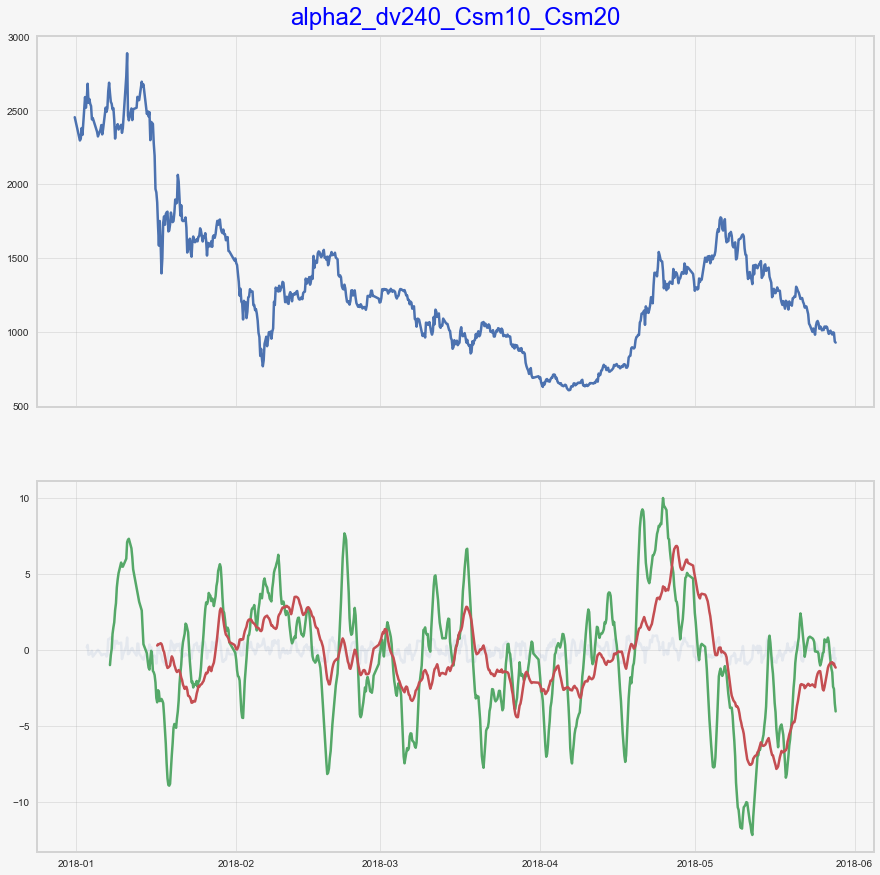

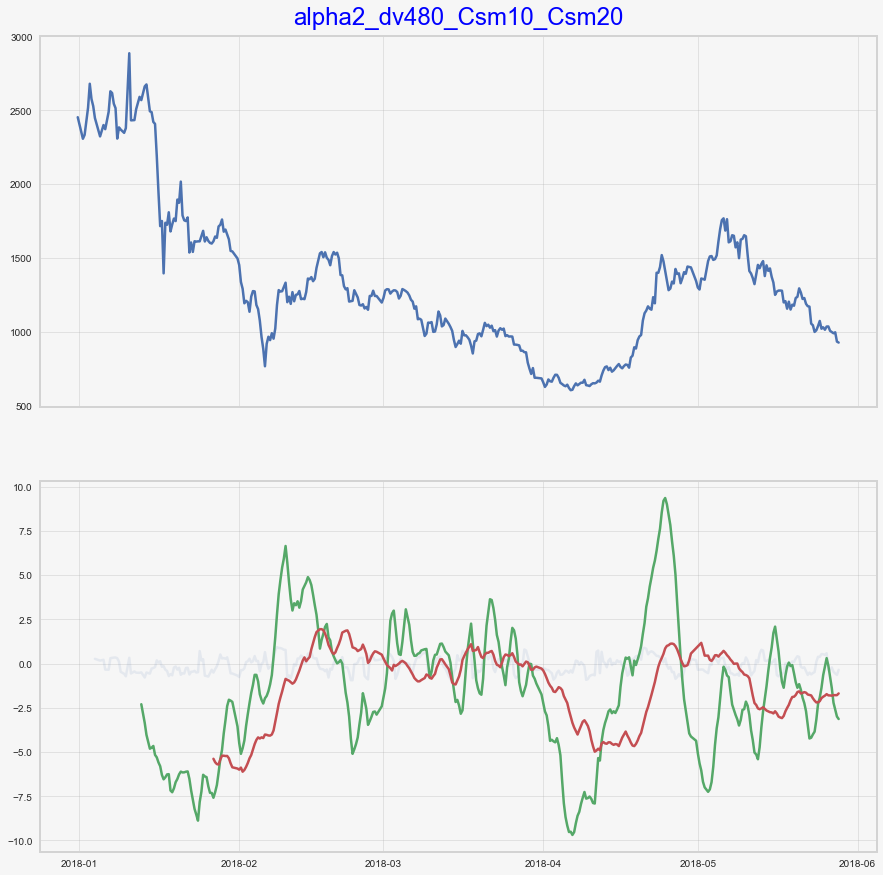

In [113]:
for name, alpha in alpha2_dict.items():
    Plot_CumsumMean(globals()[name.split('_')[1]], alpha, chart_name=name+'_Csm10_Csm20',ShortPeriod=20, LongPeriod=60, n=-1000)

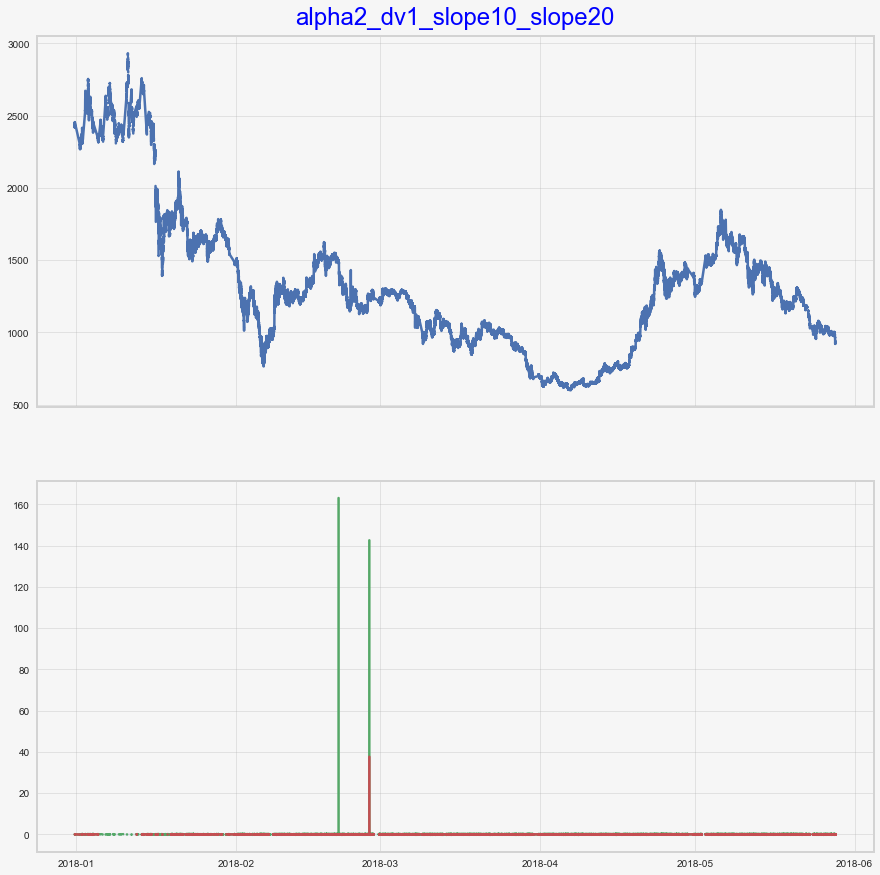

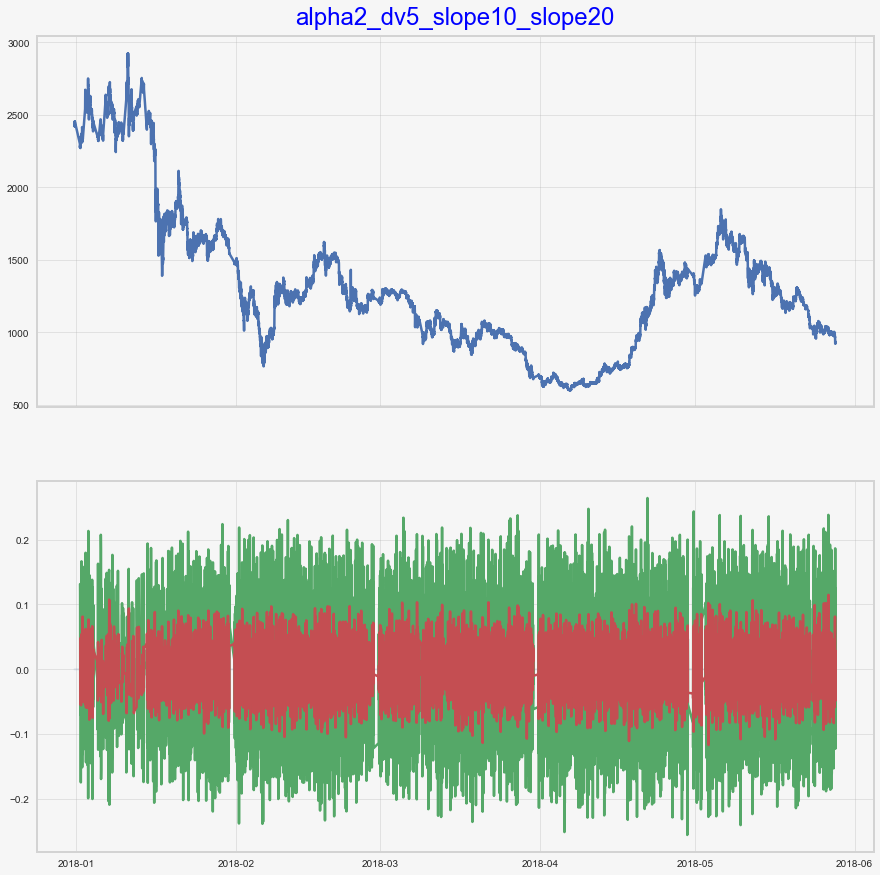

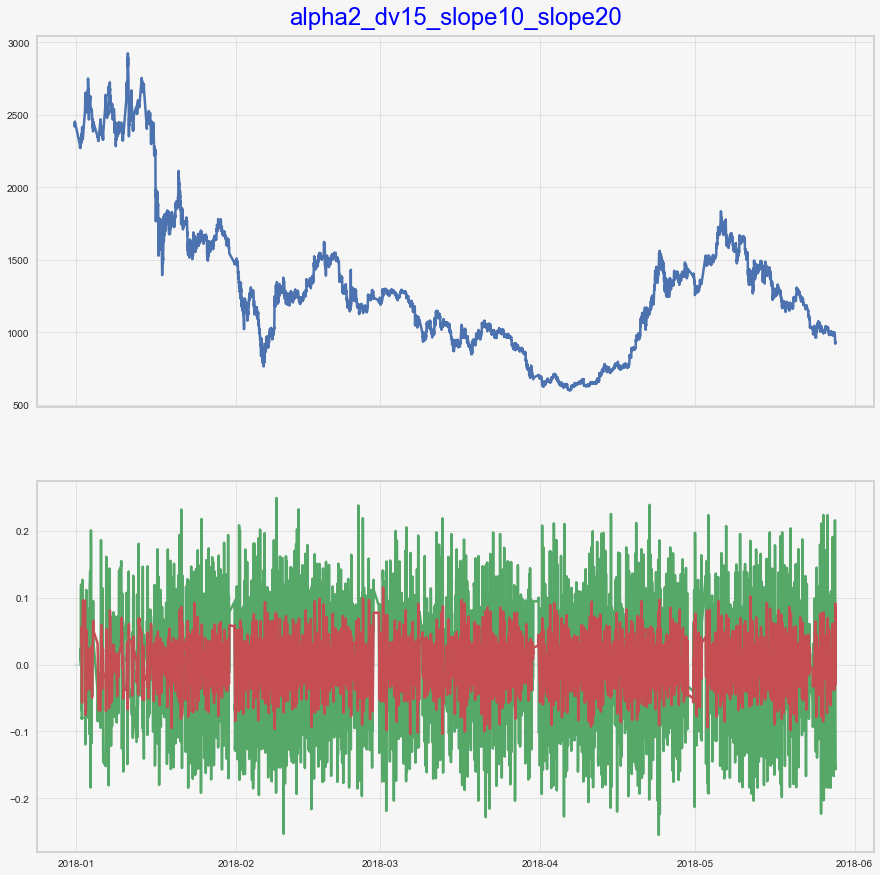

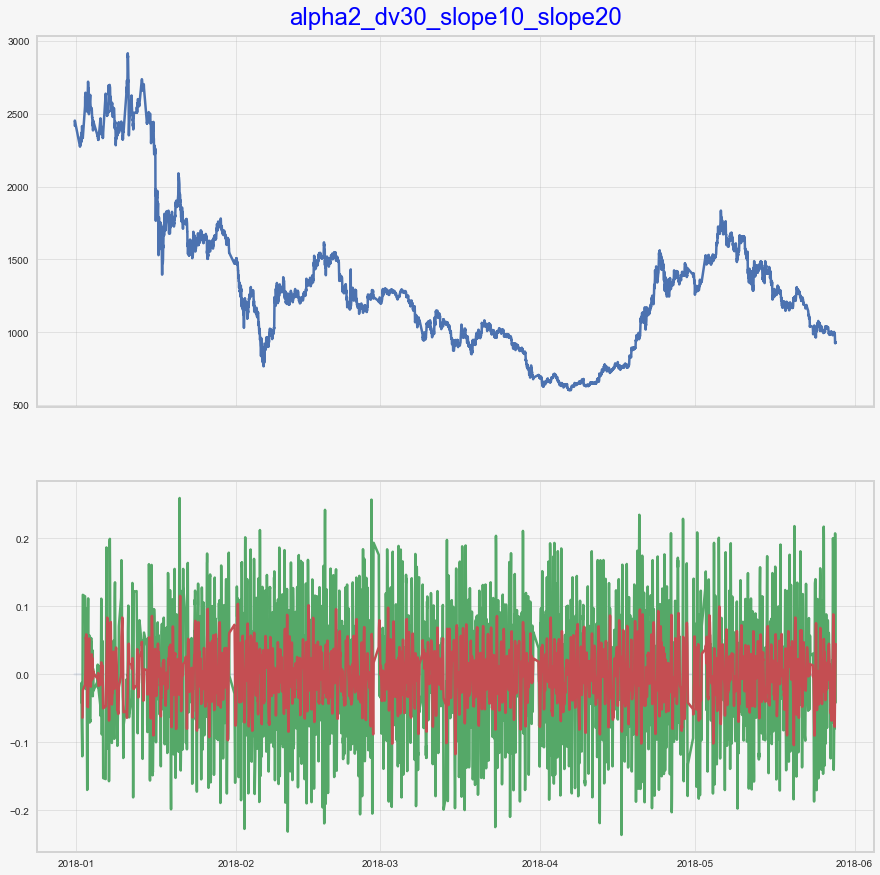

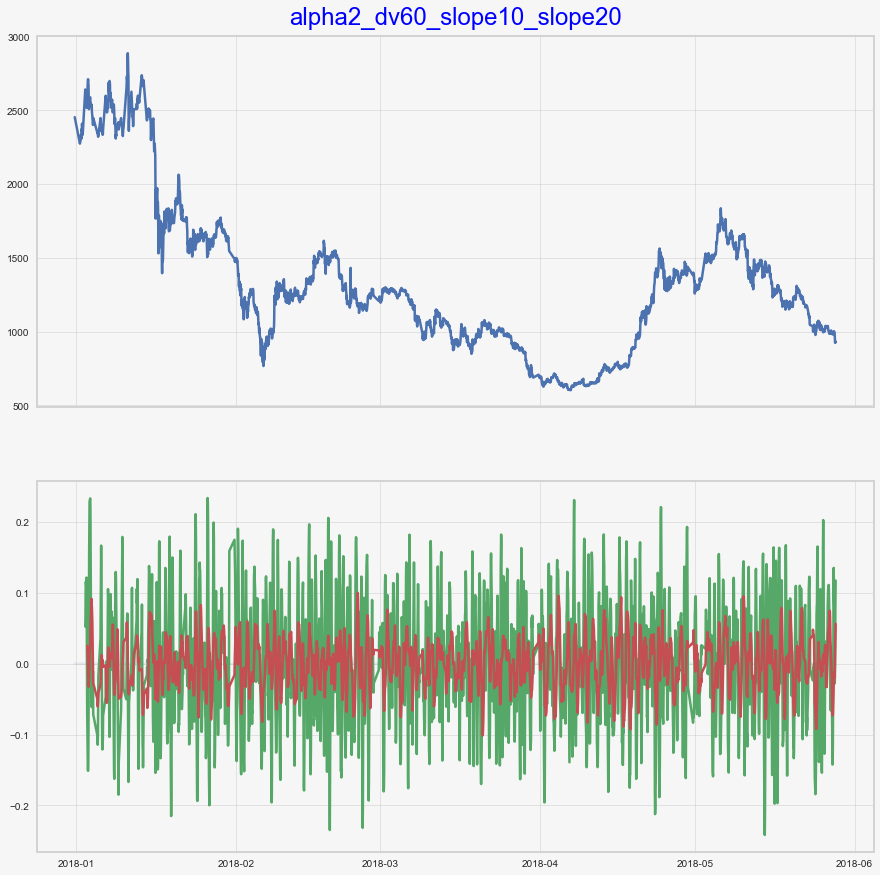

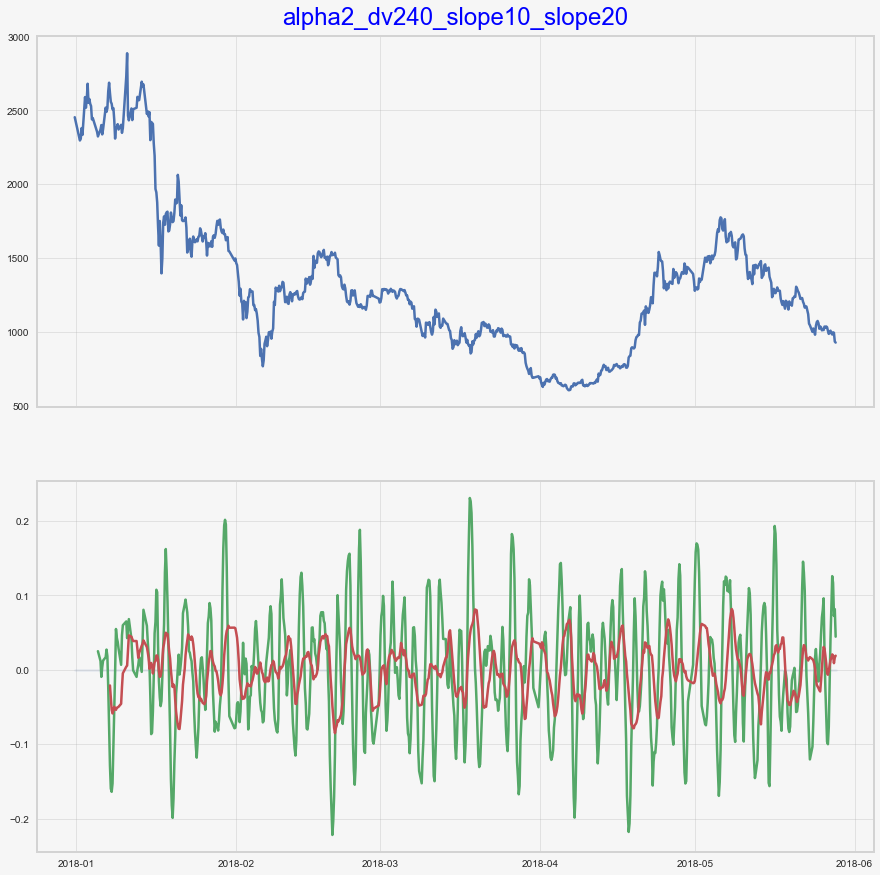

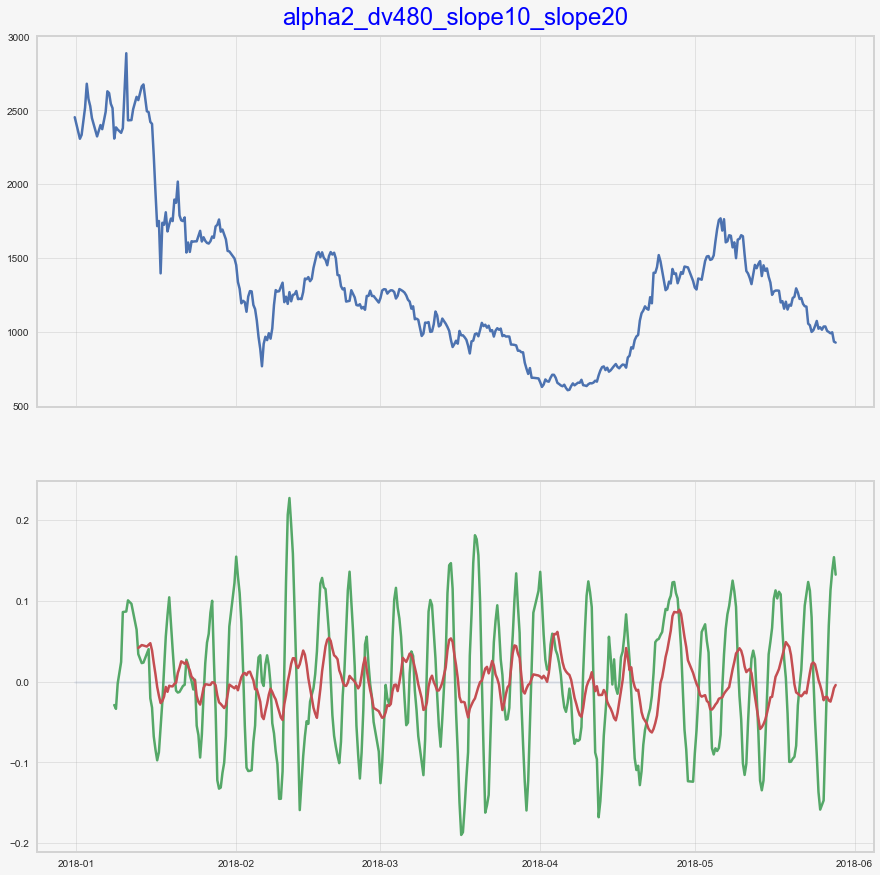

In [59]:
for name, alpha in alpha2_dict.items():
    Plot_Slope(globals()[name.split('_')[1]], alpha, chart_name=name+'_slope10_slope20',ShortPeriod=10, LongPeriod=20, n=0)

## Observation_Alpha3(Del Rank) = Alpha6

In [32]:
for dv in [dv1, dv5, dv15, dv30, dv60, dv240, dv480]:
    dv.add_formula(field_name='alpha6_C',formula='-1*Correlation(open,volume,10)',add_data=True)

In [33]:
dv_dict = {'alpha6_dv1':dv1, 'alpha6_dv5': dv5, 'alpha6_dv15':dv15, 'alpha6_dv30':dv30, 'alpha6_dv60':dv60, 'alpha6_dv240':dv240, 'alpha6_dv480':dv480}
alpha6_dict = {n: dv.get_ts('alpha6_C', date_type='datetime').btc_usdt for n, dv in dv_dict.items()}

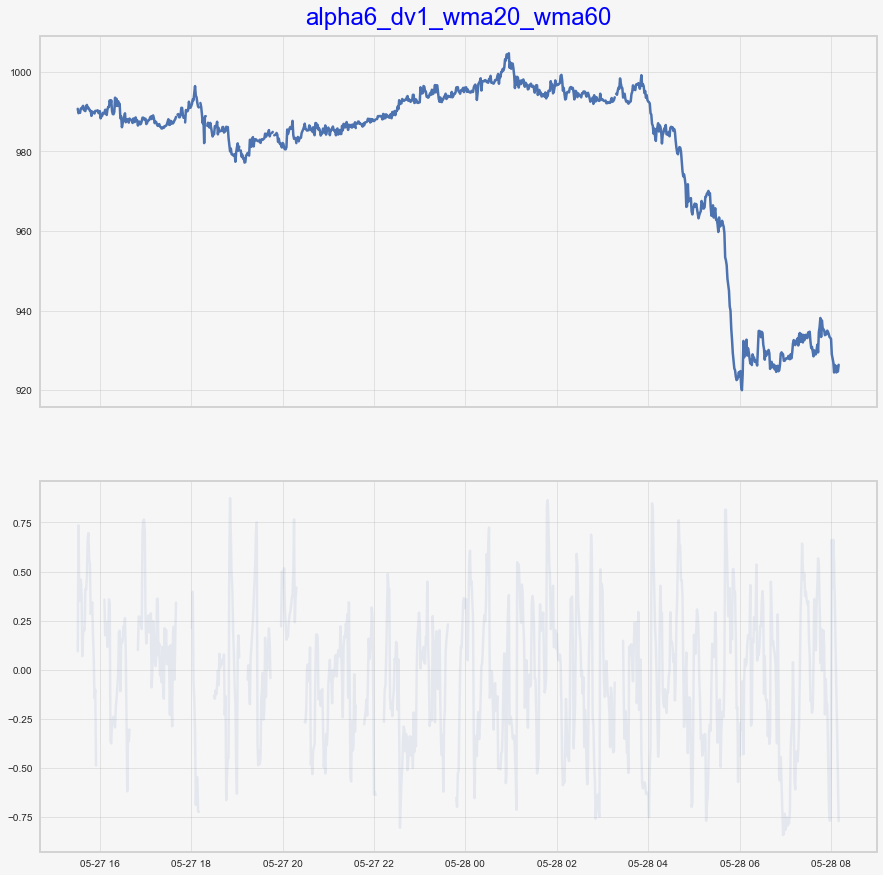

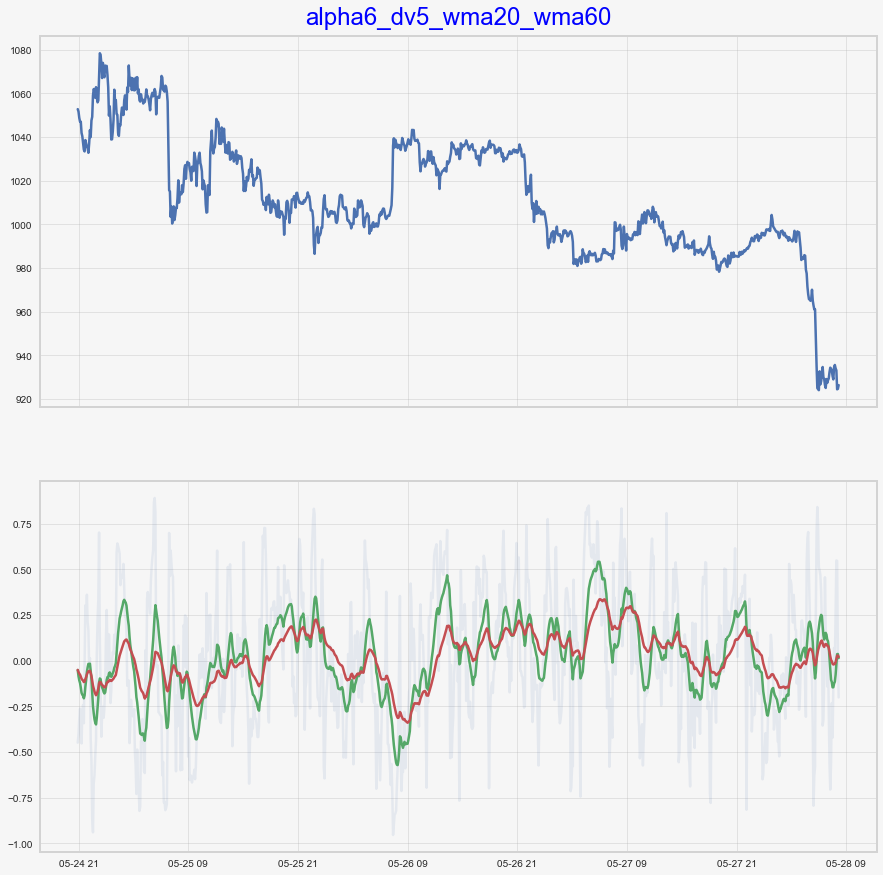

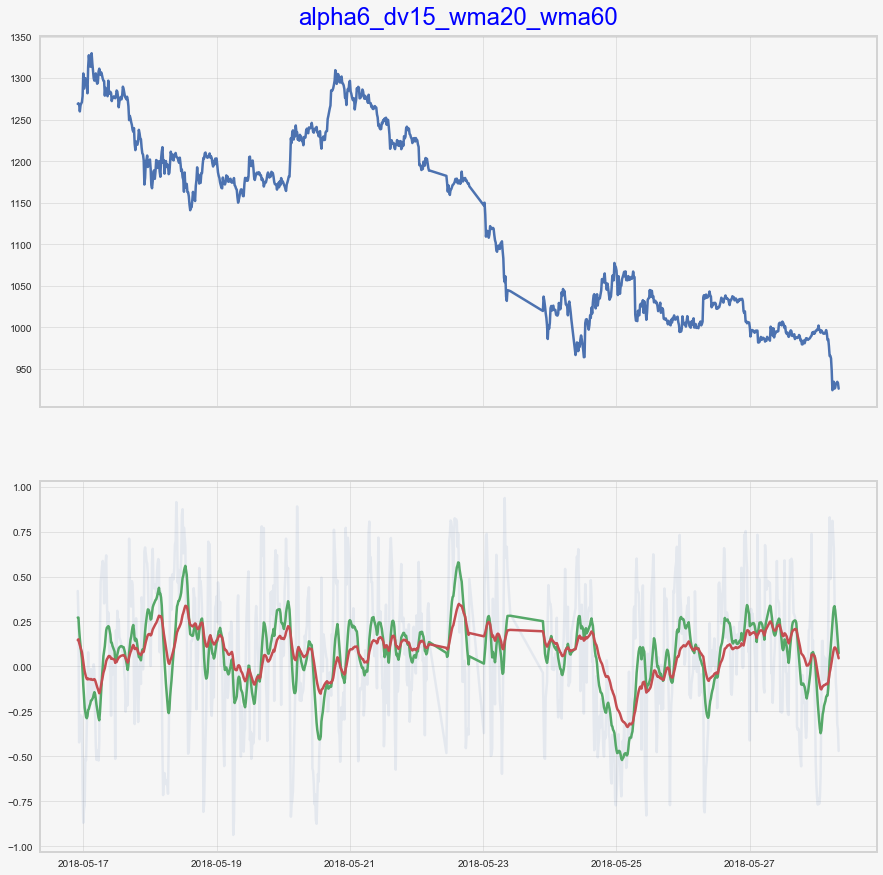

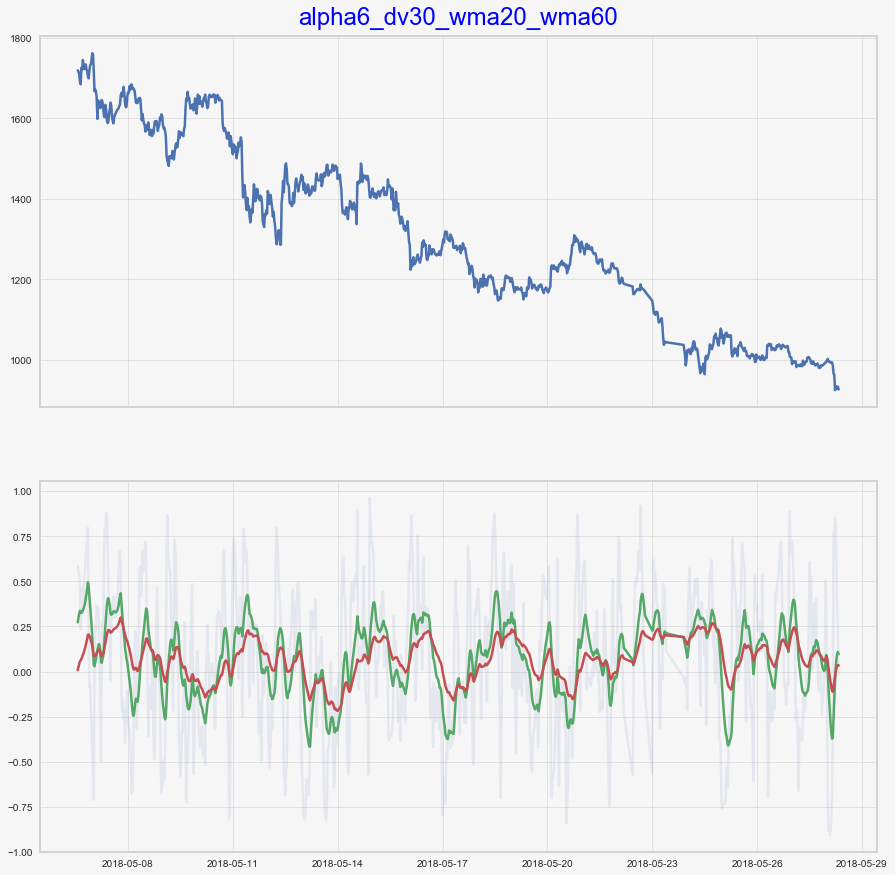

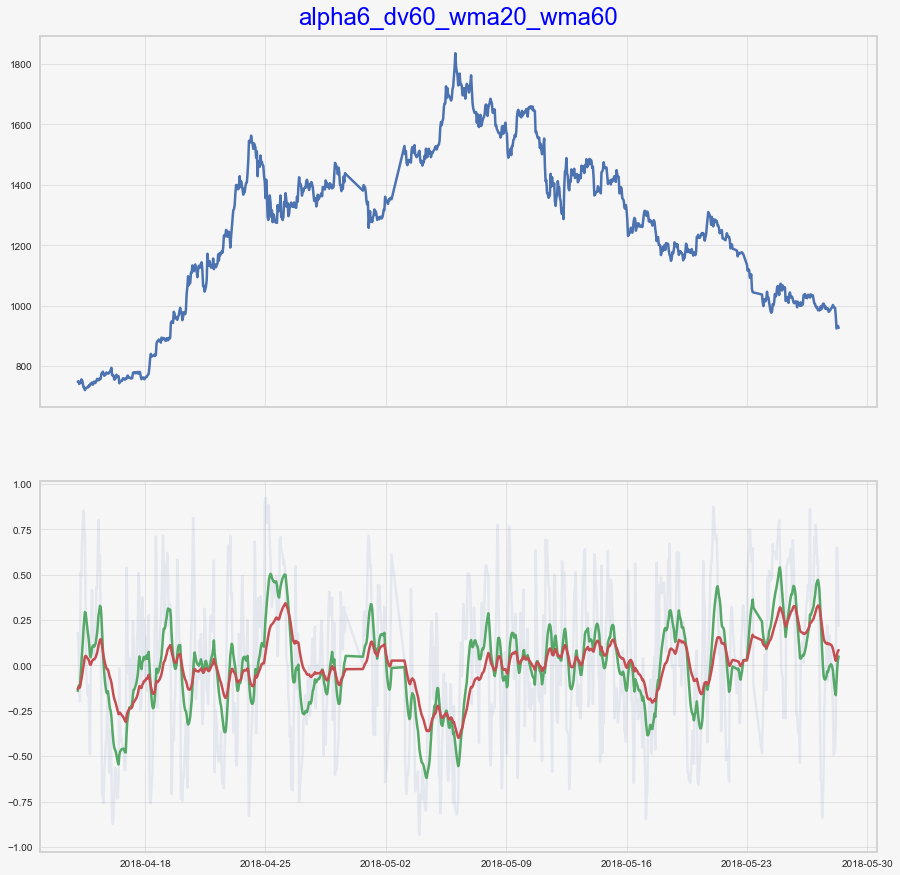

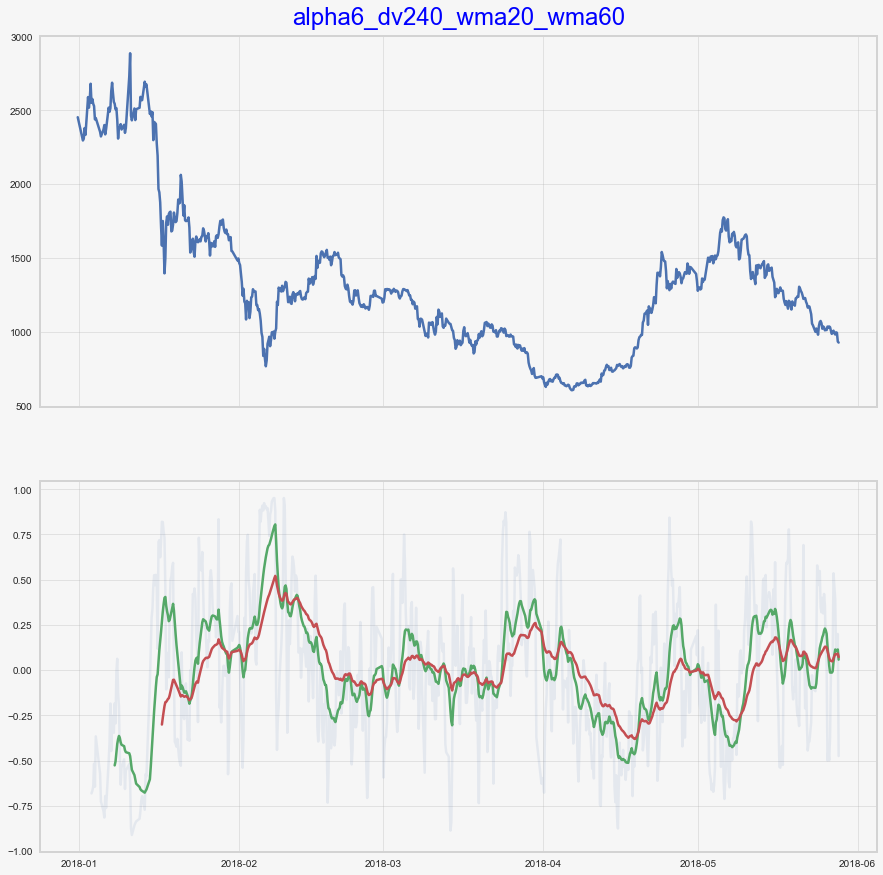

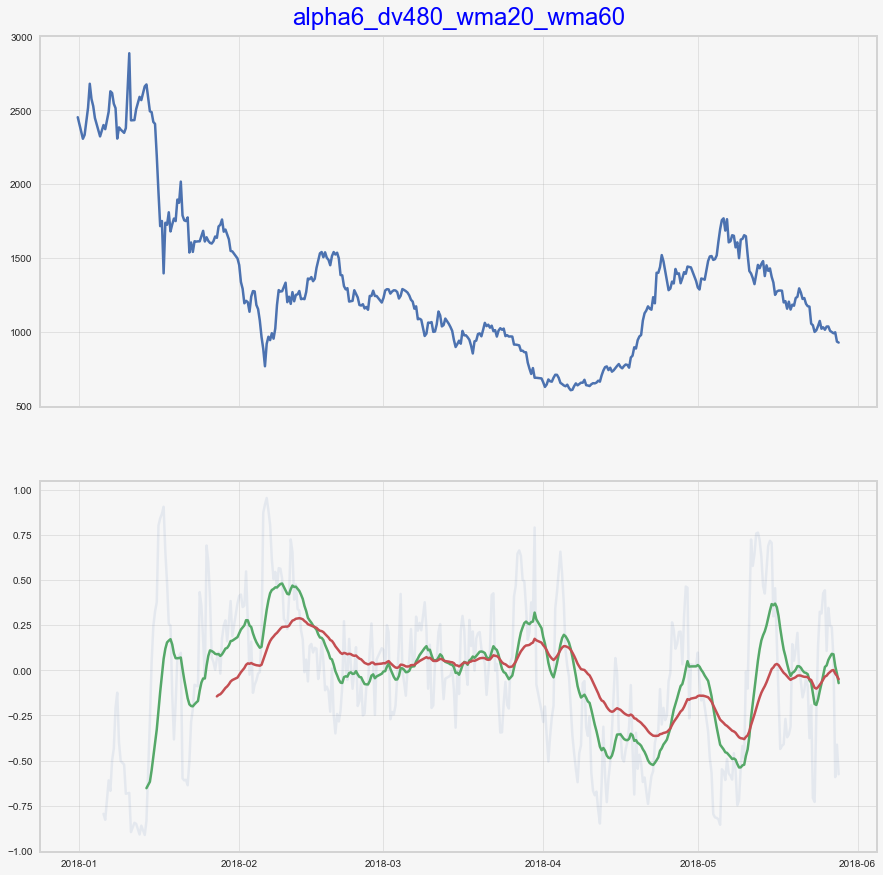

In [34]:
for name, alpha in alpha6_dict.items():
    Plot_WMA(globals()[name.split('_')[1]], alpha, chart_name=name+'_wma20_wma60',ShortPeriod=20, LongPeriod=60, n=-1000)

In [135]:
# 进场信号 3日均线cross5日均线
long6 = dv240.add_formula("long6","If((Ts_Mean(alpha6_C,40)>Ts_Mean(alpha6_C,80)) && (Delay(Ts_Mean(alpha6_C,40),1)<Delay(Ts_Mean(alpha6_C,80),1)),2,0)", add_data=True)
short6 = dv240.add_formula("short6","If((Ts_Mean(alpha6_C,40)<Ts_Mean(alpha6_C,80)) && (Delay(Ts_Mean(alpha6_C,40),1)>Delay(Ts_Mean(alpha6_C,80),1)),-2,0)", add_data=True)

# 出场信号 3日均线cross5日均线
close_long6 = dv240.add_formula("close_long6","If(short6==-2,1,0)", add_data=True)
close_short6 = dv240.add_formula("close_short6","If(long6==2,-1,0)", add_data=True)

# 汇总
enter6 = dv240.add_formula("enter6","long6+short6", add_data=True)
exit6 = dv240.add_formula("exit6","close_long6+close_short6", add_data=True) 

Field [long6] is overwritten.
Field [short6] is overwritten.
Field [close_long6] is overwritten.
Field [close_short6] is overwritten.
Field [enter6] is overwritten.
Field [exit6] is overwritten.


In [136]:
from jaqs_fxdayu.research import TimingDigger

# step 1：实例化TimingDigger 通过output_folder和output_format指定测试报告的输出路径和输出格式，通过signal_name指定绩效文件名称
td = TimingDigger(output_folder=".", output_format='pdf')

# 多空分别计算一遍 输出汇总结果
td.process_signal(
    enter_signal=dv240.get_ts("long6"),
    exit_signal=dv240.get_ts("close_long6"),
    sig_type="long",  # 信号类型 long/short
    price=dv240.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.3,  # 止损百分比 负数 可为空
#     stopprofit=0.6,  # 止盈百分比 正数 可为空
)

#多空分别计算一遍 输出汇总结果
td.process_signal(
    enter_signal=dv240.get_ts("short6"),
    exit_signal=dv240.get_ts("close_short6"),
    sig_type="short",  # 信号类型 long/short
    price=dv240.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.01,  # 止损百分比 负数 可为空
#     stopprofit=0.03,  # 止盈百分比 正数 可为空
)

Nan Data Count (should be zero) : 0;  Percentage of effective data: 1%
Nan Data Count (should be zero) : 0;  Percentage of effective data: 1%


In [137]:
td.create_event_report(sig_type="long_short",
                       by_symbol=True)

*****-Summary-*****
Event Analysis
                      win   loss     all
t-stat              2.765 -3.025   0.045
p-value             0.040  0.023   0.965
mean                0.210 -0.174   0.003
std                 0.170  0.141   0.246
info_ratio          1.237 -1.235   0.013
skewness            0.159 -0.629   0.205
kurtosis           -1.678 -1.085  -0.638
pct5                0.024 -0.394  -0.363
pct25               0.060 -0.270  -0.096
pct50               0.193 -0.096  -0.021
pct75               0.341 -0.068   0.071
pct95               0.429 -0.029   0.392
occurance           6.000  7.000  13.000
win_ratio             NaN    NaN   0.462
win_mean/loss_mean    NaN    NaN   1.207


## Observation_Alpha4 (Del Rank)

## 假设 Alpha4在8H下的MA金叉死叉收益为0

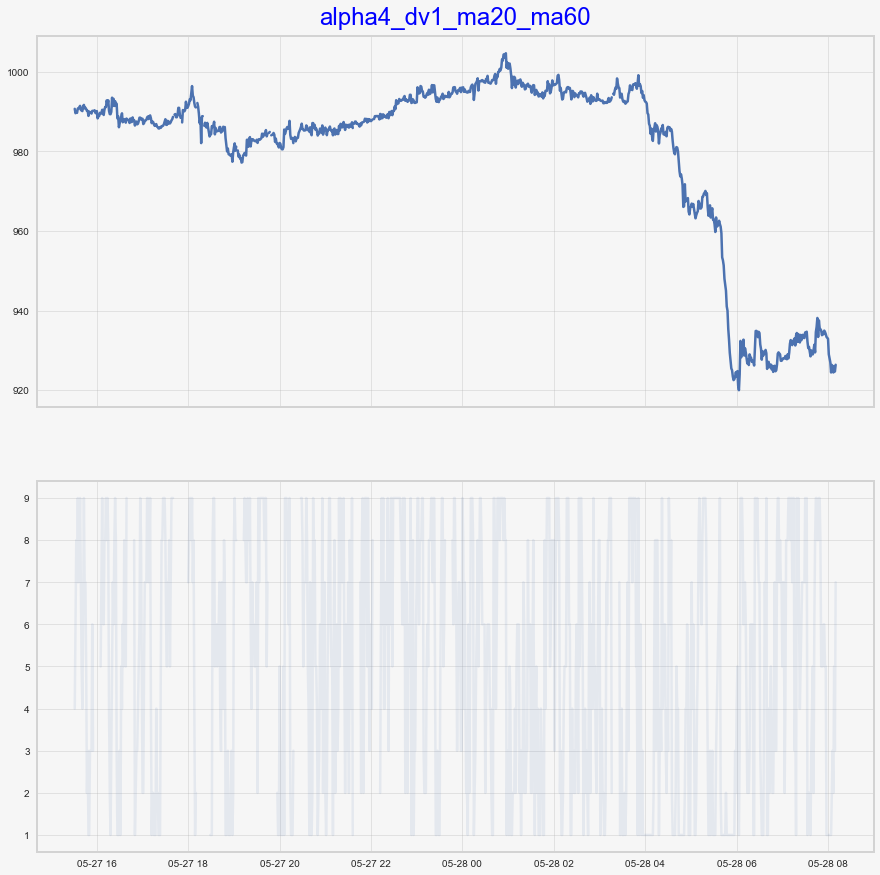

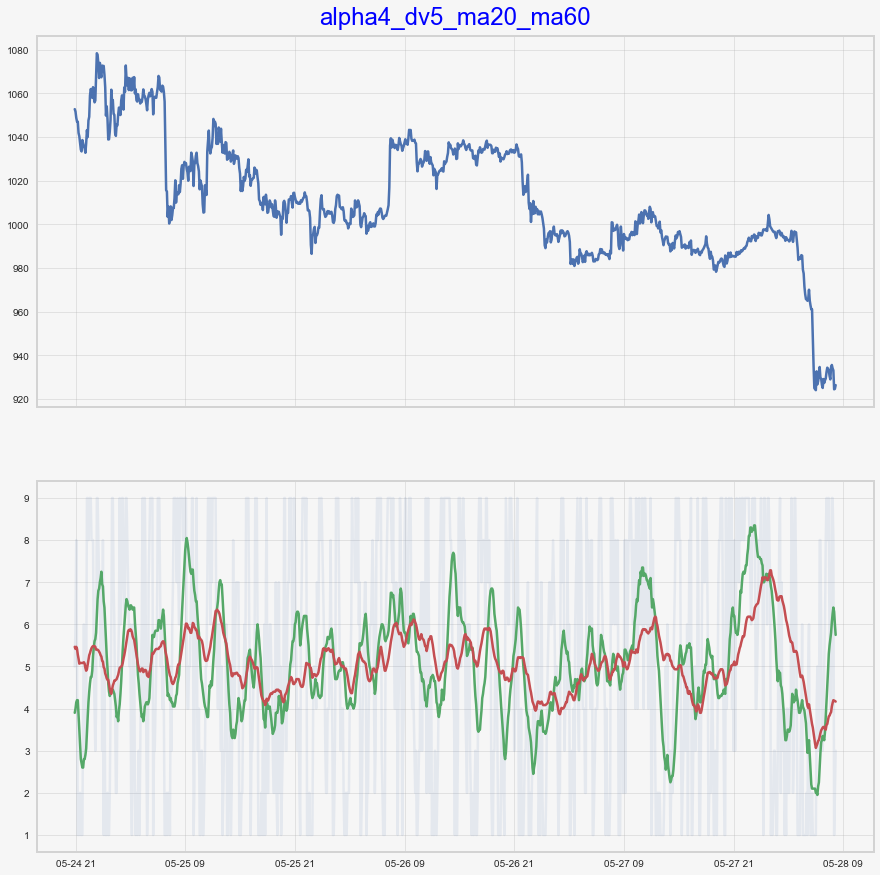

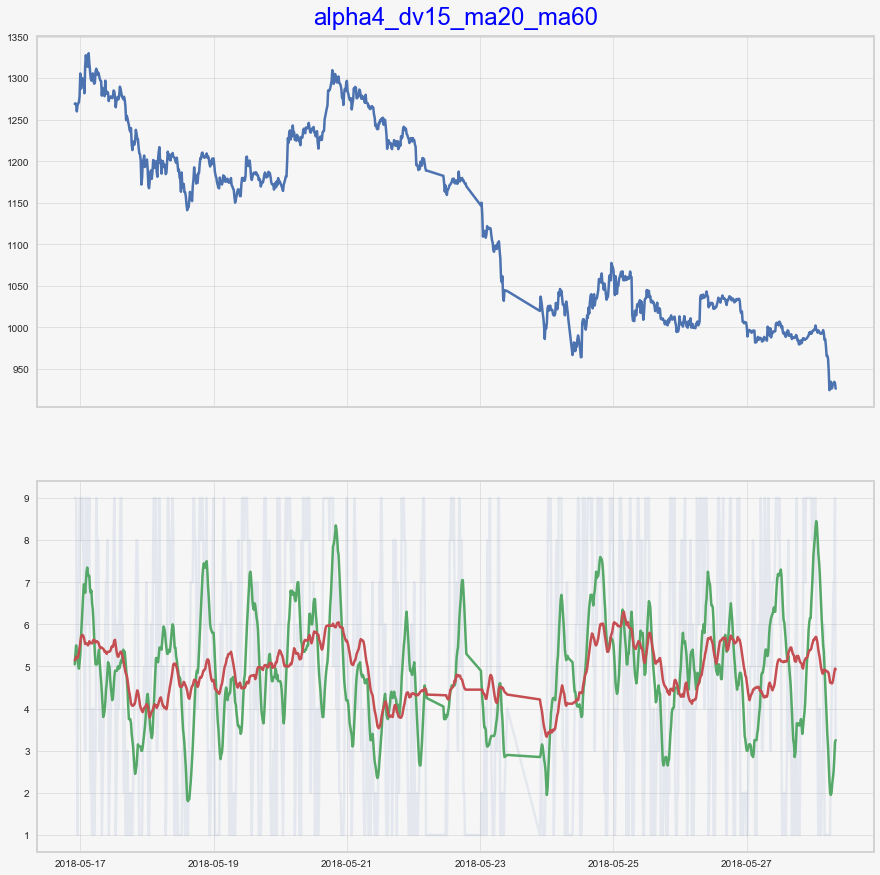

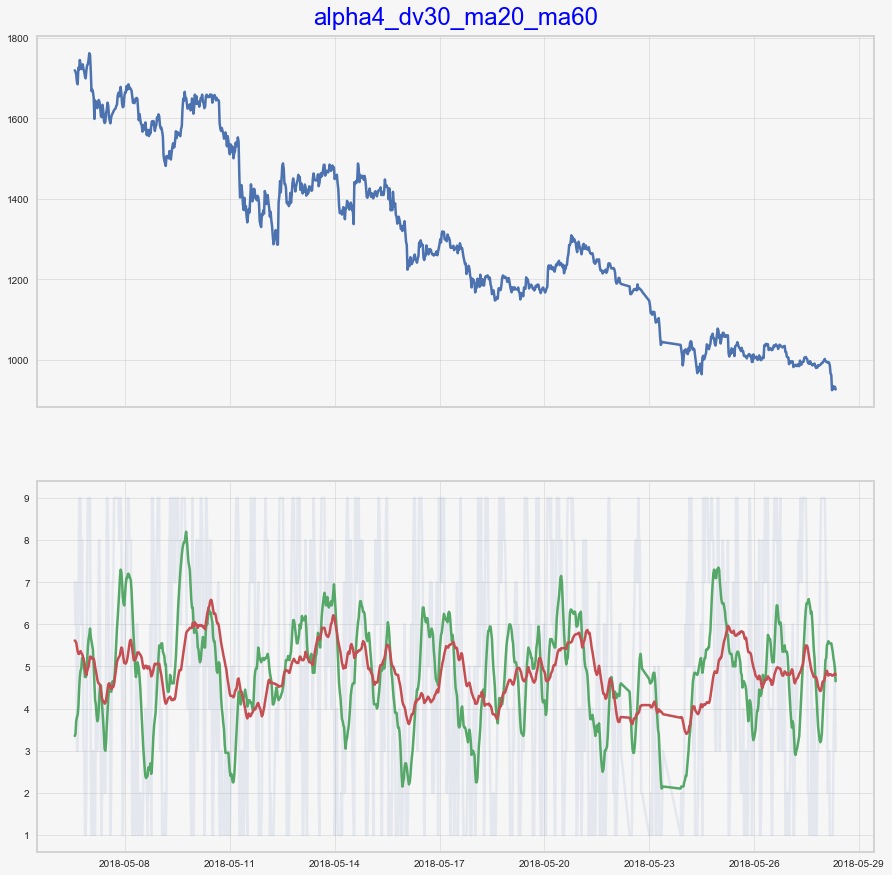

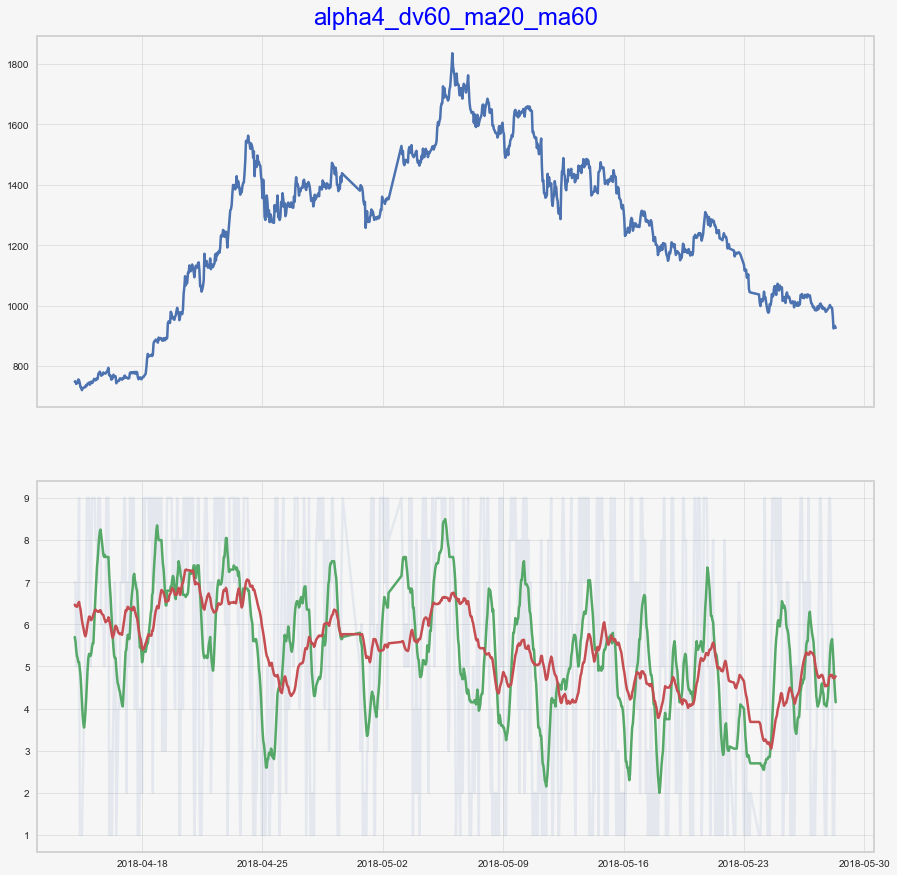

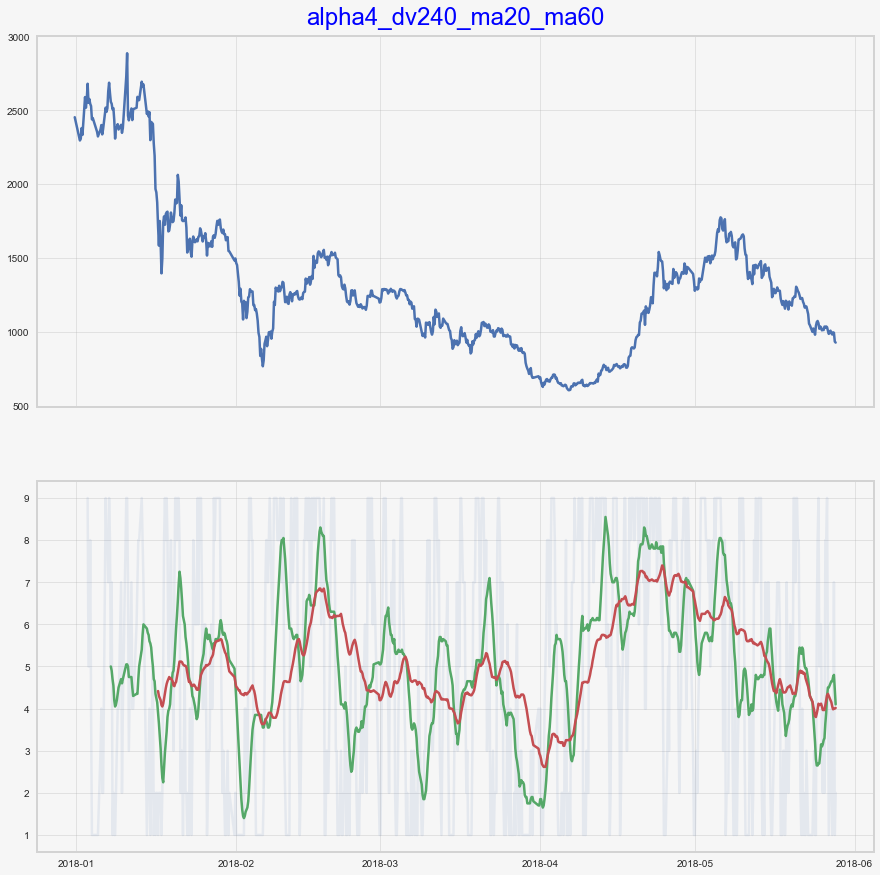

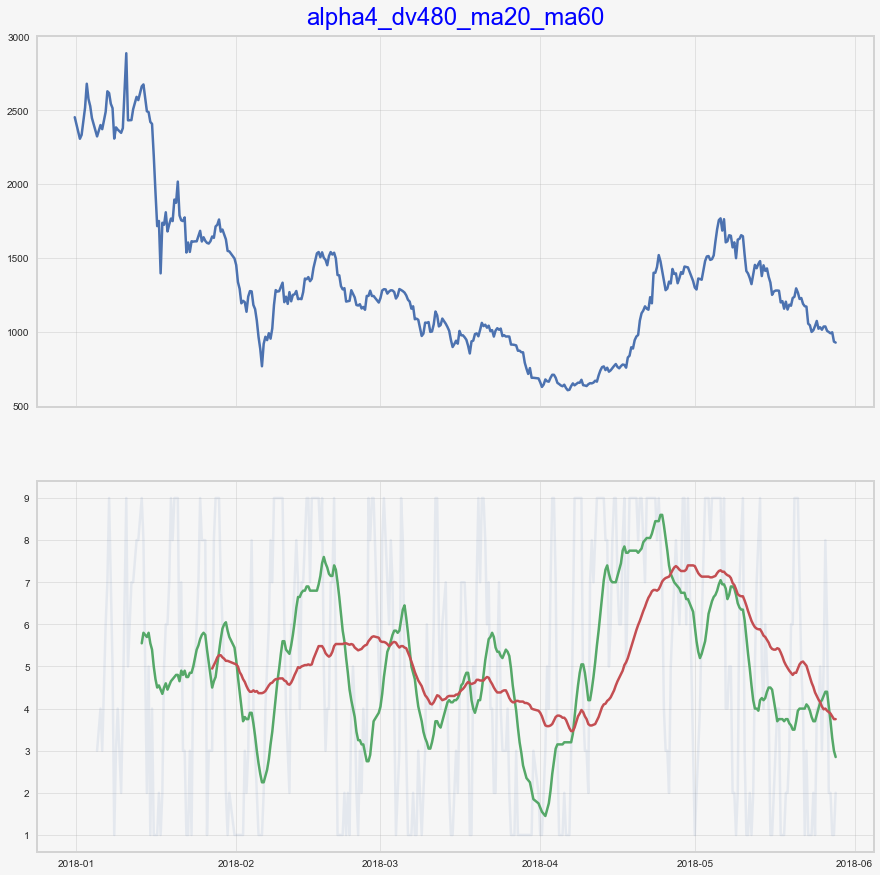

In [67]:
for name, alpha in alpha4_dict.items():
    Plot_MA(globals()[name.split('_')[1]], alpha, chart_name=name+'_ma20_ma60',ShortPeriod=20, LongPeriod=60, n=-1000)

In [42]:
for dv in [dv1, dv5, dv15, dv30, dv60, dv240, dv480]:
    dv.add_formula('alpha4_C','Ts_Rank(low,9)',add_data=True)
dv_dict = {'alpha4_dv1':dv1, 'alpha4_dv5': dv5, 'alpha4_dv15':dv15, 'alpha4_dv30':dv30, 'alpha4_dv60':dv60, 'alpha4_dv240':dv240, 'alpha4_dv480':dv480}
alpha4_dict = {n: dv.get_ts('alpha4_C', date_type='datetime').btc_usdt for n, dv in dv_dict.items()}

In [43]:
# 进场信号 3日均线cross5日均线
long4 = dv480.add_formula("long4","If((Ts_Mean(alpha4_C,20)>Ts_Mean(alpha4_C,60)) && (Delay(Ts_Mean(alpha4_C,20),1)<Delay(Ts_Mean(alpha4_C,60),1)),2,0)", add_data=True)
short4 = dv480.add_formula("short4","If((Ts_Mean(alpha4_C,20)<Ts_Mean(alpha4_C,60)) && (Delay(Ts_Mean(alpha4_C,20),1)>Delay(Ts_Mean(alpha4_C,60),1)),-2,0)", add_data=True)

# 出场信号 3日均线cross5日均线
close_long4 = dv480.add_formula("close_long4","If(short4==-2,1,0)", add_data=True)
close_short4 = dv480.add_formula("close_short4","If(long4==2,-1,0)", add_data=True)

# 汇总
enter4 = dv480.add_formula("enter4","long4+short4", add_data=True)
exit4 = dv480.add_formula("exit4","close_long4+close_short4", add_data=True) 

In [49]:
from jaqs_fxdayu.research import TimingDigger

# step 1：实例化TimingDigger 通过output_folder和output_format指定测试报告的输出路径和输出格式，通过signal_name指定绩效文件名称
td = TimingDigger(output_folder=".", output_format='pdf')

# 多空分别计算一遍 输出汇总结果
td.process_signal(
    enter_signal=dv480.get_ts("long4"),
    exit_signal=dv480.get_ts("close_long4"),
    sig_type="long",  # 信号类型 long/short
    price=dv480.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.03,  # 止损百分比 负数 可为空
#     stopprofit=0.06,  # 止盈百分比 正数 可为空
)

#多空分别计算一遍 输出汇总结果
td.process_signal(
    enter_signal=dv480.get_ts("short4"),
    exit_signal=dv480.get_ts("close_short4"),
    sig_type="short",  # 信号类型 long/short
    price=dv480.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.03,  # 止损百分比 负数 可为空
#     stopprofit=0.06,  # 止盈百分比 正数 可为空
)

Nan Data Count (should be zero) : 0;  Percentage of effective data: 1%
Nan Data Count (should be zero) : 0;  Percentage of effective data: 1%


In [50]:
td.create_event_report(sig_type="short",
                       by_symbol=True)

Figure saved: E:\Factor_Scripts\factor-scripts\Alpha101\short_entry_exit_position/btc_usdt.pdf
*****-Summary-*****
Event Analysis
                      win   loss    all
t-stat              4.647 -1.415  1.181
p-value             0.135  0.392  0.323
mean                0.213 -0.036  0.088
std                 0.046  0.025  0.130
info_ratio          4.647 -1.415  0.682
skewness            0.000  0.000  0.124
kurtosis           -2.000 -2.000 -1.699
pct5                0.171 -0.059 -0.054
pct25               0.190 -0.048 -0.023
pct50               0.213 -0.036  0.078
pct75               0.235 -0.023  0.190
pct95               0.254 -0.013  0.245
occurance           2.000  2.000  4.000
win_ratio             NaN    NaN  0.500
win_mean/loss_mean    NaN    NaN  5.932


## Observation_Alpha5 (Del Rank)

In [58]:
for dv in [dv1, dv5, dv15, dv30, dv60, dv240, dv480]:
    dv.add_formula('alpha5_C','-1*(open-(Ts_Sum(vwap_c,10)/10))/(-1*Abs(close-vwap_c))',add_data=True)
dv_dict = {'alpha5_dv1':dv1, 'alpha5_dv5': dv5, 'alpha5_dv15':dv15, 'alpha5_dv30':dv30, 'alpha5_dv60':dv60, 'alpha5_dv240':dv240, 'alpha5_dv480':dv480}
alpha5_dict = {n: dv.get_ts('alpha5_C', date_type='datetime').btc_usdt for n, dv in dv_dict.items()}

Field [alpha5_C] is overwritten.
Field [alpha5_C] is overwritten.
Field [alpha5_C] is overwritten.
Field [alpha5_C] is overwritten.
Field [alpha5_C] is overwritten.
Field [alpha5_C] is overwritten.
Field [alpha5_C] is overwritten.


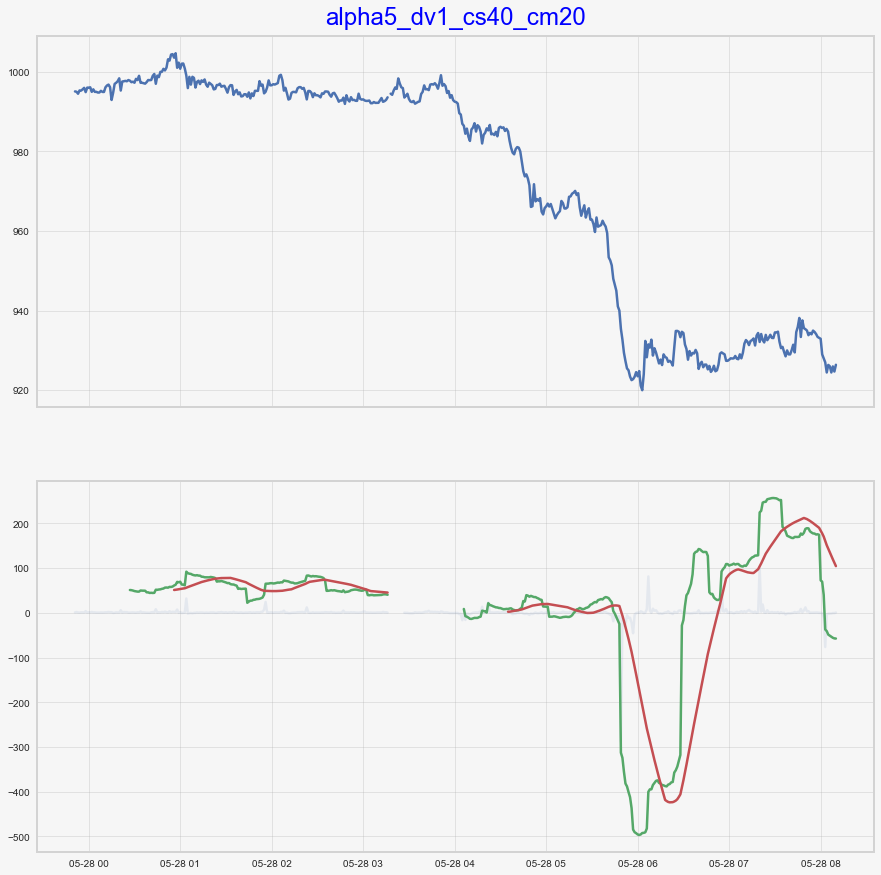

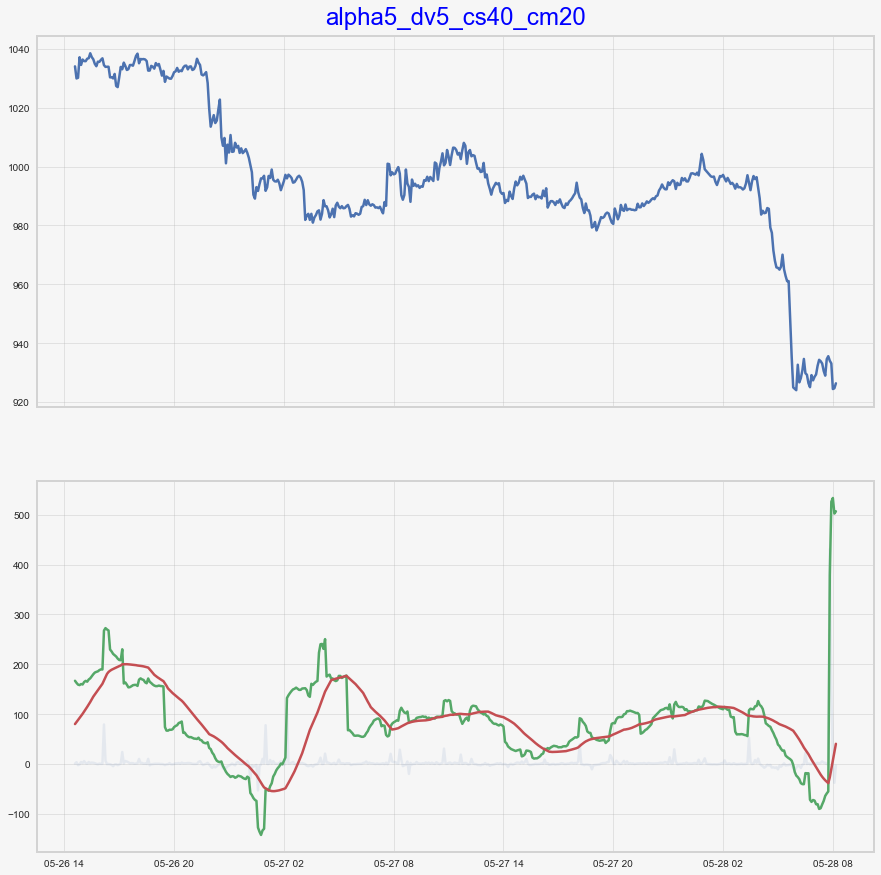

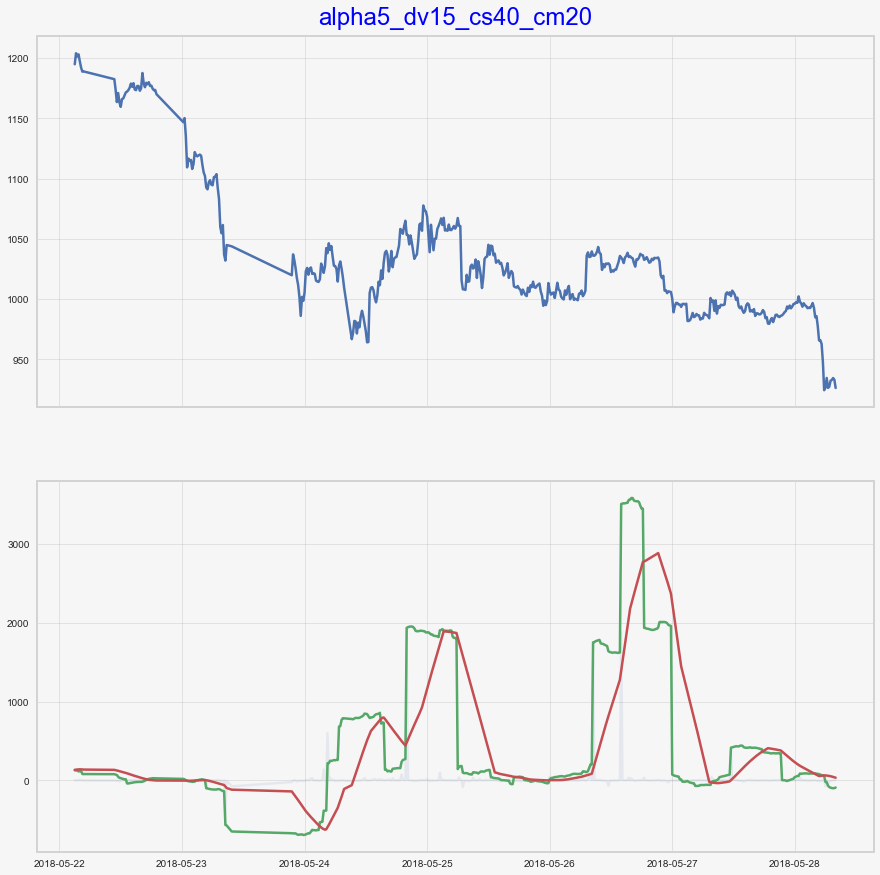

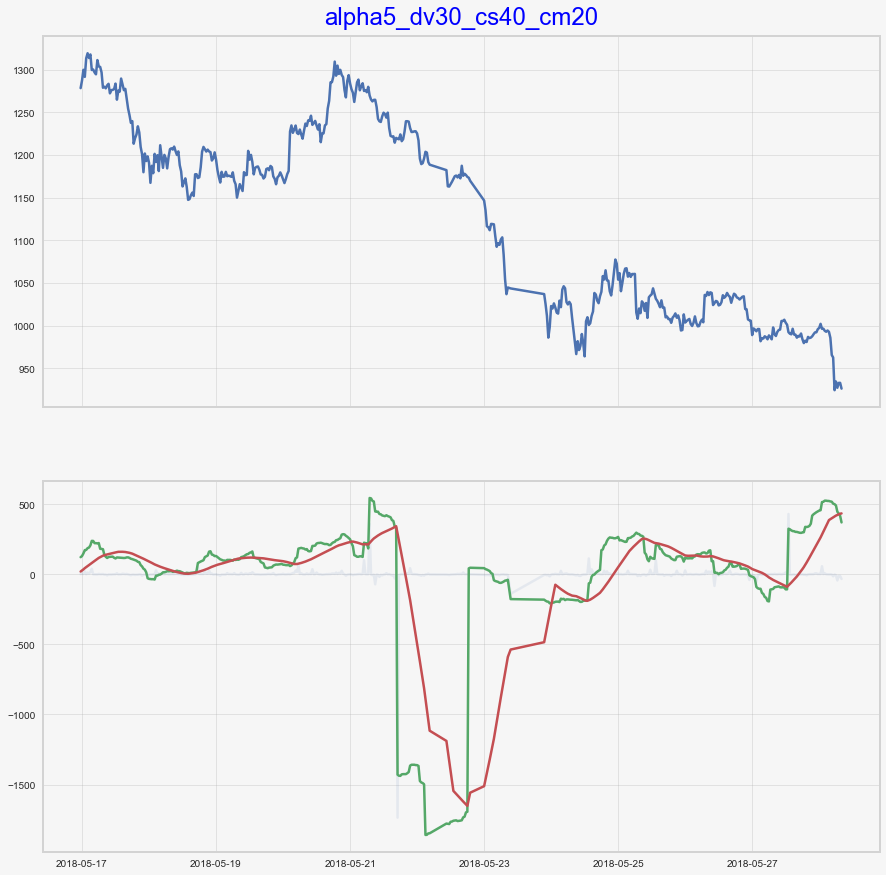

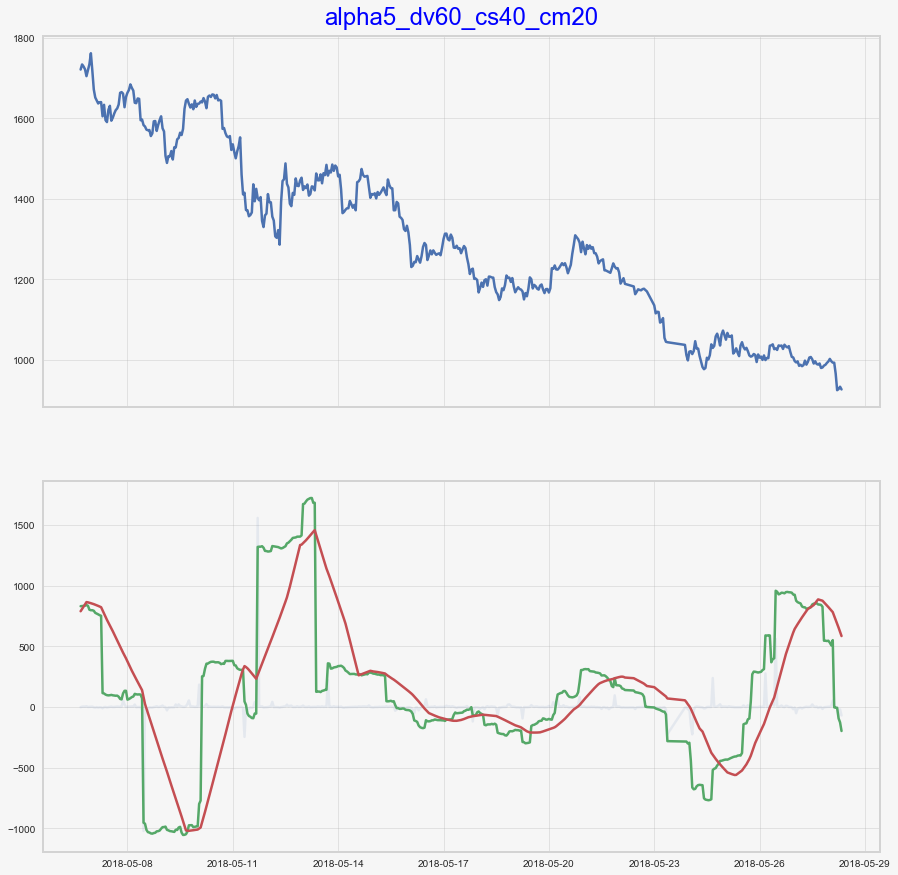

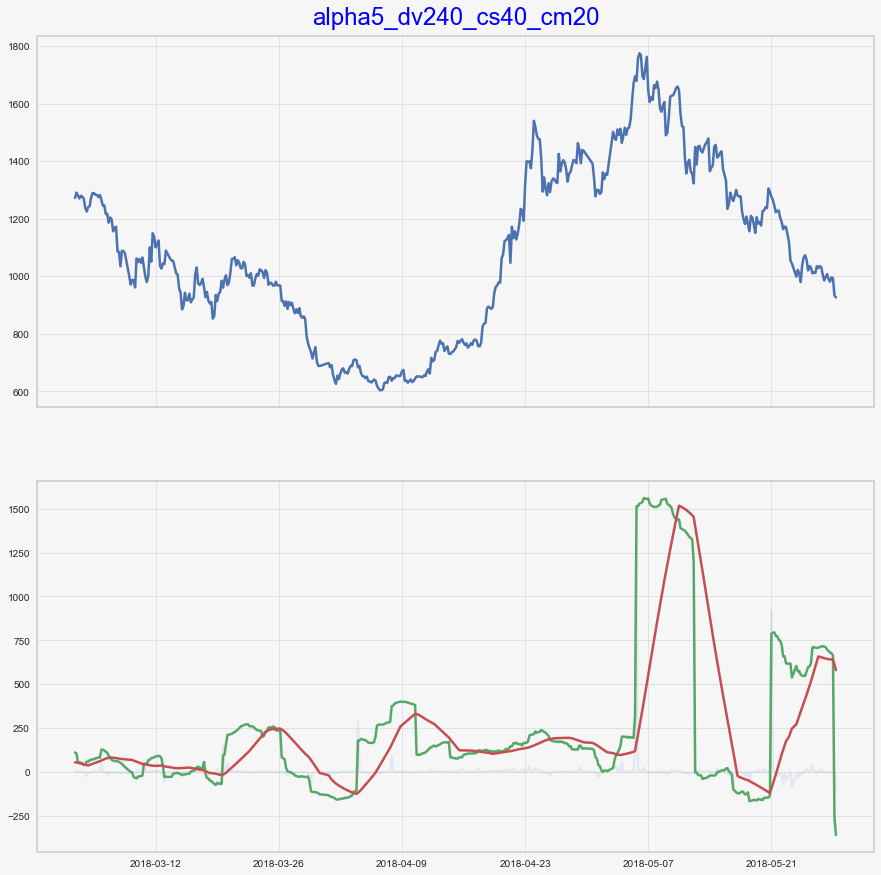

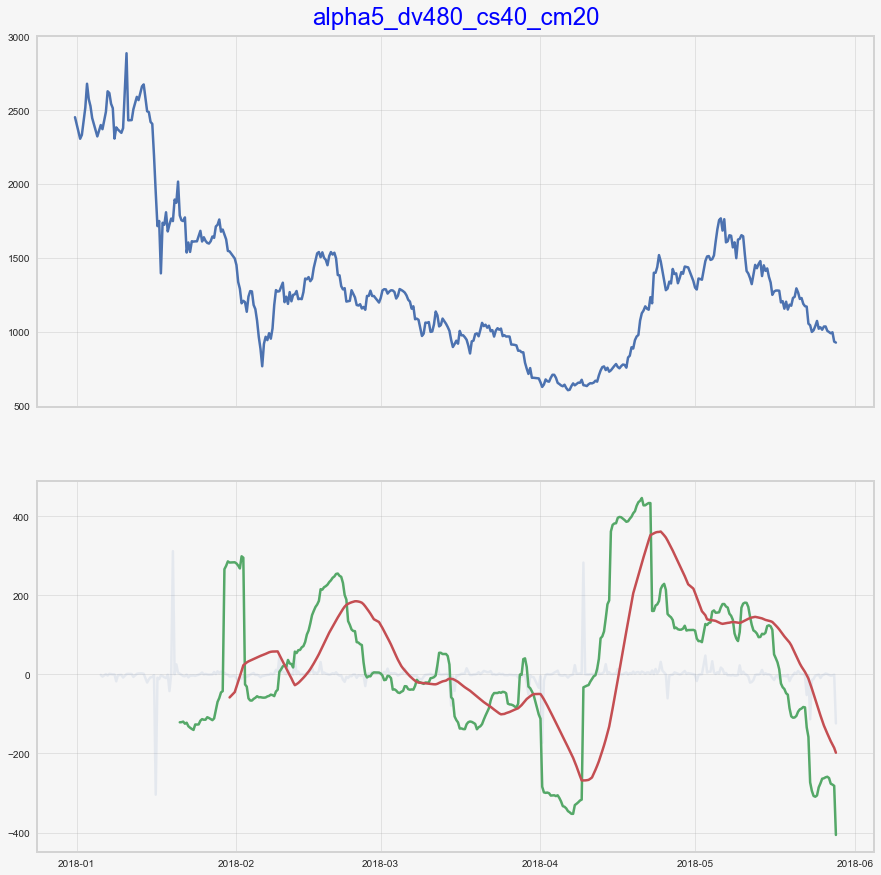

In [71]:
for name, alpha in alpha5_dict.items():
    Plot_Cumsum_Mean(globals()[name.split('_')[1]], alpha, chart_name=name+'_cs40_cm20',SumPeriod=40, MeanPeriod=30, n=-500)

## 假设 Alpha5在4H下的CumSum40Mean30金叉死叉收益为0

In [74]:
# 进场信号 3日均线cross5日均线
long5 = dv240.add_formula("long5","If((Ts_Sum(alpha5_C,40)>Ts_Mean(Ts_Sum(alpha5_C,40),30)) && (Delay(Ts_Sum(alpha5_C,40),1)<Delay(Ts_Mean(Ts_Sum(alpha5_C,40),30),1)),2,0)", add_data=True)
short5 = dv240.add_formula("short5","If((Ts_Sum(alpha5_C,40)<Ts_Mean(Ts_Sum(alpha5_C,40),30)) && (Delay(Ts_Sum(alpha5_C,40),1)>Delay(Ts_Mean(Ts_Sum(alpha5_C,40),30),1)),-2,0)", add_data=True)

# 出场信号 3日均线cross5日均线
close_long5 = dv240.add_formula("close_long5","If(short5==-2,1,0)", add_data=True)
close_short5 = dv240.add_formula("close_short5","If(long5==2,-1,0)", add_data=True)

# 汇总
enter5 = dv240.add_formula("enter5","long5+short5", add_data=True)
exit5 = dv240.add_formula("exit5","close_long5+close_short5", add_data=True) 

In [81]:
dv240.get_ts("close_long5").stack()[dv240.get_ts("close_long5").stack()==1]

trade_date      symbol  
20180201120000  btc_usdt    1.0
20180222000000  btc_usdt    1.0
20180303200000  btc_usdt    1.0
20180307000000  btc_usdt    1.0
20180312200000  btc_usdt    1.0
20180317160000  btc_usdt    1.0
20180324040000  btc_usdt    1.0
20180325160000  btc_usdt    1.0
20180410160000  btc_usdt    1.0
20180425200000  btc_usdt    1.0
20180510080000  btc_usdt    1.0
20180528040000  btc_usdt    1.0
dtype: float64

In [83]:
from jaqs_fxdayu.research import TimingDigger

# step 1：实例化TimingDigger 通过output_folder和output_format指定测试报告的输出路径和输出格式，通过signal_name指定绩效文件名称
td = TimingDigger(output_folder=".", output_format='pdf')

# 多空分别计算一遍 输出汇总结果
td.process_signal(
    enter_signal=dv240.get_ts("long5"),
    exit_signal=dv240.get_ts("close_long5"),
    sig_type="long",  # 信号类型 long/short
    price=dv240.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.3,  # 止损百分比 负数 可为空
#     stopprofit=0.6,  # 止盈百分比 正数 可为空
)

#多空分别计算一遍 输出汇总结果
td.process_signal(
    enter_signal=dv240.get_ts("short5"),
    exit_signal=dv240.get_ts("close_short5"),
    sig_type="short",  # 信号类型 long/short
    price=dv240.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.01,  # 止损百分比 负数 可为空
#     stopprofit=0.03,  # 止盈百分比 正数 可为空
)

Nan Data Count (should be zero) : 0;  Percentage of effective data: 1%
Nan Data Count (should be zero) : 0;  Percentage of effective data: 1%


In [84]:
td.create_event_report(sig_type="long_short",
                       by_symbol=True)

*****-Summary-*****
Event Analysis
                       win    loss     all
t-stat               2.237  -4.243   1.082
p-value              0.052   0.002   0.292
mean                 0.161  -0.060   0.046
std                  0.216   0.044   0.189
info_ratio           0.746  -1.342   0.242
skewness             1.943  -1.103   2.520
kurtosis             2.772   0.259   6.834
pct5                 0.005  -0.143  -0.123
pct25                0.018  -0.071  -0.045
pct50                0.083  -0.045  -0.004
pct75                0.207  -0.035   0.063
pct95                0.535  -0.011   0.265
occurance           10.000  11.000  21.000
win_ratio              NaN     NaN   0.476
win_mean/loss_mean     NaN     NaN   2.704


## Observation_Alpha7

In [116]:
for dv in [dv1, dv5, dv15, dv30, dv60, dv240, dv480]:
    dv.add_formula('alpha7_C','-1*(If(Ts_Mean(volume,20)<volume, (-1*Ts_Rank(Abs(Delta(close,7)),60))*Sign(Delta(close,7)),-1))',add_data=True)
dv_dict = {'alpha7_dv1':dv1, 'alpha7_dv5': dv5, 'alpha7_dv15':dv15, 'alpha7_dv30':dv30, 'alpha7_dv60':dv60, 'alpha7_dv240':dv240, 'alpha7_dv480':dv480}
alpha7_dict = {n: dv.get_ts('alpha7_C', date_type='datetime').btc_usdt for n, dv in dv_dict.items()}

In [117]:
# dv480.get_ts('alpha7_C', date_type='datetime')

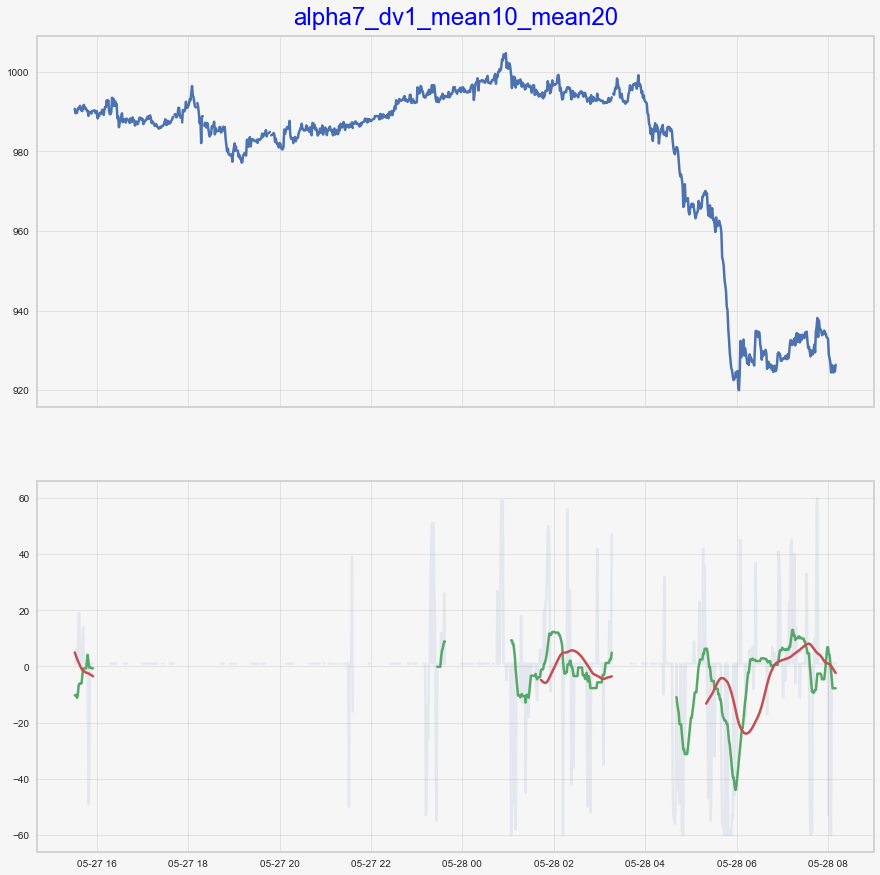

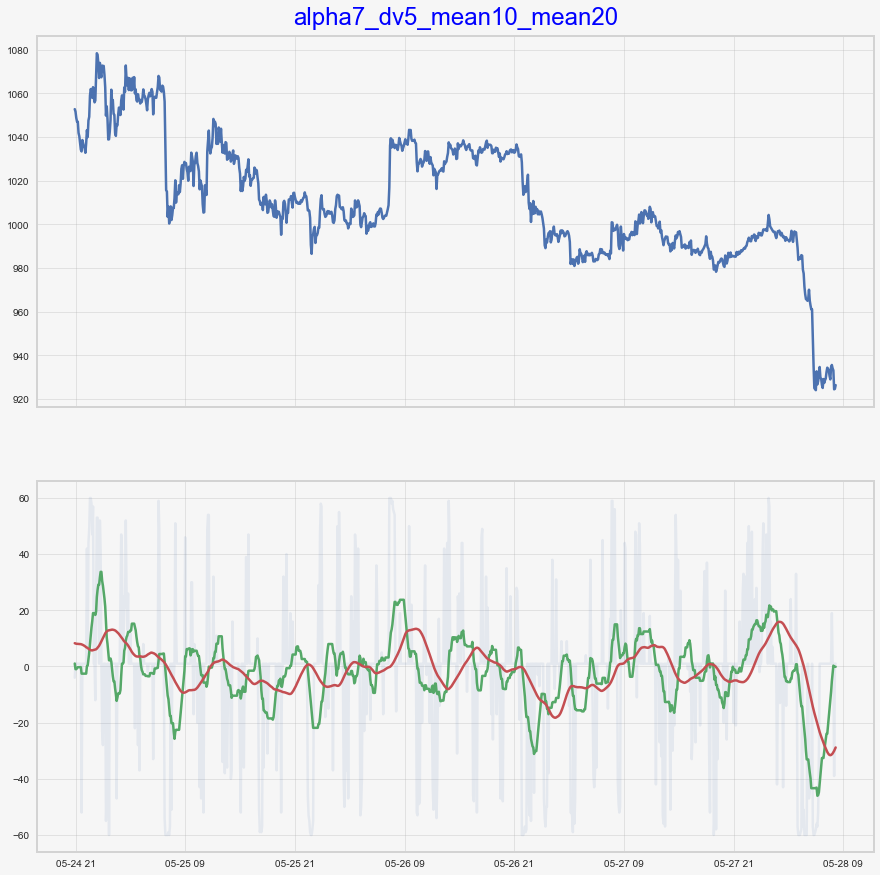

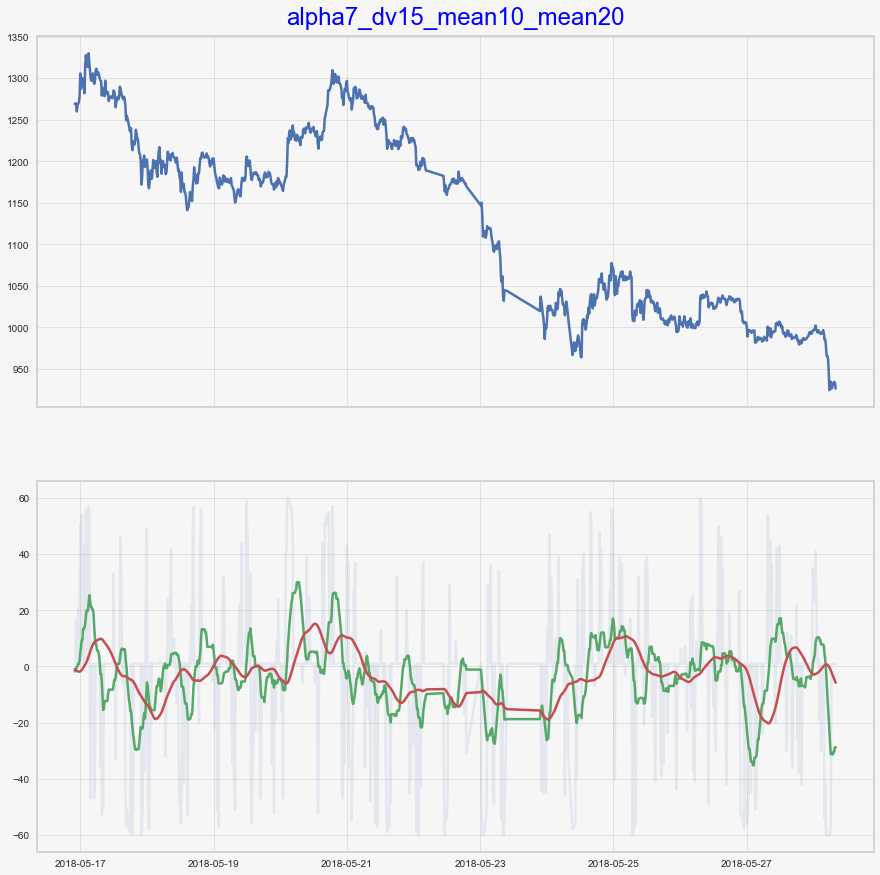

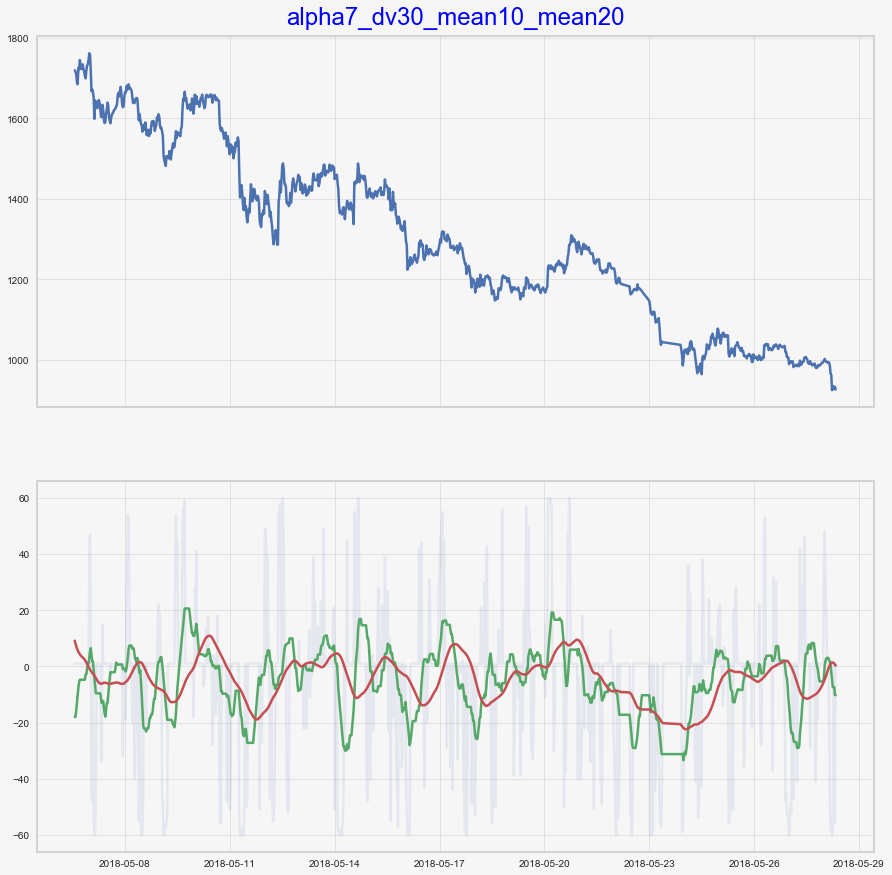

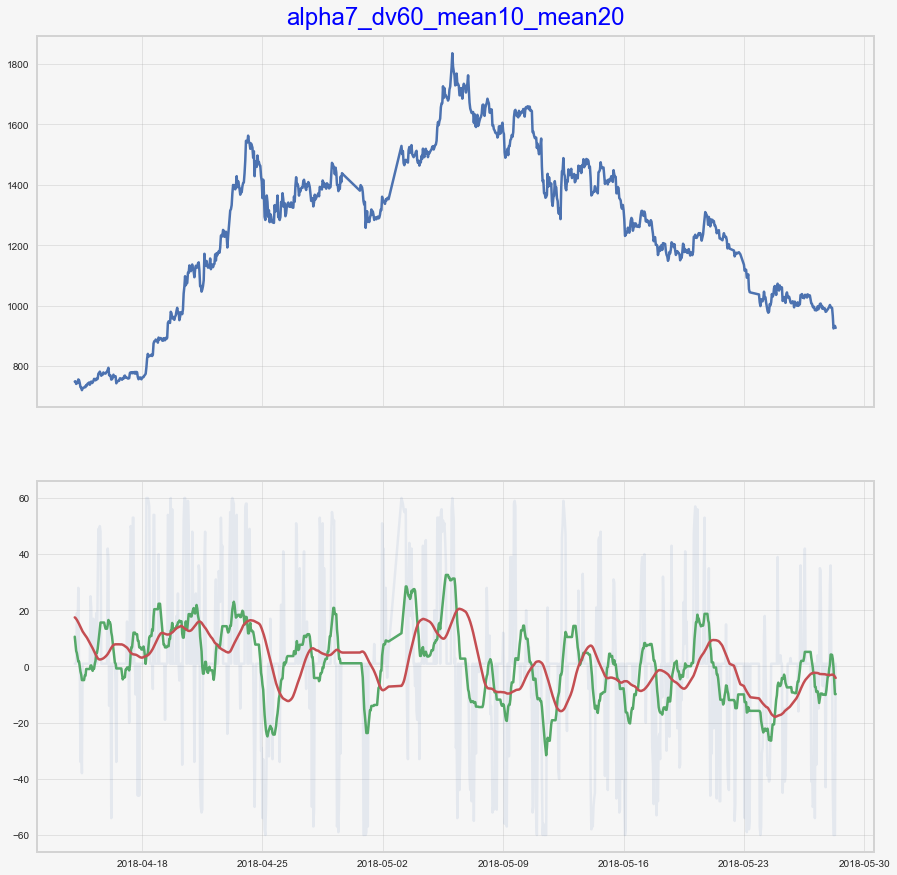

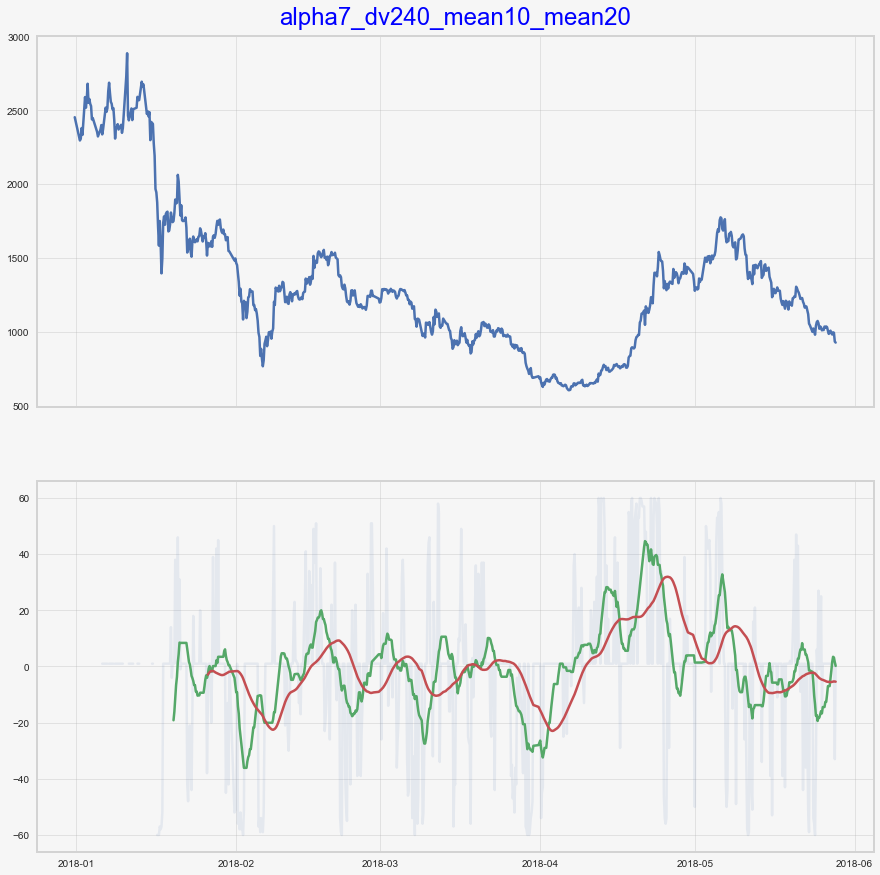

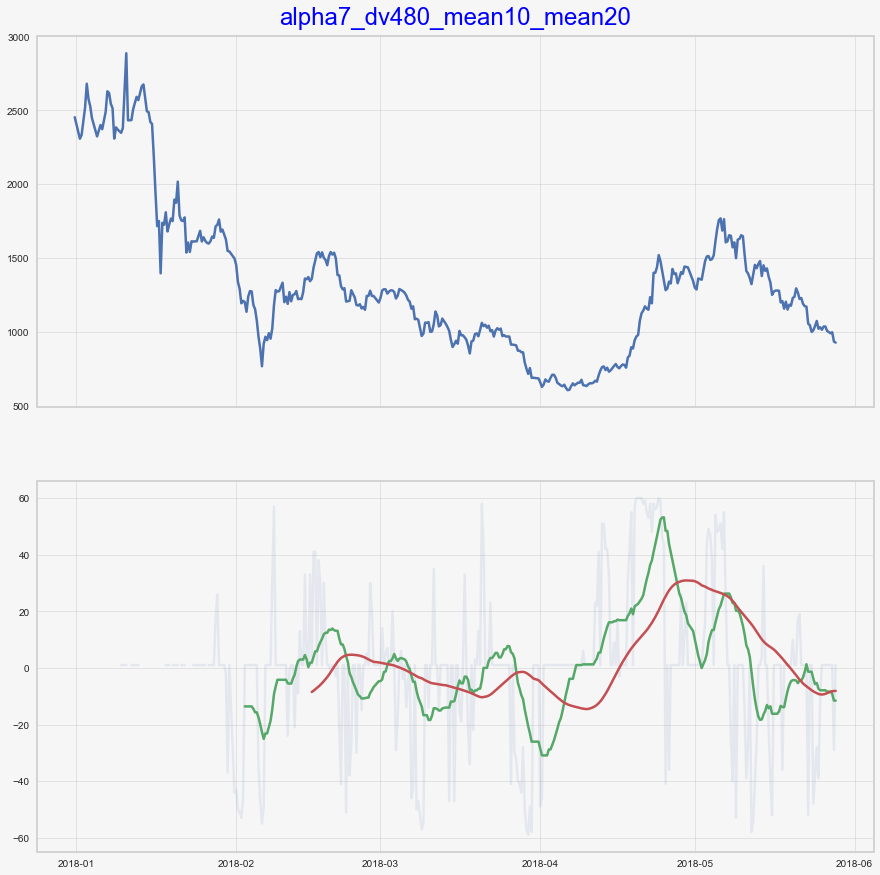

In [119]:
for name, alpha in alpha7_dict.items():
    Plot_Mean_Mean(globals()[name.split('_')[1]], alpha, chart_name=name+'_mean10_mean20',Mean1Period=20, Mean2Period=40, n=-1000)

## Observation_Alpha8

In [106]:
for dv in [dv1, dv5, dv15, dv30, dv60, dv240, dv480]:
    dv.add_formula('alpha8_C','((Ts_Sum(open,5)*Ts_Sum(Return(close,1),5))-Delay((Ts_Sum(open,5)*Ts_Sum(Return(close,1),5)),10))',add_data=True)
dv_dict = {'alpha8_dv1':dv1, 'alpha8_dv5': dv5, 'alpha8_dv15':dv15, 'alpha8_dv30':dv30, 'alpha8_dv60':dv60, 'alpha8_dv240':dv240, 'alpha8_dv480':dv480}
alpha8_dict = {n: dv.get_ts('alpha8_C', date_type='datetime').btc_usdt for n, dv in dv_dict.items()}

Field [alpha8_C] is overwritten.
Field [alpha8_C] is overwritten.
Field [alpha8_C] is overwritten.
Field [alpha8_C] is overwritten.
Field [alpha8_C] is overwritten.
Field [alpha8_C] is overwritten.
Field [alpha8_C] is overwritten.


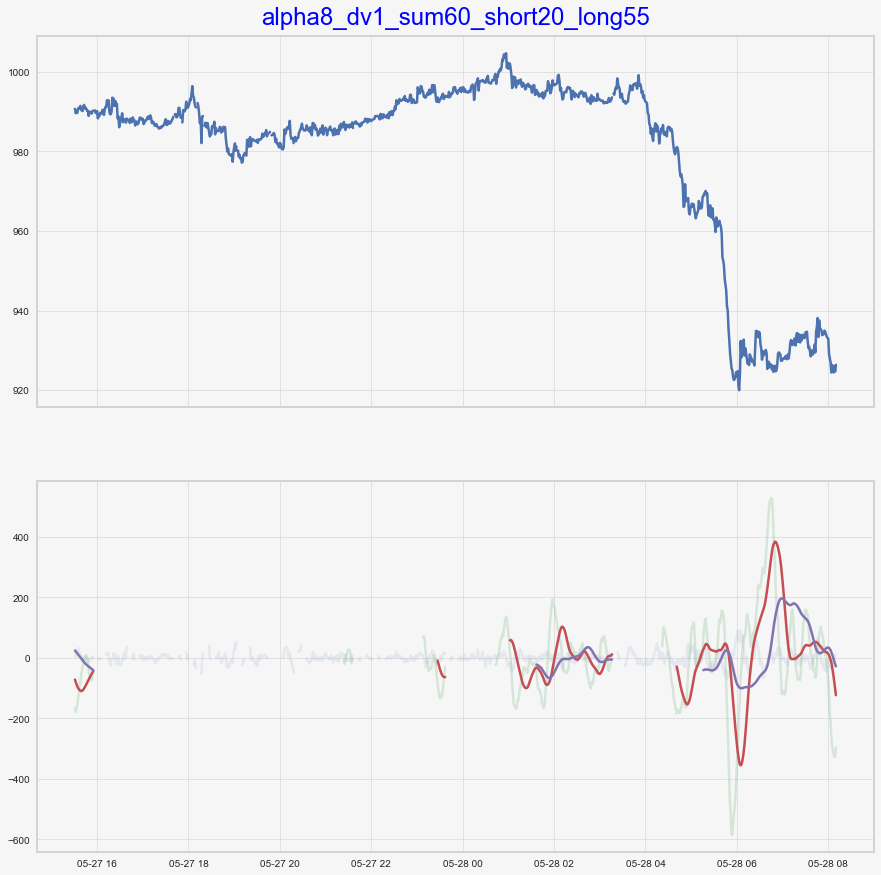

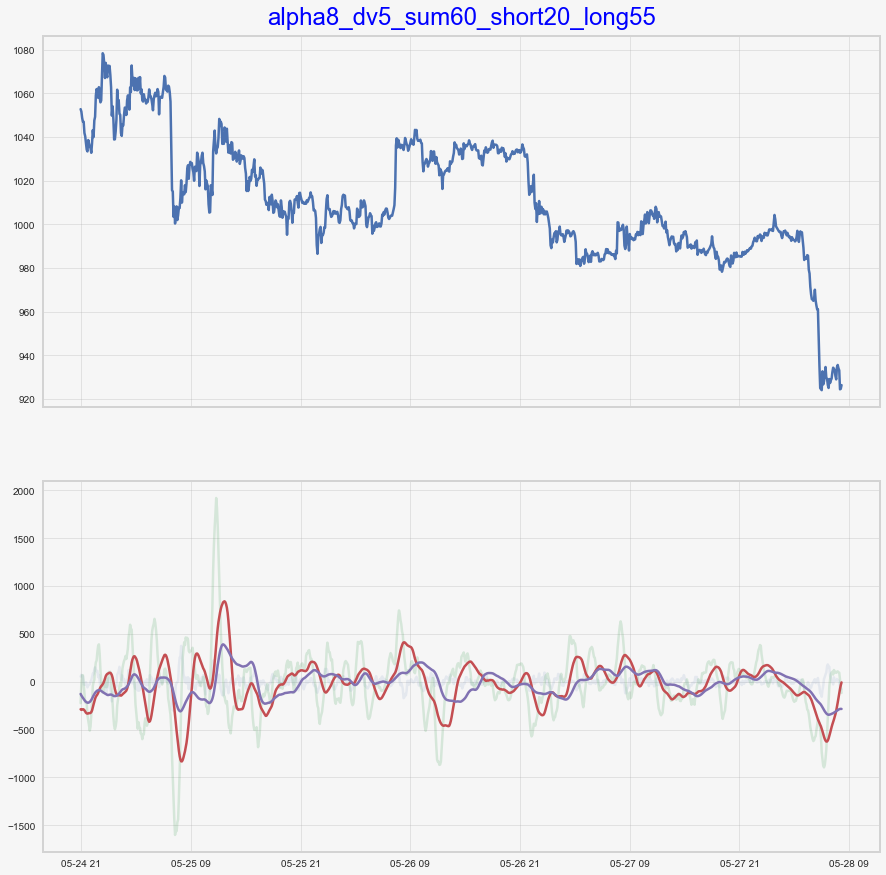

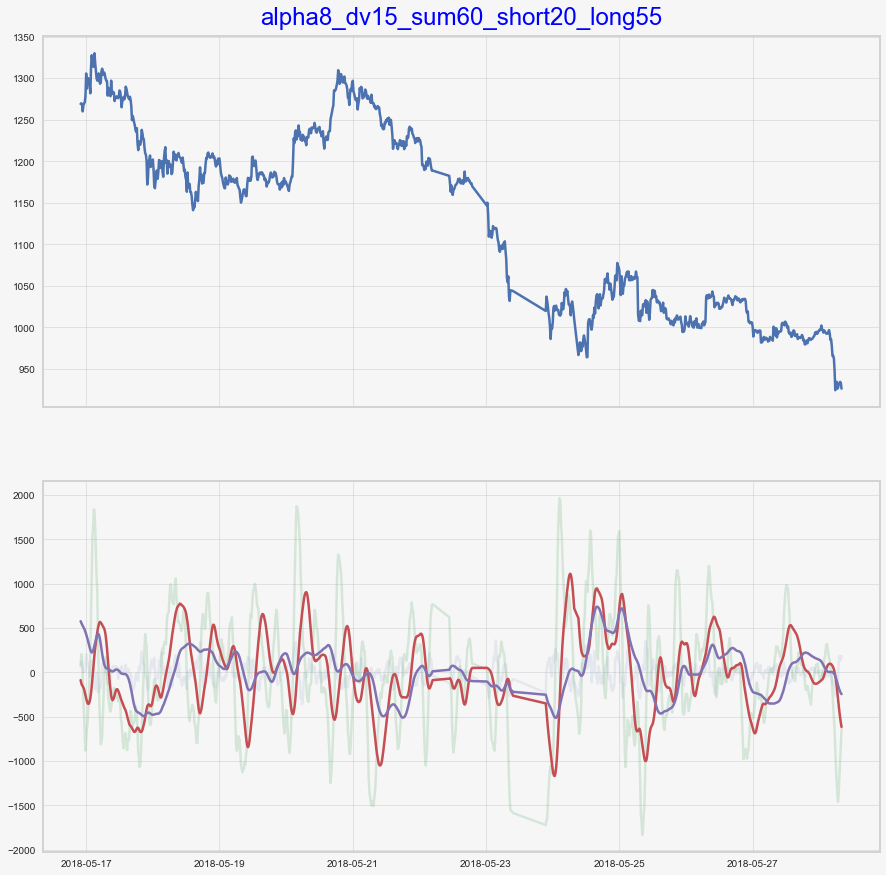

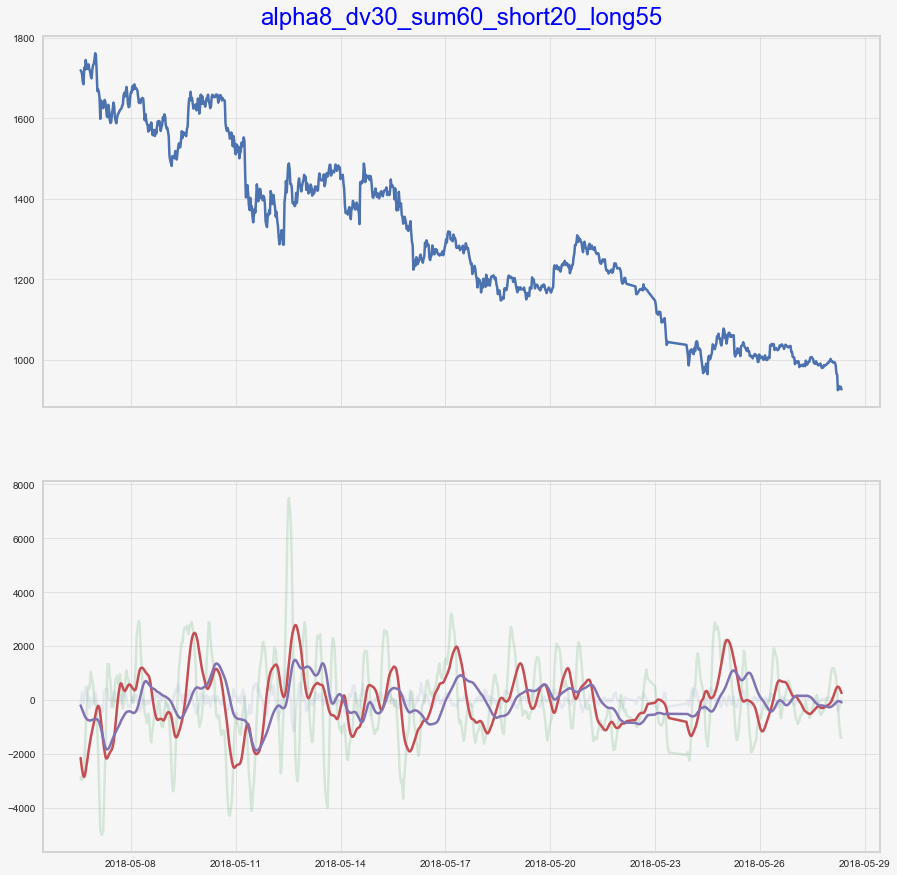

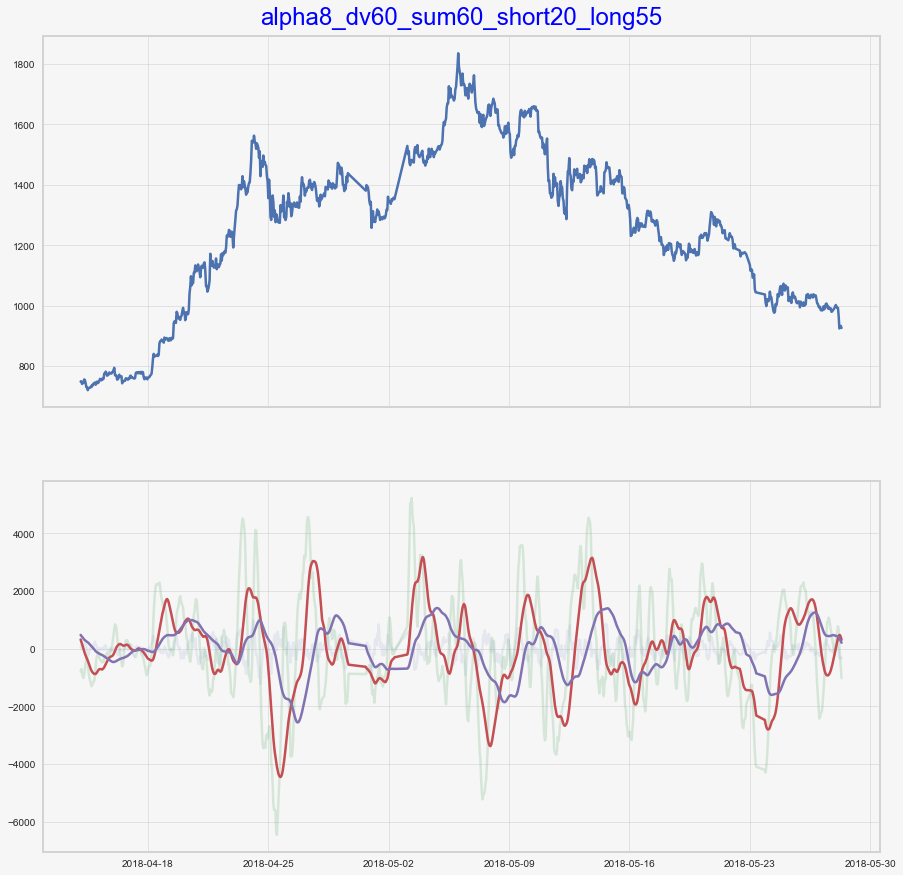

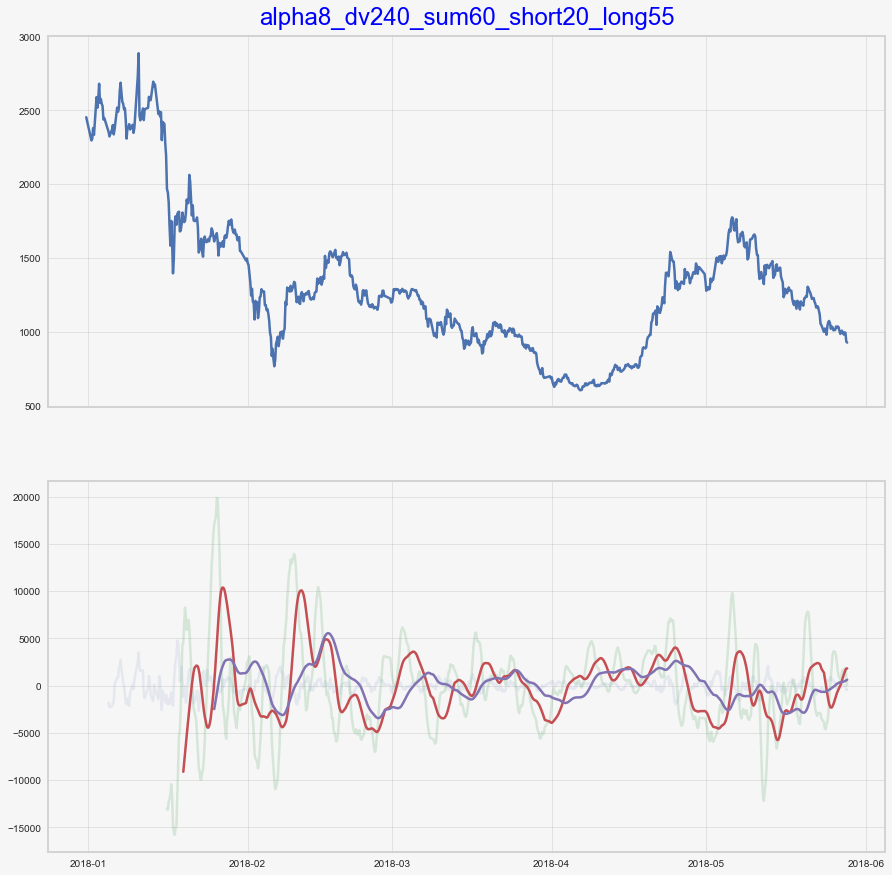

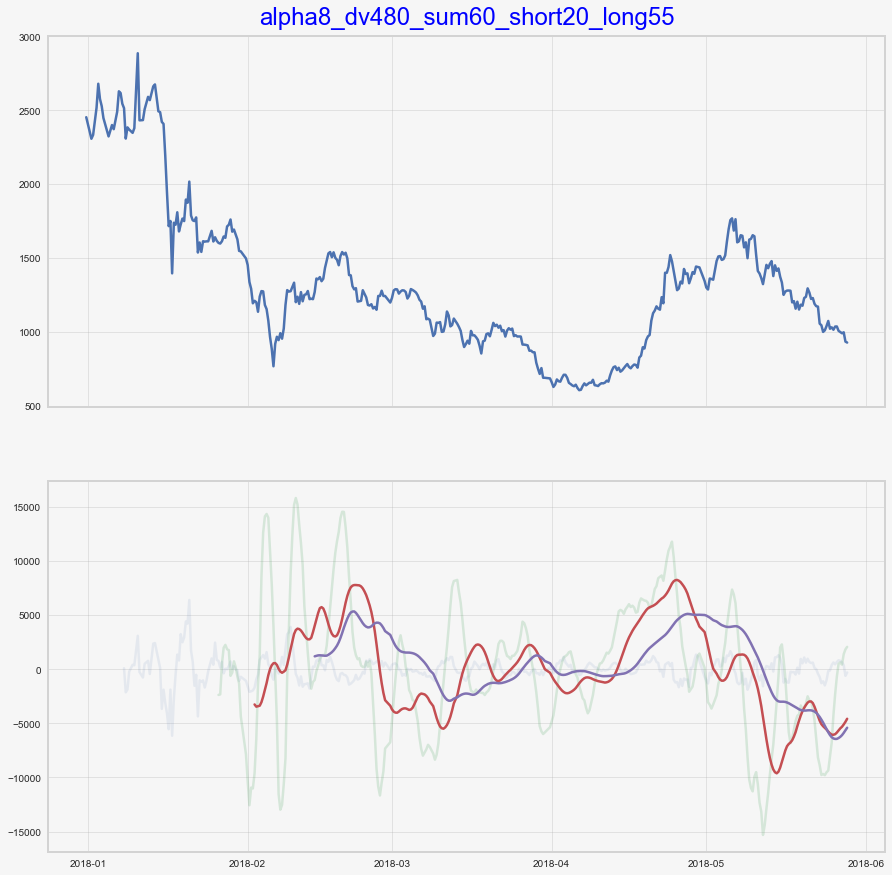

In [109]:
for name, alpha in alpha8_dict.items():
    Plot_Cumsum_SMA_LMA(globals()[name.split('_')[1]], alpha, chart_name=name+'_sum60_short20_long55',SumPeriod=50, ShortPeriod=20,LongPeriod=55, n=-1000)

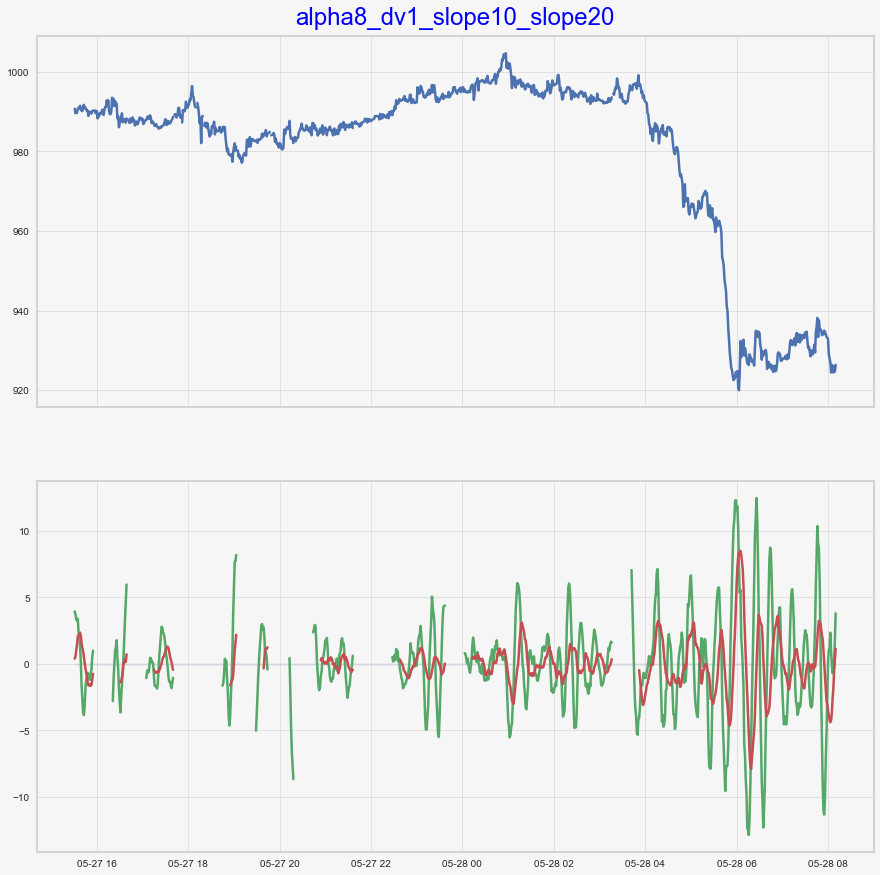

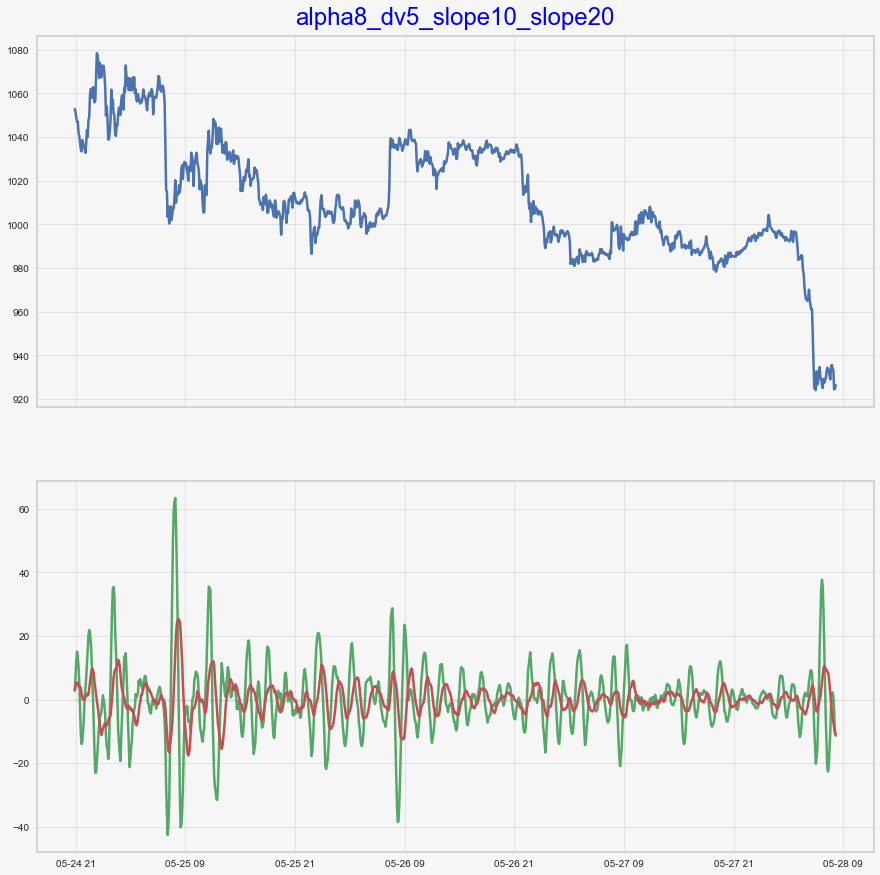

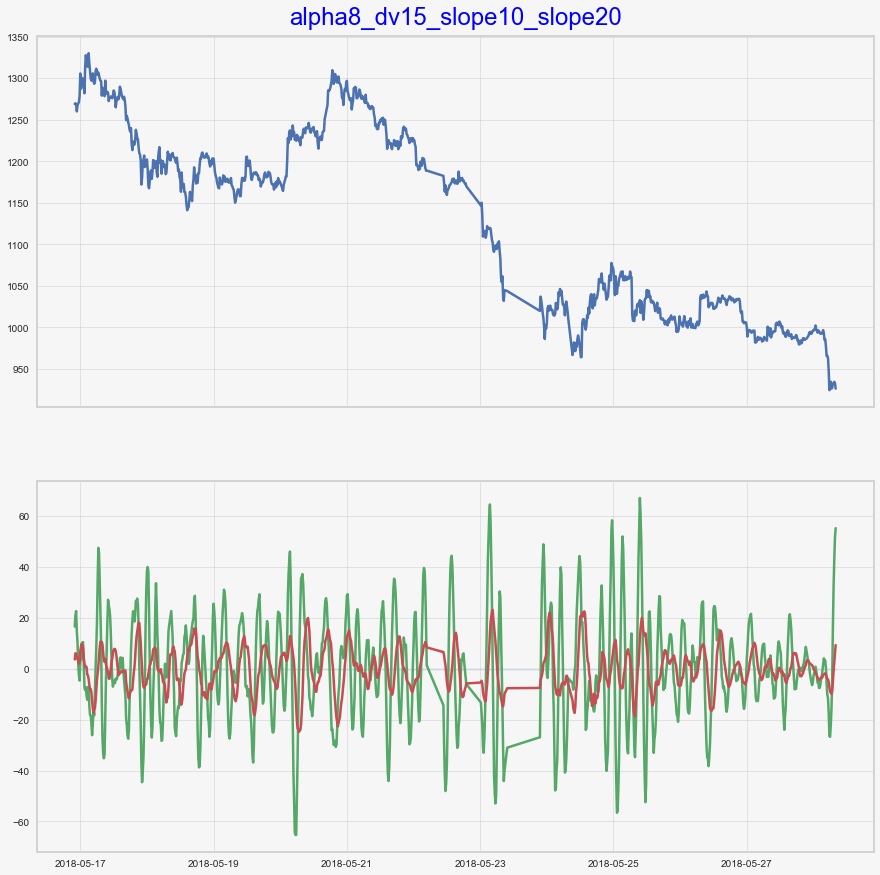

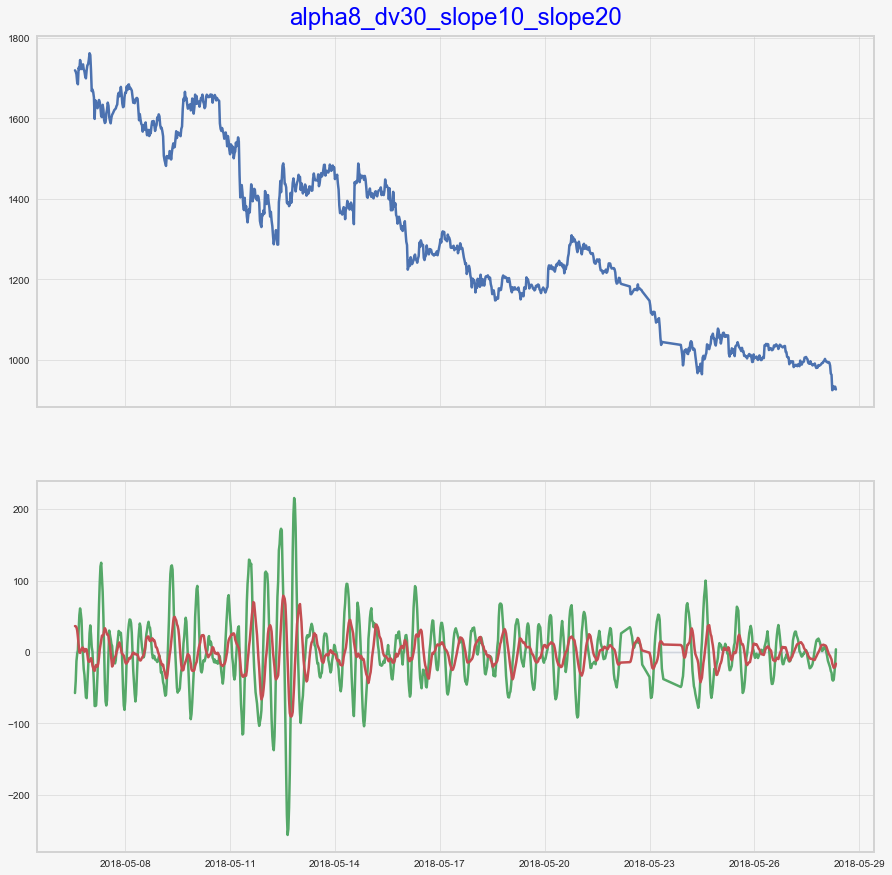

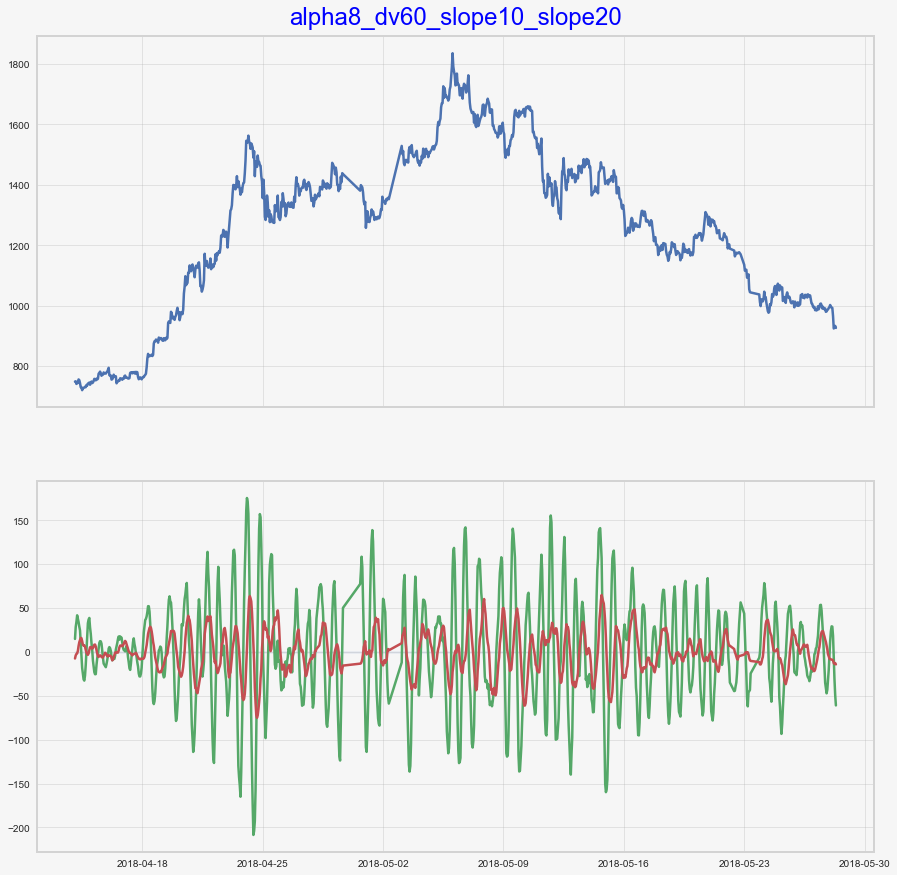

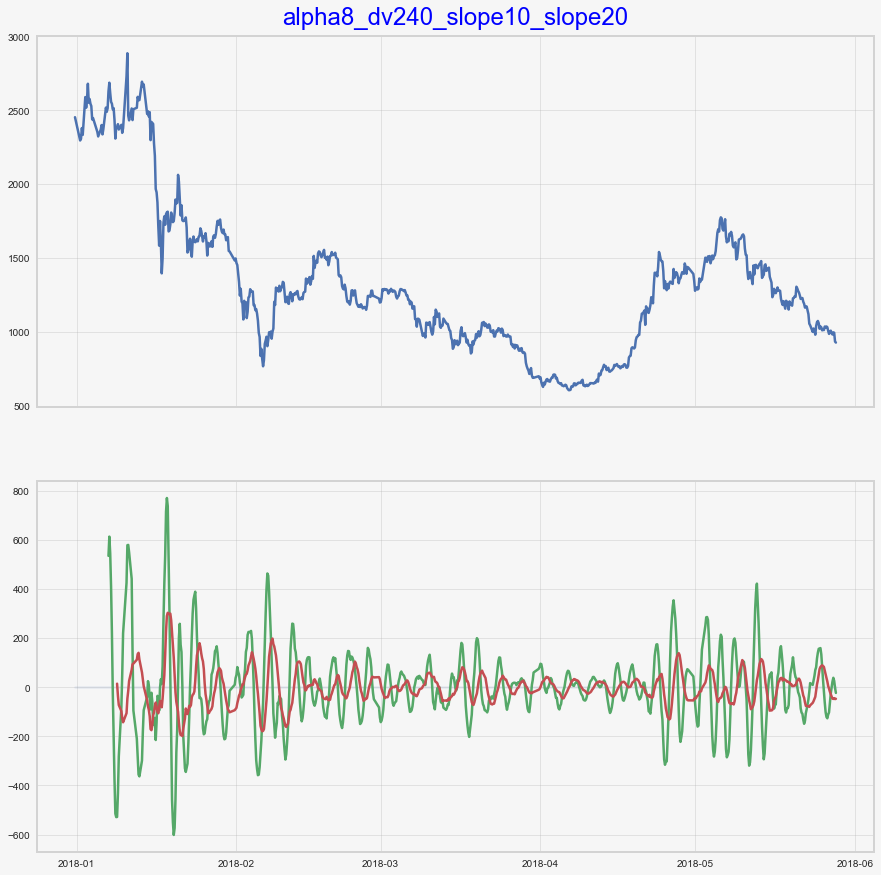

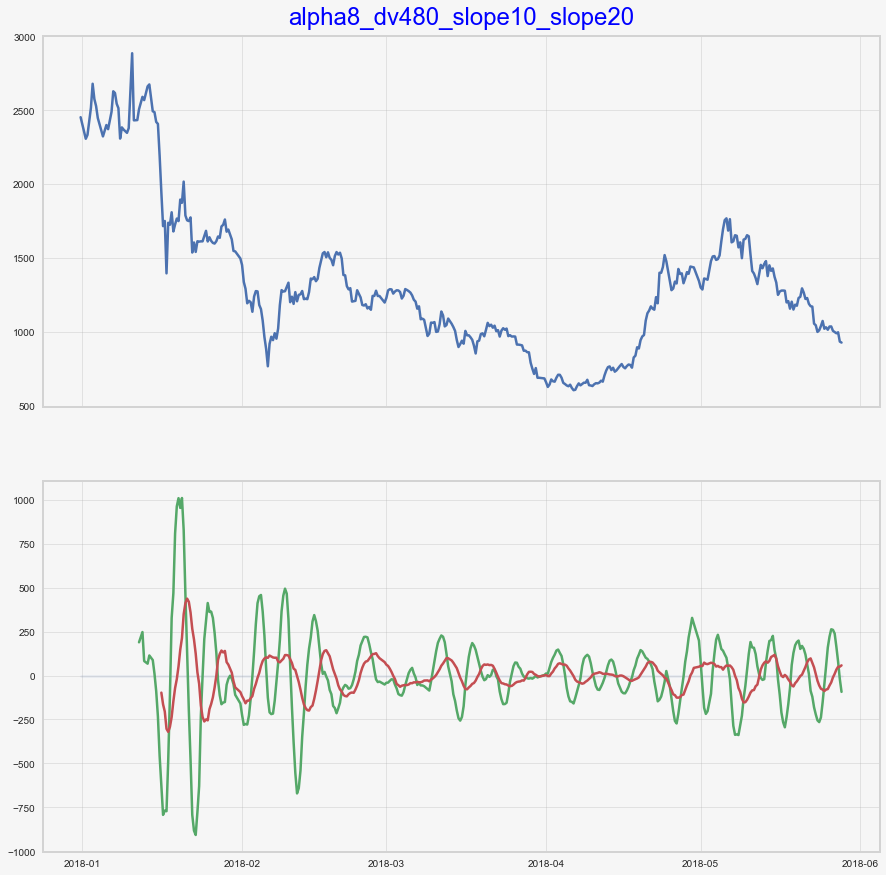

In [108]:
for name, alpha in alpha8_dict.items():
    Plot_Slope(globals()[name.split('_')[1]], alpha, chart_name=name+'_slope10_slope20',ShortPeriod=10, LongPeriod=20, n=-1000)

## Observation_Alpha9 = Alpha10

In [86]:
for dv in [dv1, dv5, dv15, dv30, dv60, dv240, dv480]:
    dv.add_formula('alpha9_C','-1*If(Ts_Min(Delta(close,1),5)>0,Delta(close,1),If((Ts_Max(Delta(close,1),5)<0),Delta(close,1),(-1*Delta(close,1))))',add_data=True)
dv_dict = {'alpha9_dv1':dv1, 'alpha9_dv5': dv5, 'alpha9_dv15':dv15, 'alpha9_dv30':dv30, 'alpha9_dv60':dv60, 'alpha9_dv240':dv240, 'alpha9_dv480':dv480}
alpha9_dict = {n: dv.get_ts('alpha9_C', date_type='datetime').btc_usdt for n, dv in dv_dict.items()}

Field [alpha9_C] is overwritten.
Field [alpha9_C] is overwritten.
Field [alpha9_C] is overwritten.
Field [alpha9_C] is overwritten.
Field [alpha9_C] is overwritten.
Field [alpha9_C] is overwritten.
Field [alpha9_C] is overwritten.


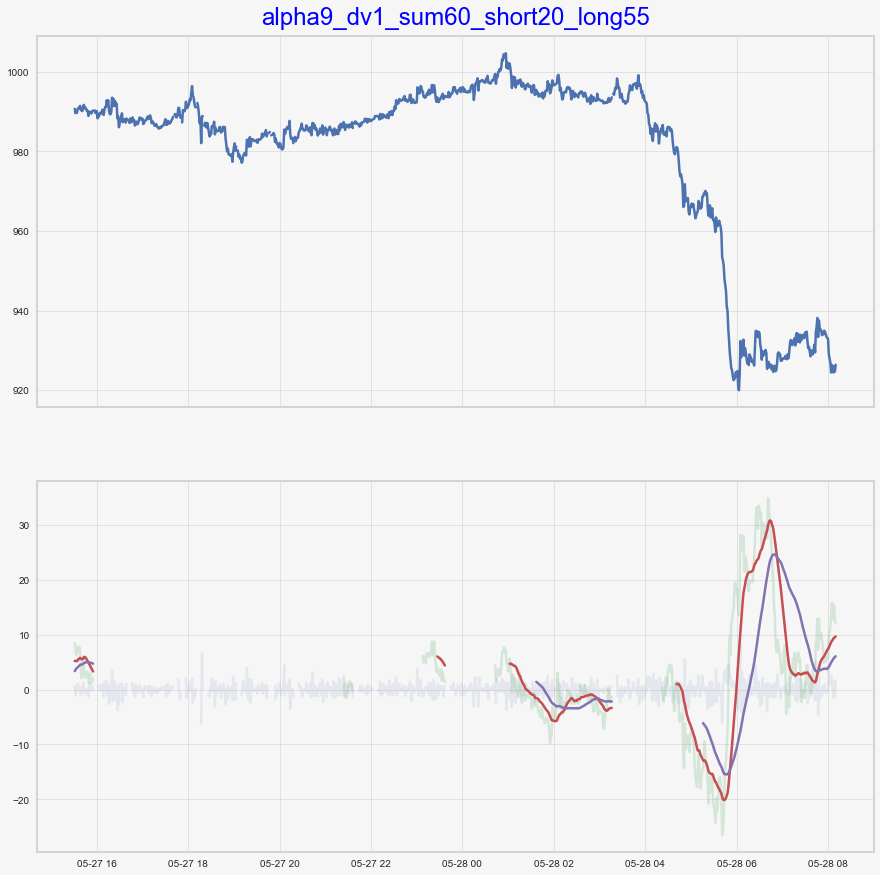

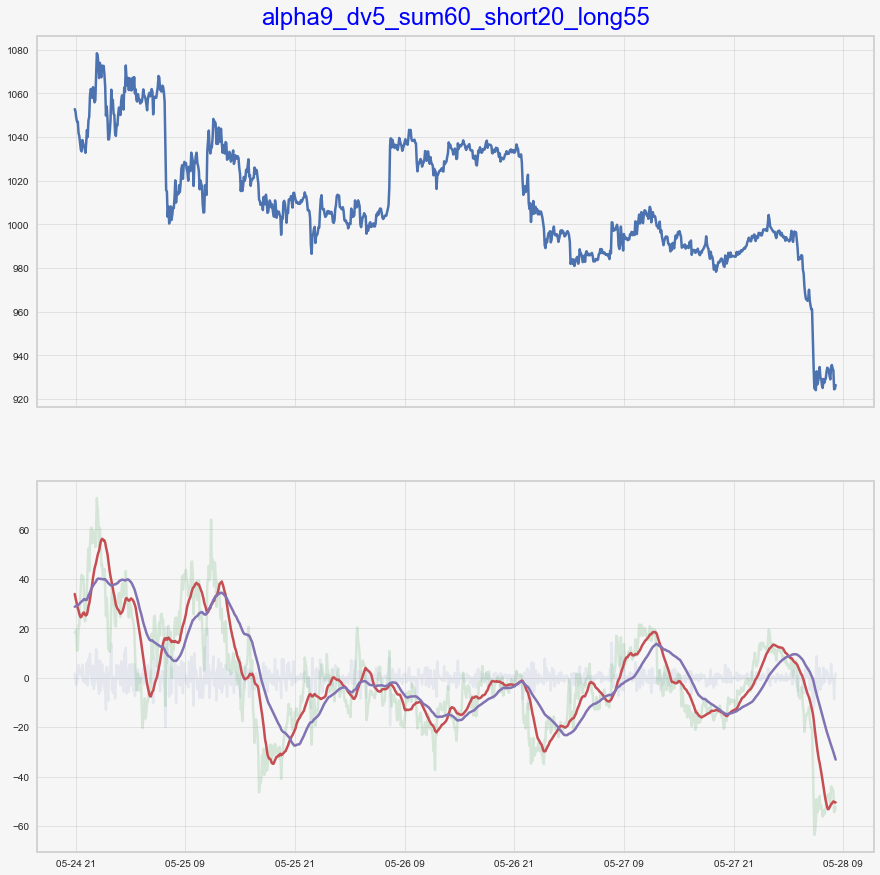

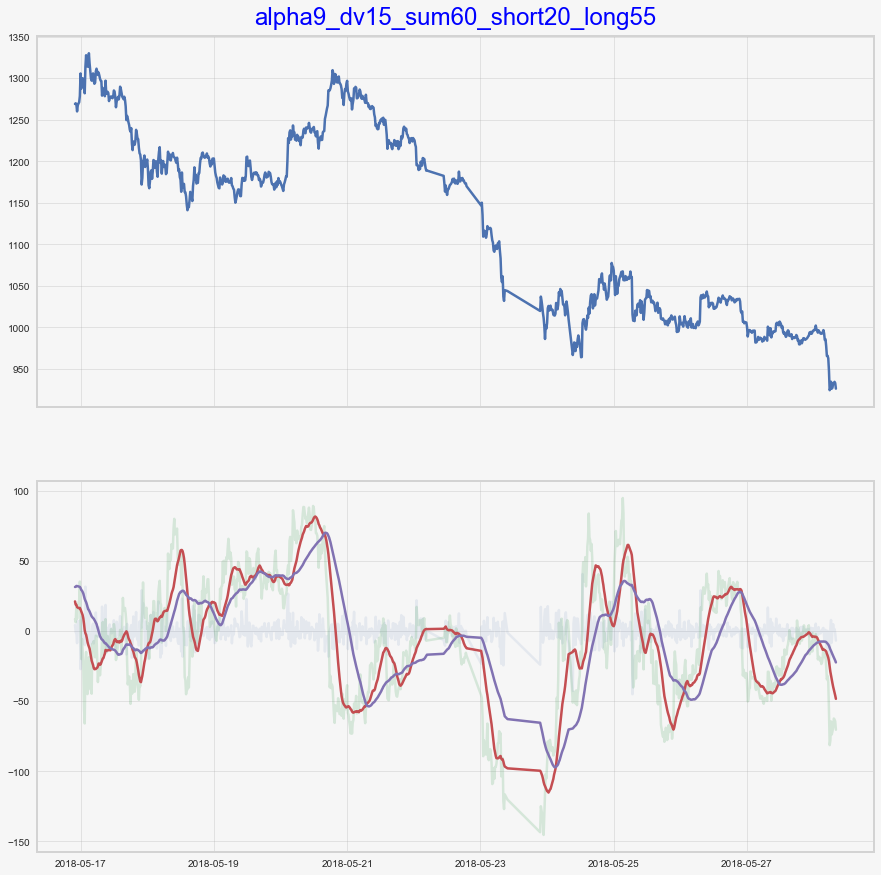

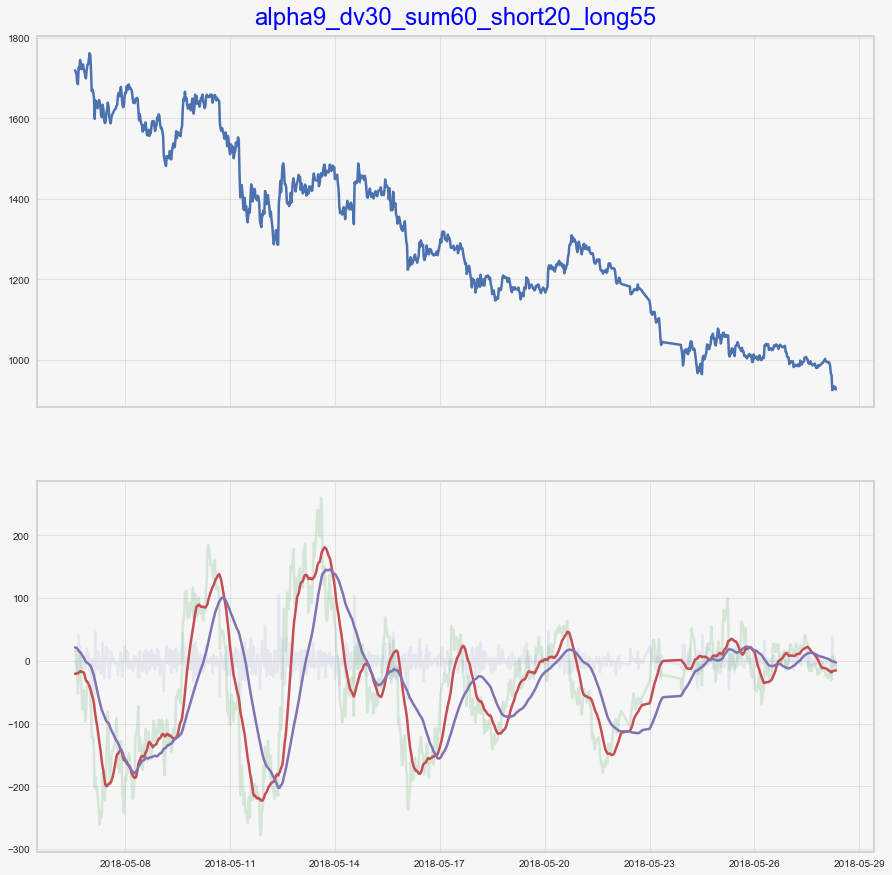

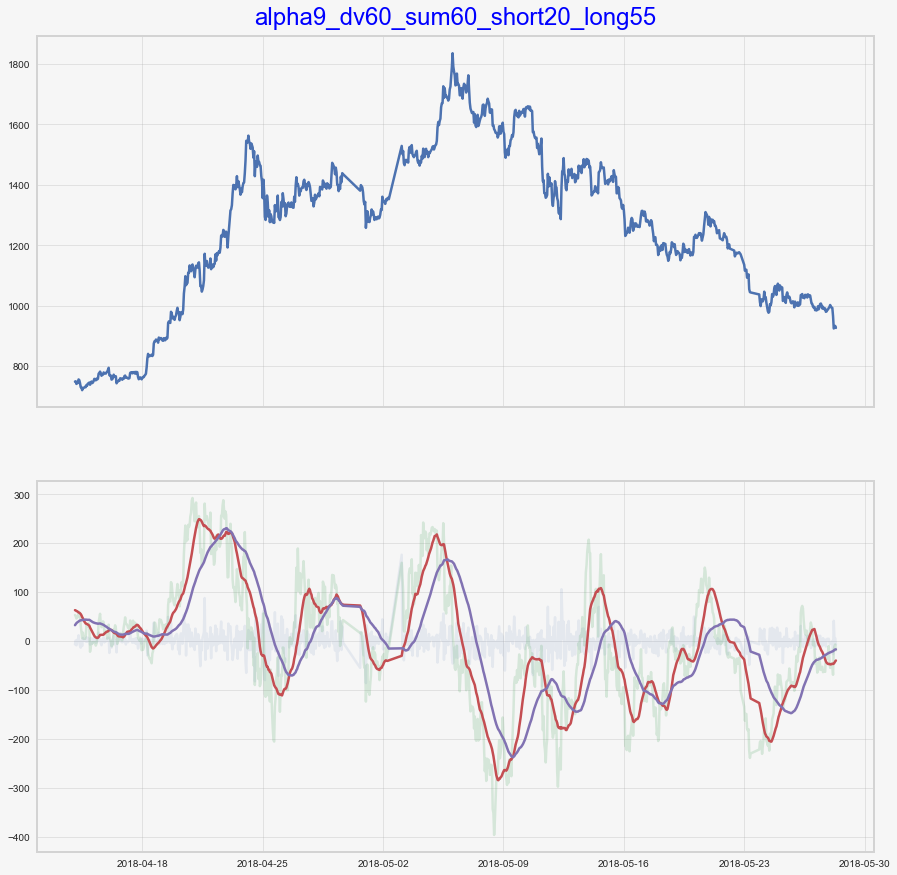

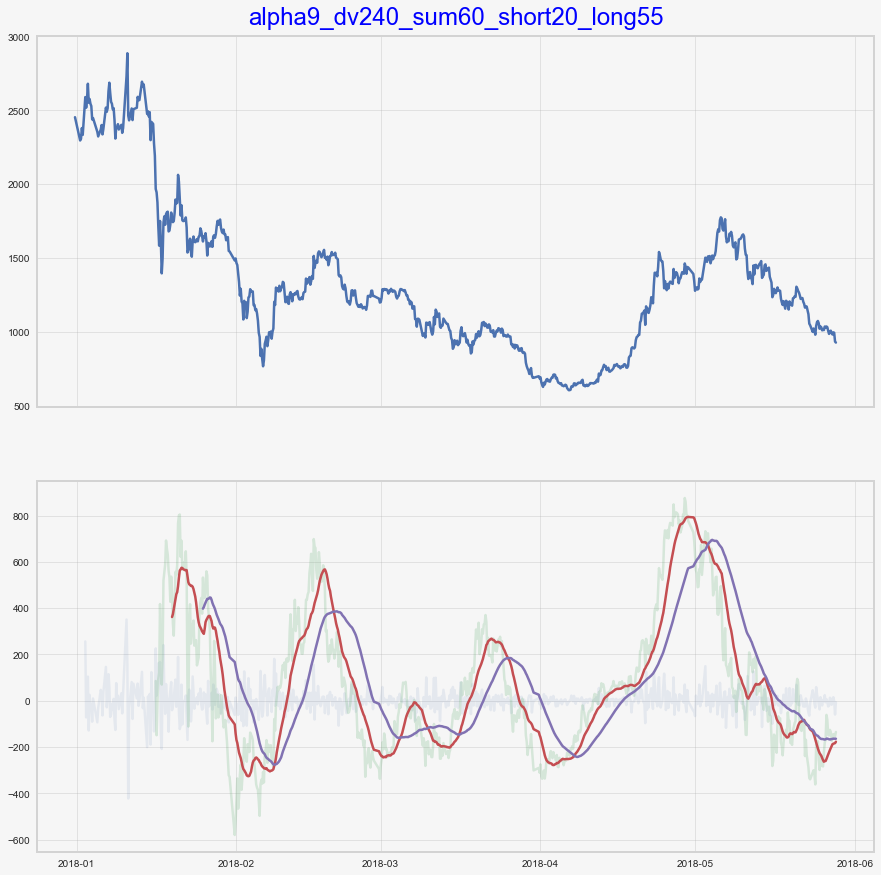

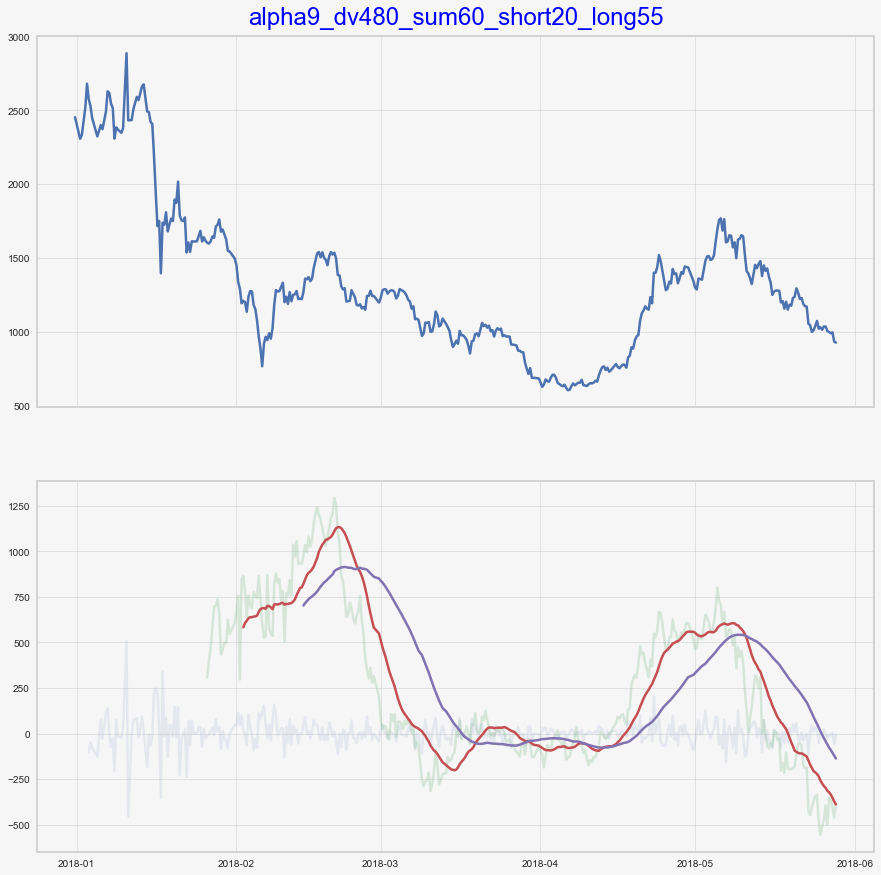

In [97]:
for name, alpha in alpha9_dict.items():
    Plot_Cumsum_SMA_LMA(globals()[name.split('_')[1]], alpha, chart_name=name+'_sum60_short20_long55',SumPeriod=60, ShortPeriod=20,LongPeriod=55, n=-1000)

In [102]:
# 进场信号 
long9 = dv240.add_formula("long9","If((Ts_Mean(Ts_Sum(alpha9_C,60),20)>Ts_Mean(Ts_Sum(alpha9_C,60),55)) && (Delay(Ts_Mean(Ts_Sum(alpha9_C,60),20),1)<Delay(Ts_Mean(Ts_Sum(alpha9_C,60),55),1)),2,0)", add_data=True)
short9 = dv240.add_formula("short9","If((Ts_Mean(Ts_Sum(alpha9_C,60),20)<Ts_Mean(Ts_Sum(alpha9_C,60),55)) && (Delay(Ts_Mean(Ts_Sum(alpha9_C,60),20),1)>Delay(Ts_Mean(Ts_Sum(alpha9_C,60),55),1)),-2,0)", add_data=True)

# 出场信号 
close_long9 = dv240.add_formula("close_long9","If(short9==-2,1,0)", add_data=True)
close_short9 = dv240.add_formula("close_short9","If(long9==2,-1,0)", add_data=True)

# 汇总
enter9 = dv240.add_formula("enter9","long9+short9", add_data=True)
exit9 = dv240.add_formula("exit9","close_long9+close_short9", add_data=True) 

Field [long9] is overwritten.
Field [short9] is overwritten.
Field [close_long9] is overwritten.
Field [close_short9] is overwritten.
Field [enter9] is overwritten.
Field [exit9] is overwritten.


In [103]:
from jaqs_fxdayu.research import TimingDigger

# step 1：实例化TimingDigger 通过output_folder和output_format指定测试报告的输出路径和输出格式，通过signal_name指定绩效文件名称
td9 = TimingDigger(output_folder=".", output_format='pdf')

# 多空分别计算一遍 输出汇总结果
td9.process_signal(
    enter_signal=dv240.get_ts("long9"),
    exit_signal=dv240.get_ts("close_long9"),
    sig_type="long",  # 信号类型 long/short
    price=dv240.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.3,  # 止损百分比 负数 可为空
#     stopprofit=0.6,  # 止盈百分比 正数 可为空
)

#多空分别计算一遍 输出汇总结果
td9.process_signal(
    enter_signal=dv240.get_ts("short9"),
    exit_signal=dv240.get_ts("close_short9"),
    sig_type="short",  # 信号类型 long/short
    price=dv240.get_ts("close"),
    max_holding_period=100,  # 最大持有天数 可为空
#     stoploss=-0.01,  # 止损百分比 负数 可为空
#     stopprofit=0.03,  # 止盈百分比 正数 可为空
)

Nan Data Count (should be zero) : 0;  Percentage of effective data: 0%
Nan Data Count (should be zero) : 0;  Percentage of effective data: 0%


In [104]:
td9.create_event_report(sig_type="long_short",
                       by_symbol=True)

*****-Summary-*****
Event Analysis
                      win   loss    all
t-stat              1.917 -1.549  1.552
p-value             0.113  0.365  0.165
mean                0.371 -0.106  0.252
std                 0.432  0.068  0.429
info_ratio          0.857 -1.549  0.587
skewness            1.643 -0.000  1.754
kurtosis            0.929 -2.000  1.951
pct5                0.081 -0.167 -0.126
pct25               0.162 -0.140  0.032
pct50               0.174 -0.106  0.164
pct75               0.302 -0.072  0.221
pct95               1.075 -0.044  0.977
occurance           6.000  2.000  8.000
win_ratio             NaN    NaN  0.750
win_mean/loss_mean    NaN    NaN  3.504


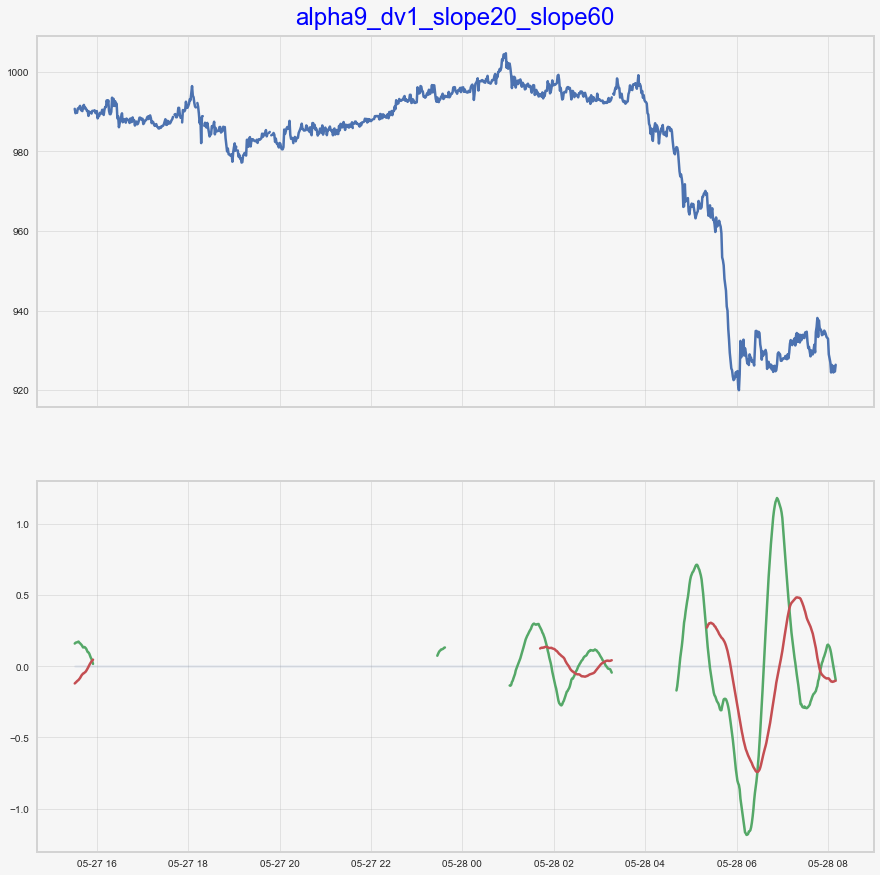

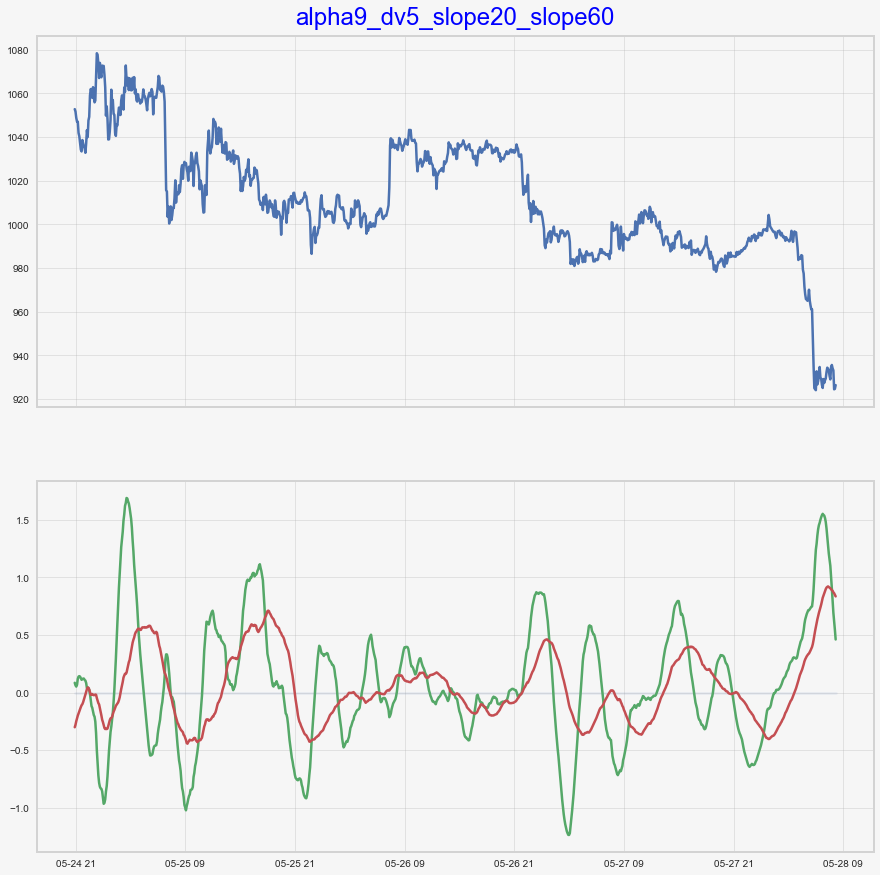

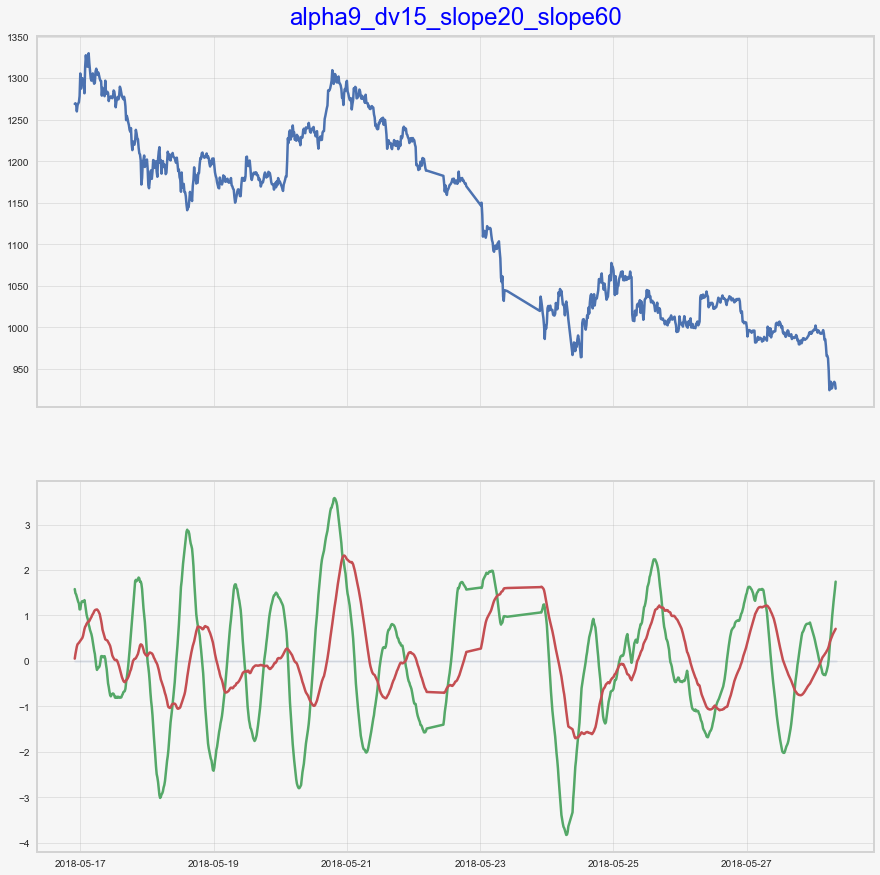

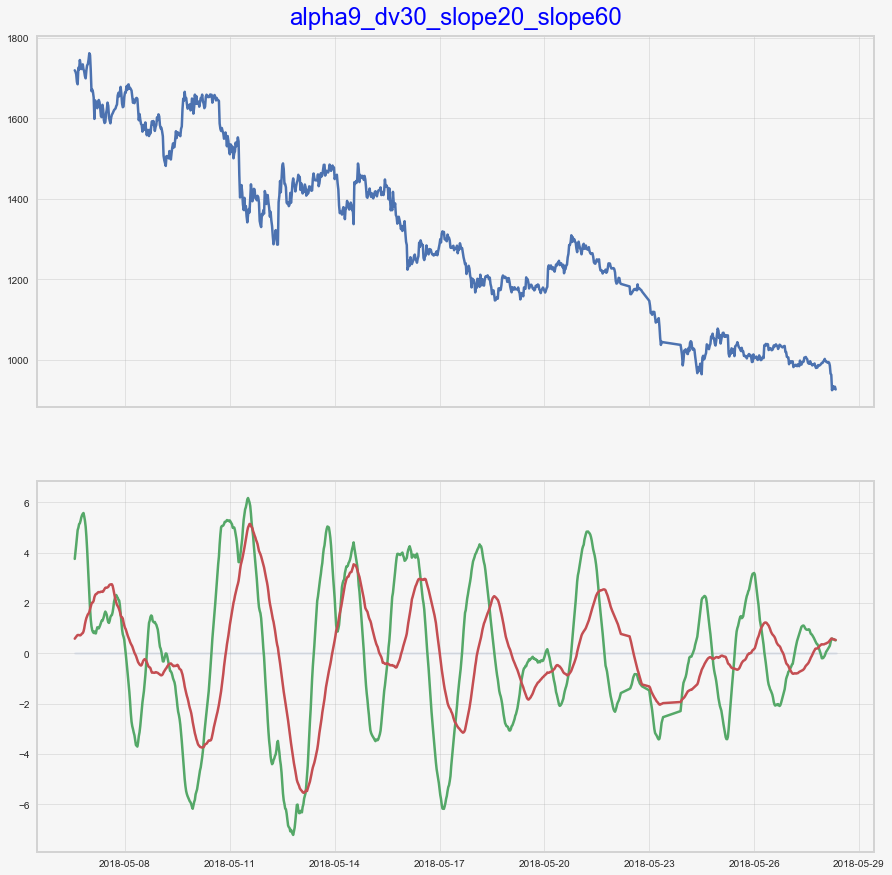

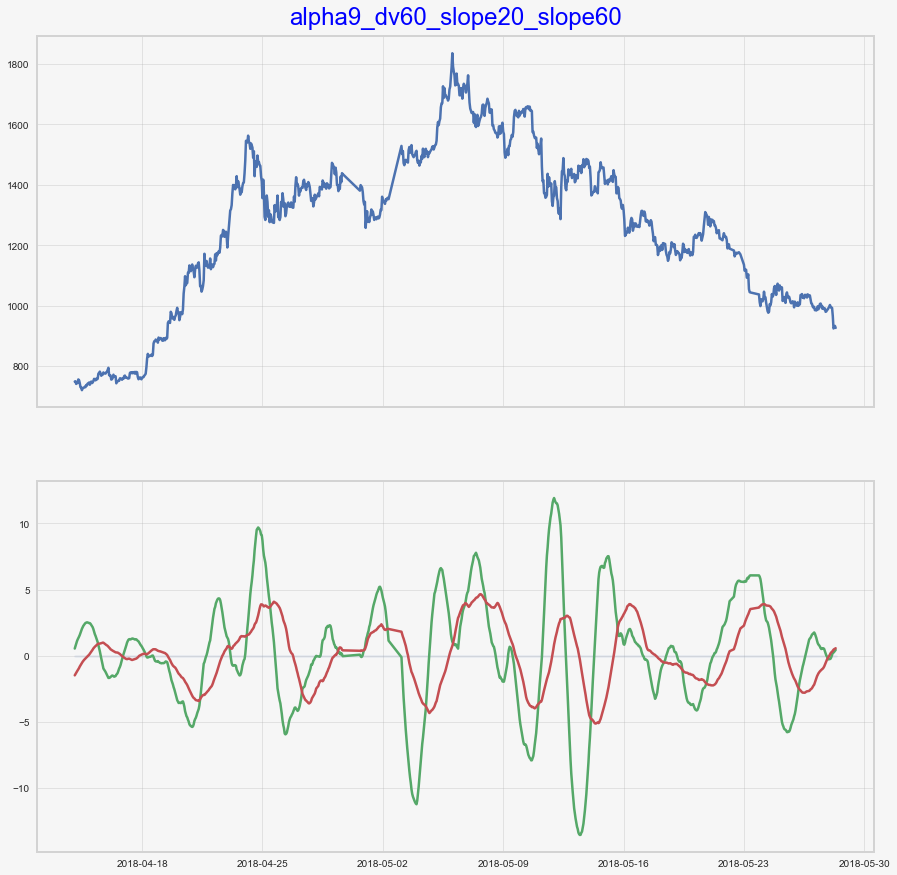

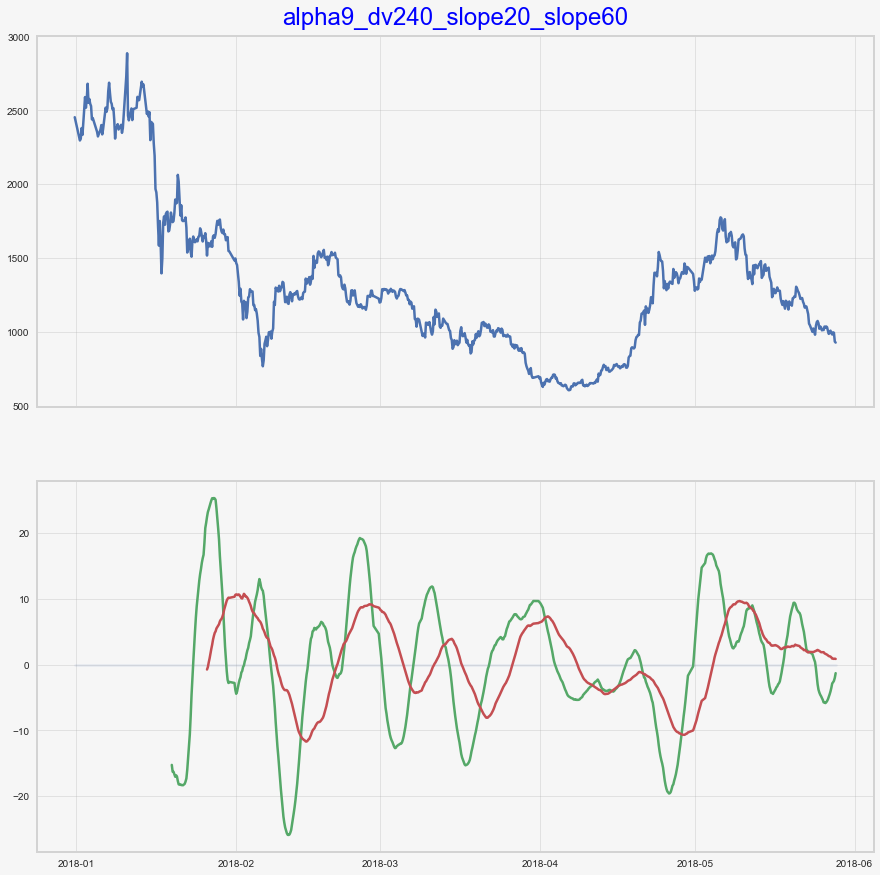

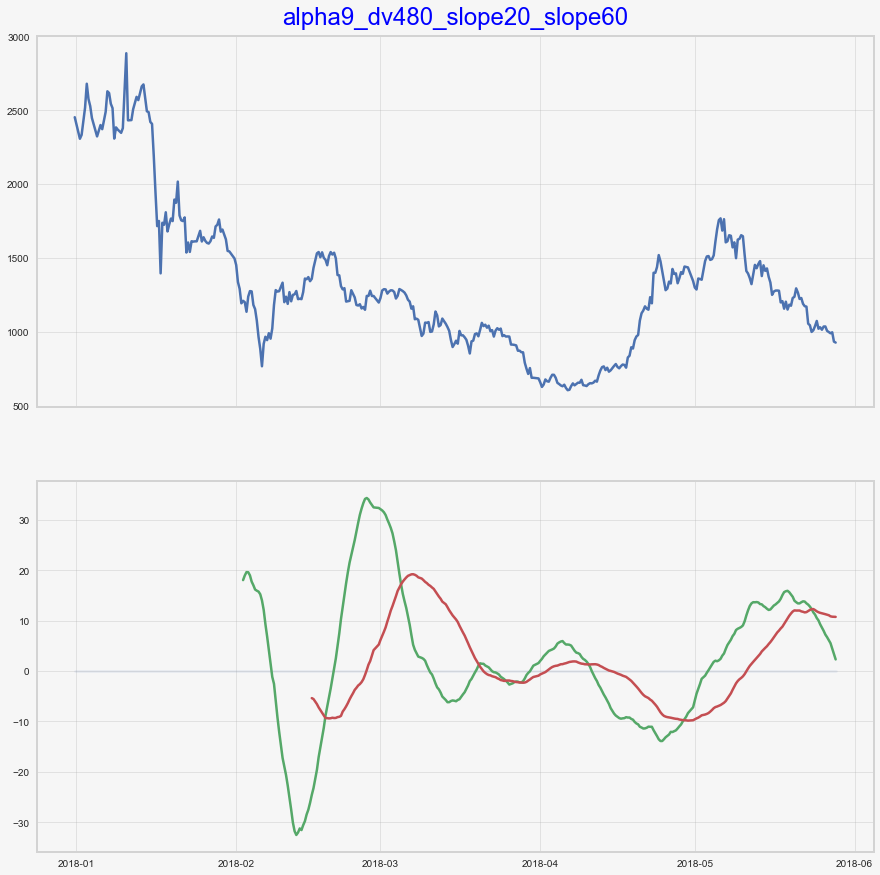

In [41]:
for name, alpha in alpha9_dict.items():
    Plot_Slope_Sum(globals()[name.split('_')[1]], alpha, chart_name=name+'_slope20_slope60',ShortPeriod=40, LongPeriod=80, n=-1000)